# COMP9444 26T2 Project 005: Intelligent Food Image Recognition

Team: CXY

Member:


## 1. Introduction, Motivation, and Problem Statement

Food image recognition can support diet monitoring, nutrition management, and health-related applications.
In this project, the task is **semantic segmentation**, not image-level classification.
Given a food image, the model predicts a class label for every pixel, separating food regions from the background
and identifying which food category each food pixel belongs to.

The main challenge is that food images contain many visually similar classes, irregular shapes, small regions,
and unclear boundaries. Therefore, the project compares several convolutional segmentation baselines and then
tests whether data augmentation, multi-scale context, attention, and data rebalancing can improve performance.

## 2. Setup and Imports

This cell imports the libraries used for data loading, visualisation, model definition, training, evaluation, and saving the best checkpoints.

In [1]:
import json
import math
import random
import time
from collections import Counter, defaultdict
from pathlib import Path

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from IPython.display import display
from PIL import Image, ImageEnhance
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torchvision.models import (
    DenseNet121_Weights,
    EfficientNet_B0_Weights,
    ResNet50_Weights,
    VGG16_Weights,
    densenet121,
    efficientnet_b0,
    resnet50,
    vgg16,
)
from tqdm.std import tqdm

try:
    from google.colab import drive
    drive.mount("/content/drive", force_remount=False)
except Exception:
    pass

plt.rcParams["figure.dpi"] = 120
pd.set_option("display.max_columns", 30)


Mounted at /content/drive


## 3. Constants and Project Paths

This cell finds the project root automatically for local VS Code or Colab environments. It also defines shared constants so every experiment uses the same input size, label space, and checkpoint folder.

In [2]:
CANDIDATE_ROOTS = [
    Path.cwd().resolve(),
    Path("/content/drive/MyDrive/COMP9444/9444"),
    Path("/content/9444"),
]


def find_project_root():
    for root in CANDIDATE_ROOTS:
        data_root = root / "UECFOODPIX" / "data" / "UECFoodPIX"
        if data_root.exists():
            return root
    checked = "\n".join(str(root) for root in CANDIDATE_ROOTS)
    raise FileNotFoundError("Could not find project root. Checked:\n" + checked)


PROJECT_ROOT = find_project_root()
DATA_DIR = PROJECT_ROOT / "UECFOODPIX" / "data"
FOODPIX_ROOT = DATA_DIR / "UECFoodPIX"
OFFICIAL_TRAIN_LIST = DATA_DIR / "train9000.txt"
OFFICIAL_TEST_LIST = DATA_DIR / "test1000.txt"
CATEGORY_FILE = DATA_DIR / "category.txt"
BEST_MODEL_DIR = PROJECT_ROOT / "Best_Model"
BEST_MODEL_DIR.mkdir(parents=True, exist_ok=True)

SPLIT_TRAIN_SIZE = 3000
SPLIT_VAL_SIZE = 500
SPLIT_FILE = PROJECT_ROOT / f"uecfoodpix_split_train{SPLIT_TRAIN_SIZE}_val{SPLIT_VAL_SIZE}.json"

NUM_CLASSES = 103
FOOD_CLASSES = 102
BACKGROUND_LABEL = 0
WIDTH = 384
HEIGHT = 320
BATCH_SIZE = 16
MAX_EPOCHS = 25
NUM_WORKERS = 0
SEED = 9444
RUN_TRAINING = True


def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = True


seed_everything(SEED)

print("Project root:", PROJECT_ROOT)
print("Dataset root:", FOODPIX_ROOT)
print("Split file:", SPLIT_FILE)
print("Best model directory:", BEST_MODEL_DIR)
print(f"Input size: {WIDTH} x {HEIGHT}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Max epochs: {MAX_EPOCHS}")


Project root: /content/drive/MyDrive/COMP9444/9444
Dataset root: /content/drive/MyDrive/COMP9444/9444/UECFOODPIX/data/UECFoodPIX
Split file: /content/drive/MyDrive/COMP9444/9444/uecfoodpix_split_train3000_val500.json
Best model directory: /content/drive/MyDrive/COMP9444/9444/Best_Model
Input size: 384 x 320
Batch size: 16
Max epochs: 25


## 4. Data Source and Reproducible Train/Validation Split

The project uses the **UECFoodPIX** dataset. Each sample has an RGB image and a pixel-level mask. Label `0` is background, and labels `1-102` are food classes.

All experiments use the same selected subset: **3000 training images** and **500 validation images** sampled from the official `train9000` list. The sampling is approximately stratified by the dominant foreground class, and the official test set is kept untouched.


In [3]:
def read_id_list(list_file):
    return [line.strip() for line in Path(list_file).read_text(encoding="utf-8").splitlines() if line.strip()]


def read_mask_raw(mask_path):
    mask = np.asarray(Image.open(mask_path))
    if mask.ndim == 3:
        mask = mask[..., 0]
    return mask.astype(np.int64)


def dominant_class(mask_path):
    mask = read_mask_raw(mask_path)
    counts = np.bincount(mask.ravel(), minlength=NUM_CLASSES)
    counts[BACKGROUND_LABEL] = 0
    return int(counts.argmax())


def proportional_sample(ids, labels, sample_size, seed):
    groups = defaultdict(list)
    for image_id in ids:
        groups[labels[image_id]].append(image_id)

    total = len(ids)
    raw_quota = {class_id: sample_size * len(group) / total for class_id, group in groups.items()}
    quota = {class_id: int(value) for class_id, value in raw_quota.items()}
    remaining = sample_size - sum(quota.values())

    order = sorted(
        groups,
        key=lambda class_id: (raw_quota[class_id] - quota[class_id], len(groups[class_id]), -class_id),
        reverse=True,
    )
    for class_id in order[:remaining]:
        quota[class_id] += 1

    rng = random.Random(seed)
    selected = []
    for class_id in sorted(groups):
        group = sorted(groups[class_id])
        rng.shuffle(group)
        selected.extend(group[:quota[class_id]])
    rng.shuffle(selected)
    return selected


def create_train_val_split(output_file=SPLIT_FILE, train_size=SPLIT_TRAIN_SIZE, val_size=SPLIT_VAL_SIZE, seed=SEED):
    all_ids = read_id_list(OFFICIAL_TRAIN_LIST)
    mask_dir = FOODPIX_ROOT / "train" / "mask"
    labels = {
        image_id: dominant_class(mask_dir / f"{image_id}.png")
        for image_id in tqdm(all_ids, desc="Read masks for split", ascii=True)
    }

    selected_train_ids = proportional_sample(all_ids, labels, train_size, seed)
    selected_train_set = set(selected_train_ids)
    remaining_ids = [image_id for image_id in all_ids if image_id not in selected_train_set]
    selected_val_ids = proportional_sample(remaining_ids, labels, val_size, seed + 1)

    assert len(selected_train_ids) == train_size
    assert len(selected_val_ids) == val_size
    assert len(set(selected_train_ids)) == train_size
    assert len(set(selected_val_ids)) == val_size
    assert not (set(selected_train_ids) & set(selected_val_ids))

    split_data = {
        "train_size": train_size,
        "val_size": val_size,
        "train_seed": seed,
        "val_seed": seed + 1,
        "sampling_method": "dominant-class proportional sampling from official train9000",
        "train_ids": selected_train_ids,
        "val_ids": selected_val_ids,
    }
    output_file.write_text(json.dumps(split_data, indent=2, ensure_ascii=False), encoding="utf-8")
    return split_data


RECREATE_SPLIT = False
if RECREATE_SPLIT or not SPLIT_FILE.exists():
    split_info = create_train_val_split()
    print("Created split file:", SPLIT_FILE)
else:
    split_info = json.loads(SPLIT_FILE.read_text(encoding="utf-8"))
    print("Using existing split file:", SPLIT_FILE)

train_ids = [str(item) for item in split_info["train_ids"]]
val_ids = [str(item) for item in split_info["val_ids"]]
assert len(train_ids) == SPLIT_TRAIN_SIZE
assert len(val_ids) == SPLIT_VAL_SIZE
assert not (set(train_ids) & set(val_ids))
print("Train images:", len(train_ids))
print("Validation images:", len(val_ids))
print("Overlap:", len(set(train_ids) & set(val_ids)))


Using existing split file: /content/drive/MyDrive/COMP9444/9444/uecfoodpix_split_train3000_val500.json
Train images: 3000
Validation images: 500
Overlap: 0


## 5. Dataset Overview and Label Loading

This cell loads class names, builds image/mask pairs, and compares the official split with the smaller project split used for training and validation.


,Split,Images,Image folder,Mask folder,Role
0,Official train,9000,train/img,train/mask,Source pool
1,Selected train,3000,train/img,train/mask,Model training
2,Validation,500,train/img,train/mask,Model selection
3,Official test,1000,test/img,test/mask,Final test


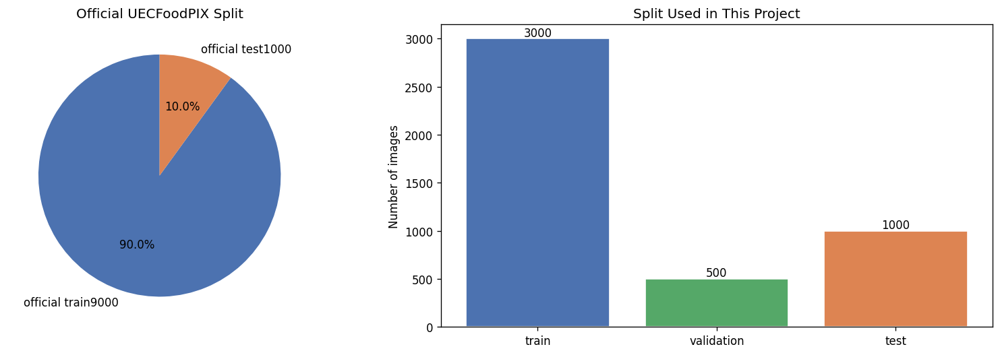

Number of output labels: 103 = 1 background + 102 food classes
First 10 food labels: ['rice', 'eels on rice', 'pilaf', "chicken-'n'-egg on rice", 'pork cutlet on rice', 'beef curry', 'sushi', 'chicken rice', 'fried rice', 'tempura bowl']


In [4]:
def load_test_ids(foodpix_root):
    if OFFICIAL_TEST_LIST.exists():
        return read_id_list(OFFICIAL_TEST_LIST)
    return sorted(path.stem for path in (foodpix_root / "test" / "img").glob("*.jpg"))


def load_class_names(category_file, num_classes=NUM_CLASSES):
    names = [f"class_{index}" for index in range(num_classes)]
    names[BACKGROUND_LABEL] = "background"
    for row in Path(category_file).read_text(encoding="utf-8", errors="replace").splitlines():
        row = row.strip()
        if not row or row.lower().startswith("id"):
            continue
        parts = row.split(maxsplit=1)
        if len(parts) != 2:
            continue
        try:
            class_id = int(parts[0])
        except ValueError:
            continue
        if 0 <= class_id < num_classes:
            names[class_id] = parts[1]
    return names


def build_pairs(split, image_ids):
    return [
        (FOODPIX_ROOT / split / "img" / f"{image_id}.jpg", FOODPIX_ROOT / split / "mask" / f"{image_id}.png")
        for image_id in image_ids
    ]


test_ids = load_test_ids(FOODPIX_ROOT)
CLASS_NAMES = load_class_names(CATEGORY_FILE)
train_pairs = build_pairs("train", train_ids)
val_pairs = build_pairs("train", val_ids)
test_pairs = build_pairs("test", test_ids)
official_train_ids = read_id_list(OFFICIAL_TRAIN_LIST)

dataset_summary = pd.DataFrame({
    "Split": ["Official train", "Selected train", "Validation", "Official test"],
    "Images": [len(official_train_ids), len(train_ids), len(val_ids), len(test_ids)],
    "Image folder": ["train/img", "train/img", "train/img", "test/img"],
    "Mask folder": ["train/mask", "train/mask", "train/mask", "test/mask"],
    "Role": ["Source pool", "Model training", "Model selection", "Final test"],
})
display(dataset_summary)

fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))
axes[0].pie([len(official_train_ids), len(test_ids)], labels=["official train9000", "official test1000"], autopct="%1.1f%%", colors=["#4C72B0", "#DD8452"], startangle=90)
axes[0].set_title("Official UECFoodPIX Split")
bars = axes[1].bar(["train", "validation", "test"], [len(train_ids), len(val_ids), len(test_ids)], color=["#4C72B0", "#55A868", "#DD8452"], edgecolor="white")
for bar in bars:
    axes[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 25, int(bar.get_height()), ha="center")
axes[1].set_title("Split Used in This Project")
axes[1].set_ylabel("Number of images")
plt.tight_layout()
plt.show()

print("Number of output labels:", len(CLASS_NAMES), "= 1 background + 102 food classes")
print("First 10 food labels:", CLASS_NAMES[1:11])


## 6. EDA: Class and Pixel Statistics

This cell scans masks and counts each class at image level and pixel level. This gives both class occurrence frequency and actual segmentation area frequency.


In [5]:
def load_mask_array(split, image_id):
    mask_path = FOODPIX_ROOT / split / "mask" / f"{image_id}.png"
    mask_array = read_mask_raw(mask_path)
    return np.where((0 <= mask_array) & (mask_array < NUM_CLASSES), mask_array, BACKGROUND_LABEL)


def count_split_classes(split, image_ids):
    image_counts = np.zeros(NUM_CLASSES, dtype=np.int64)
    pixel_counts = np.zeros(NUM_CLASSES, dtype=np.int64)
    image_labels = {}
    for image_id in tqdm(image_ids, desc=f"Counting {split}", ascii=True):
        mask_array = load_mask_array(split, image_id)
        labels, counts = np.unique(mask_array, return_counts=True)
        image_counts[labels] += 1
        pixel_counts[labels] += counts
        image_labels[image_id] = labels.tolist()
    return image_counts, pixel_counts, image_labels


train_image_counts, train_pixel_counts, train_image_labels = count_split_classes("train", train_ids)
val_image_counts, val_pixel_counts, val_image_labels = count_split_classes("train", val_ids)
test_image_counts, test_pixel_counts, test_image_labels = count_split_classes("test", test_ids)

class_stats = pd.DataFrame({
    "class_id": np.arange(NUM_CLASSES),
    "class_name": CLASS_NAMES,
    "train_images": train_image_counts,
    "val_images": val_image_counts,
    "test_images": test_image_counts,
    "train_pixels": train_pixel_counts,
    "val_pixels": val_pixel_counts,
    "test_pixels": test_pixel_counts,
})
class_stats["train_pixel_percent"] = class_stats["train_pixels"] / max(class_stats["train_pixels"].sum(), 1) * 100
foreground_stats = class_stats[class_stats["class_id"] != BACKGROUND_LABEL].copy()
background_percent = float(class_stats.loc[class_stats["class_id"] == BACKGROUND_LABEL, "train_pixel_percent"].iloc[0])

print(f"Background pixel percentage in training masks: {background_percent:.2f}%")
print("Foreground image count min / median / max:", int(foreground_stats["train_images"].min()), float(foreground_stats["train_images"].median()), int(foreground_stats["train_images"].max()))
display(class_stats.head(12))
display(foreground_stats.sort_values("train_pixels", ascending=False).head(10))
display(foreground_stats[foreground_stats["train_pixels"] > 0].sort_values("train_pixels").head(10))


Counting test: 100%|##########| 1000/1000 [14:19<00:00,  1.16it/s]

Background pixel percentage in training masks: 58.46%
Foreground image count min / median / max: 18 28.0 673


,class_id,class_name,train_images,val_images,test_images,train_pixels,val_pixels,test_pixels,train_pixel_percent
0,0,background,2936,487,999,317825360,50120010,99844155,58.464942
1,1,rice,144,28,77,6007562,988317,1875116,1.105109
2,2,eels on rice,28,5,10,1454256,244382,551135,0.267515
3,3,pilaf,29,5,8,1477512,537016,293736,0.271793
4,4,chicken-'n'-egg on rice,29,5,8,1891747,112903,506325,0.347993
5,5,pork cutlet on rice,37,6,10,1979243,338429,425099,0.364088
6,6,beef curry,58,12,19,3139319,697199,999055,0.577487
7,7,sushi,35,6,10,1056155,125654,893947,0.194283
8,8,chicken rice,23,5,6,2153600,338315,421160,0.396161
9,9,fried rice,37,6,12,2746056,468113,721474,0.505145


,class_id,class_name,train_images,val_images,test_images,train_pixels,val_pixels,test_pixels,train_pixel_percent
101,101,others,673,124,303,17574386,2431232,5572278,3.232862
23,23,ramen noodle,84,14,35,7984496,1464274,2802009,1.468772
1,1,rice,144,28,77,6007562,988317,1875116,1.105109
24,24,beef noodle,33,6,16,5156646,851652,1865308,0.948581
36,36,miso soup,149,27,82,4407909,773743,1888819,0.810848
27,27,spaghetti,36,6,12,4326771,936427,1183363,0.795923
17,17,hamburger,54,8,25,4051406,582302,1419522,0.745268
87,87,green salad,94,14,91,3628422,396413,2491427,0.667459
19,19,sandwiches,39,6,17,3447420,338349,1221608,0.634163
88,88,macaroni salad,27,4,9,3368520,408724,530312,0.619650


,class_id,class_name,train_images,val_images,test_images,train_pixels,val_pixels,test_pixels,train_pixel_percent
81,81,steamed meat dumpling,18,3,9,589161,29322,211720,0.108378
46,46,grilled salmon,22,3,15,613391,52381,172994,0.112835
30,30,gratin,26,5,13,715325,246610,517091,0.131586
71,71,egg roll,23,4,7,742536,86643,182486,0.136592
66,66,cabbage roll,24,4,7,747274,88753,157777,0.137463
14,14,roll bread,21,3,12,856028,71955,592778,0.157469
74,74,simmered pork,25,4,8,907211,139420,344582,0.166884
77,77,sushi bowl,24,4,8,919040,341695,475191,0.169060
61,61,beef steak,22,4,6,931023,118396,198995,0.171265
37,37,potage,27,4,14,980466,69570,216275,0.180360


## 7. EDA: Food Category Taxonomy

The 102 food labels are grouped into broad food types. This helps explain likely confusion between visually similar categories such as rice dishes, noodles, seafood, and meat dishes.


,group,classes,train_images_containing_group_classes,example_classes
0,rice dishes,12,534,"rice, eels on rice, pilaf"
1,noodles,6,187,"croissant, roll bread, raisin bread"
2,bread,6,251,"sandwiches, udon noodle, tempura udon"
3,meat dishes,13,477,"tensin noodle, fried noodle, spaghetti"
4,seafood,8,218,"sausage, oden, omelet"
5,egg / tofu,6,172,"grilled salmon, salmon meuniere, sashimi"
6,vegetables,10,265,"lightly roasted fish, steamed egg hotchpotch, ..."
7,soup / hotpot,5,130,"dried fish, ginger pork saute, spicy chili-fla..."
8,sweets / dessert,9,287,"rolled omelet, egg sunny-side up, fermented so..."
9,fruit,8,222,"sashimi bowl, sushi bowl, fish-shaped pancake ..."


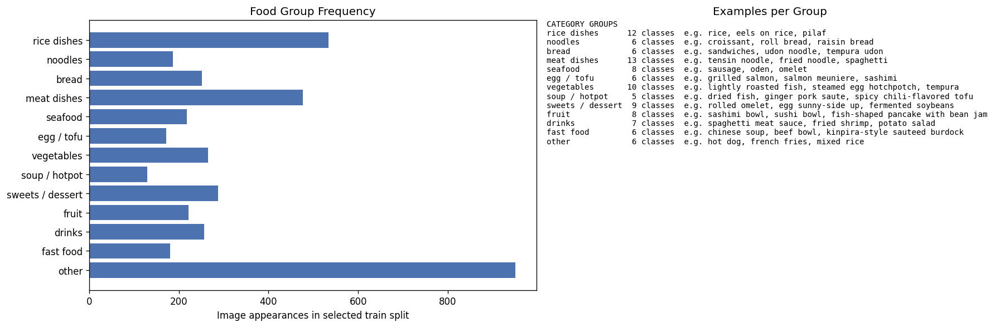

In [10]:
CATEGORY_GROUPS = {
    "rice dishes": list(range(1, 13)),
    "noodles": list(range(13, 19)),
    "bread": list(range(19, 25)),
    "meat dishes": list(range(25, 38)),
    "seafood": list(range(38, 46)),
    "egg / tofu": list(range(46, 52)),
    "vegetables": list(range(52, 62)),
    "soup / hotpot": list(range(62, 67)),
    "sweets / dessert": list(range(67, 76)),
    "fruit": list(range(76, 84)),
    "drinks": list(range(84, 91)),
    "fast food": list(range(91, 97)),
    "other": list(range(97, 103)),
}

group_stats = pd.DataFrame([
    {
        "group": group_name,
        "classes": len(class_ids),
        "train_images_containing_group_classes": int(sum(train_image_counts[class_ids])),
        "example_classes": ", ".join(CLASS_NAMES[class_id] for class_id in class_ids[:3]),
    }
    for group_name, class_ids in CATEGORY_GROUPS.items()
])
display(group_stats)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].barh(group_stats["group"], group_stats["train_images_containing_group_classes"], color="#4C72B0")
axes[0].invert_yaxis()
axes[0].set_xlabel("Image appearances in selected train split")
axes[0].set_title("Food Group Frequency")
axes[1].axis("off")
summary_text = "CATEGORY GROUPS\n" + "\n".join(f"{row.group:<16} {row.classes:>2} classes  e.g. {row.example_classes}" for row in group_stats.itertuples())
axes[1].text(0, 1, summary_text, va="top", family="monospace", fontsize=8.5)
axes[1].set_title("Examples per Group")
plt.tight_layout()
plt.show()


## 8. EDA: Image-Level Class Distribution and Imbalance

This cell shows head classes and tail classes. The imbalance motivates using mIoU, data augmentation, and class-aware experiments instead of relying only on pixel accuracy.


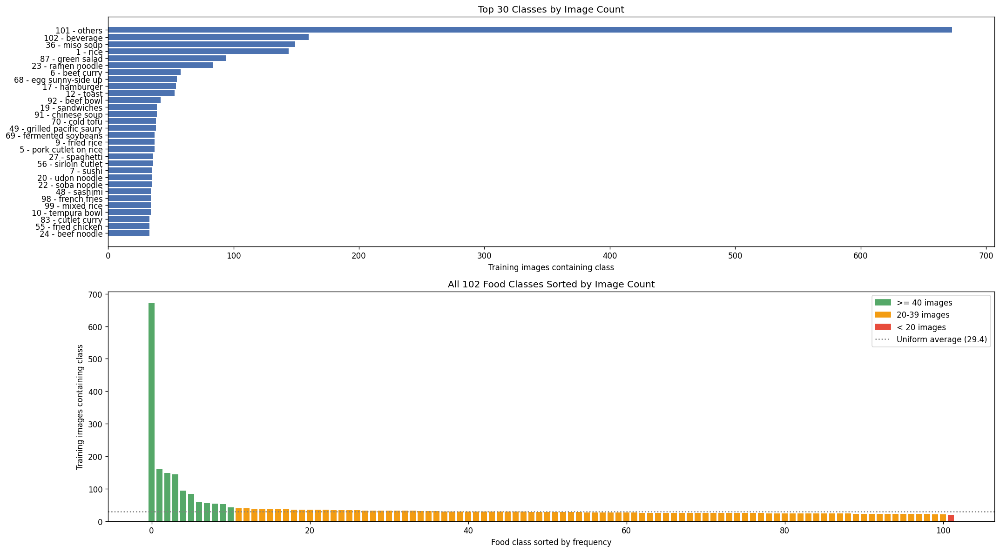

Images per class: max=673 min=18 mean=40.5 median=28.0
Max/min ratio among non-empty classes: 37.4:1
Tail classes: <20 images = 1/102, <40 images = 91/102
Top 10 classes:
  101 others                               673 images
  102 beverage                             160 images
   36 miso soup                            149 images
    1 rice                                 144 images
   87 green salad                           94 images
   23 ramen noodle                          84 images
    6 beef curry                            58 images
   68 egg sunny-side up                     55 images
   17 hamburger                             54 images
   12 toast                                 53 images
Bottom 10 classes:
   95 pizza toast                           23 images
   34 sauteed spinach                       23 images
    8 chicken rice                          23 images
   60 hambarg steak                         23 images
   41 ganmodoki                             23 images


In [11]:
food_ids_list = list(range(1, NUM_CLASSES))
food_img_counts = np.array([train_image_counts[class_id] for class_id in food_ids_list])
sorted_idx = np.argsort(food_img_counts)[::-1]
sorted_ids = [food_ids_list[i] for i in sorted_idx]
sorted_names = [CLASS_NAMES[class_id] for class_id in sorted_ids]
sorted_cnts = food_img_counts[sorted_idx]

fig, axes = plt.subplots(2, 1, figsize=(18, 10))
N_TOP = 30
axes[0].barh([f"{sorted_ids[i]} - {sorted_names[i]}" for i in range(N_TOP)][::-1], sorted_cnts[:N_TOP][::-1], color="#4C72B0")
axes[0].set_title(f"Top {N_TOP} Classes by Image Count")
axes[0].set_xlabel("Training images containing class")
colors_img = ["#E74C3C" if c < 20 else "#F39C12" if c < 40 else "#55A868" for c in sorted_cnts]
axes[1].bar(range(len(sorted_cnts)), sorted_cnts, color=colors_img, width=0.8)
axes[1].axhline(y=len(train_ids) / FOOD_CLASSES, color="gray", linestyle=":", label=f"Uniform average ({len(train_ids) / FOOD_CLASSES:.1f})")
axes[1].set_title("All 102 Food Classes Sorted by Image Count")
axes[1].set_xlabel("Food class sorted by frequency")
axes[1].set_ylabel("Training images containing class")
legend_elements = [mpatches.Patch(color="#55A868", label=">= 40 images"), mpatches.Patch(color="#F39C12", label="20-39 images"), mpatches.Patch(color="#E74C3C", label="< 20 images")]
axes[1].legend(handles=legend_elements + axes[1].get_legend_handles_labels()[0], loc="upper right")
plt.tight_layout()
plt.show()

nonzero_counts = food_img_counts[food_img_counts > 0]
tail_20 = int((food_img_counts < 20).sum())
tail_40 = int((food_img_counts < 40).sum())
imbalance_ratio = float(nonzero_counts.max() / max(nonzero_counts.min(), 1))
print(f"Images per class: max={food_img_counts.max()} min={food_img_counts.min()} mean={food_img_counts.mean():.1f} median={np.median(food_img_counts):.1f}")
print(f"Max/min ratio among non-empty classes: {imbalance_ratio:.1f}:1")
print(f"Tail classes: <20 images = {tail_20}/102, <40 images = {tail_40}/102")
print("Top 10 classes:")
for i in range(10):
    print(f"  {sorted_ids[i]:>3d} {sorted_names[i]:<35s} {int(sorted_cnts[i]):>4d} images")
print("Bottom 10 classes:")
for class_id, name, count in list(zip(sorted_ids, sorted_names, sorted_cnts))[-10:]:
    print(f"  {class_id:>3d} {name:<35s} {int(count):>4d} images")


## 9. EDA: Per-Image Labels and Food Coverage

This cell checks how many food labels appear in each image and how much of each mask is foreground food. This explains why background can dominate pixel accuracy.


Food coverage: 100%|##########| 2000/2000 [00:08<00:00, 223.27it/s]


Food class IDs per image: 1 ID = 71.7%, 2+ IDs = 27.1%
Food coverage: mean=42.0% median=39.9% min=0.0% max=100.0%


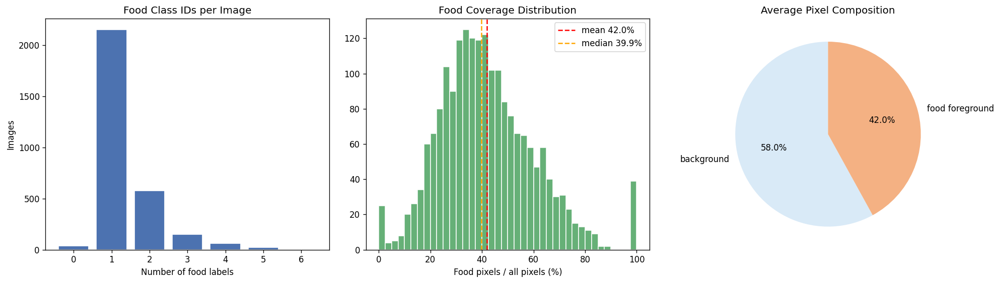

In [12]:
multi_food_counter = Counter()
for labels in train_image_labels.values():
    n_food = len([label for label in labels if label != BACKGROUND_LABEL])
    multi_food_counter[n_food] += 1

total_train_images = sum(multi_food_counter.values())
single_pct = multi_food_counter.get(1, 0) / total_train_images * 100
multi_pct = sum(value for key, value in multi_food_counter.items() if key >= 2) / total_train_images * 100

sample_n = min(2000, len(train_ids))
coverage_sample_ids = random.sample(train_ids, sample_n)
food_ratios = []
for image_id in tqdm(coverage_sample_ids, desc="Food coverage", ascii=True):
    mask = load_mask_array("train", image_id)
    food_ratios.append(float((mask > BACKGROUND_LABEL).sum() / mask.size * 100))
food_ratios = np.array(food_ratios)

print(f"Food class IDs per image: 1 ID = {single_pct:.1f}%, 2+ IDs = {multi_pct:.1f}%")
print(f"Food coverage: mean={food_ratios.mean():.1f}% median={np.median(food_ratios):.1f}% min={food_ratios.min():.1f}% max={food_ratios.max():.1f}%")
fig, axes = plt.subplots(1, 3, figsize=(17, 4.8))
labels = [str(key) for key in sorted(multi_food_counter)]
values = [multi_food_counter[key] for key in sorted(multi_food_counter)]
axes[0].bar(labels, values, color="#4C72B0", edgecolor="white")
axes[0].set_title("Food Class IDs per Image")
axes[0].set_xlabel("Number of food labels")
axes[0].set_ylabel("Images")
axes[1].hist(food_ratios, bins=40, color="#55A868", edgecolor="white", alpha=0.9)
axes[1].axvline(food_ratios.mean(), color="red", linestyle="--", label=f"mean {food_ratios.mean():.1f}%")
axes[1].axvline(np.median(food_ratios), color="orange", linestyle="--", label=f"median {np.median(food_ratios):.1f}%")
axes[1].set_title("Food Coverage Distribution")
axes[1].set_xlabel("Food pixels / all pixels (%)")
axes[1].legend()
axes[2].pie([100 - food_ratios.mean(), food_ratios.mean()], labels=["background", "food foreground"], autopct="%1.1f%%", colors=["#D9EAF7", "#F4B183"], startangle=90)
axes[2].set_title("Average Pixel Composition")
plt.tight_layout()
plt.show()


## 10. EDA: Image Size and Aspect Ratio

This cell scans image dimensions. Since all models resize inputs to `384 x 320`, the size distribution explains the preprocessing decision.


Scanning image dimensions ...


Image sizes: 100%|##########| 4500/4500 [1:02:53<00:00,  1.19it/s]


Width: min=99 max=800 mean=445.4 median=426.0
Height: min=71 max=800 mean=352.2 median=346.0
Aspect ratio: min=0.475 max=4.085 mean=1.291


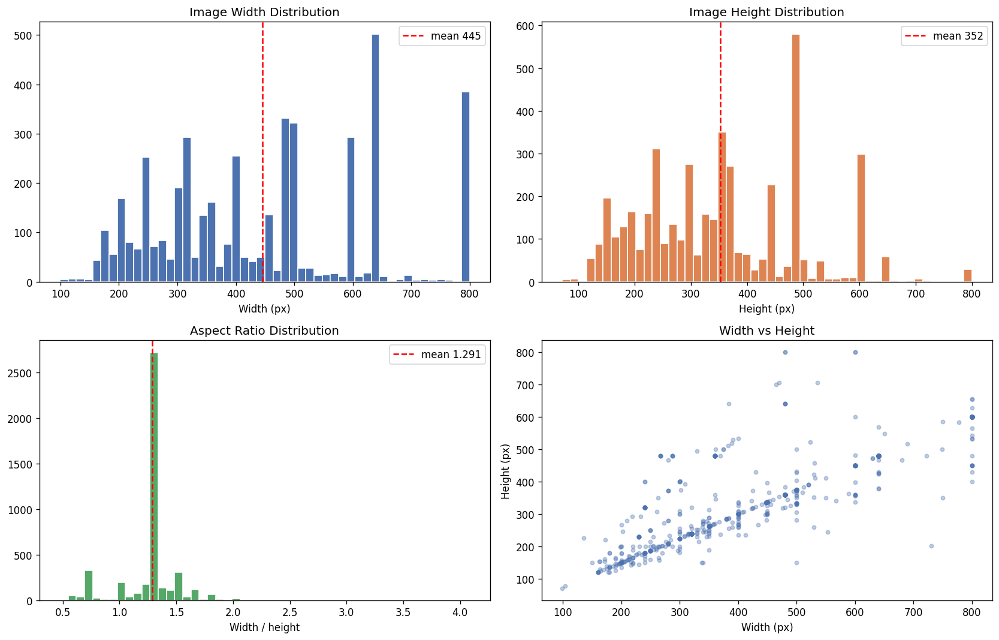

In [13]:
print("Scanning image dimensions ...")
widths, heights, aspects, areas = [], [], [], []
for image_path, _ in tqdm(train_pairs + val_pairs + test_pairs, desc="Image sizes", ascii=True):
    with Image.open(image_path) as image:
        width, height = image.size
    widths.append(width)
    heights.append(height)
    aspects.append(width / height)
    areas.append(width * height)
widths = np.array(widths)
heights = np.array(heights)
aspects = np.array(aspects)
areas = np.array(areas)
print(f"Width: min={widths.min()} max={widths.max()} mean={widths.mean():.1f} median={np.median(widths):.1f}")
print(f"Height: min={heights.min()} max={heights.max()} mean={heights.mean():.1f} median={np.median(heights):.1f}")
print(f"Aspect ratio: min={aspects.min():.3f} max={aspects.max():.3f} mean={aspects.mean():.3f}")
fig, axes = plt.subplots(2, 2, figsize=(14, 9))
axes[0, 0].hist(widths, bins=50, color="#4C72B0", edgecolor="white")
axes[0, 0].axvline(widths.mean(), color="red", linestyle="--", label=f"mean {widths.mean():.0f}")
axes[0, 0].set_title("Image Width Distribution")
axes[0, 0].set_xlabel("Width (px)")
axes[0, 0].legend()
axes[0, 1].hist(heights, bins=50, color="#DD8452", edgecolor="white")
axes[0, 1].axvline(heights.mean(), color="red", linestyle="--", label=f"mean {heights.mean():.0f}")
axes[0, 1].set_title("Image Height Distribution")
axes[0, 1].set_xlabel("Height (px)")
axes[0, 1].legend()
axes[1, 0].hist(aspects, bins=50, color="#55A868", edgecolor="white")
axes[1, 0].axvline(aspects.mean(), color="red", linestyle="--", label=f"mean {aspects.mean():.3f}")
axes[1, 0].set_title("Aspect Ratio Distribution")
axes[1, 0].set_xlabel("Width / height")
axes[1, 0].legend()
sample_step = max(len(widths) // 700, 1)
axes[1, 1].scatter(widths[::sample_step], heights[::sample_step], color="#4C72B0", alpha=0.35, s=14)
axes[1, 1].set_title("Width vs Height")
axes[1, 1].set_xlabel("Width (px)")
axes[1, 1].set_ylabel("Height (px)")
plt.tight_layout()
plt.show()


## 11. EDA: Image and Segmentation Mask Examples

This cell displays random images, masks, and overlays. It makes the segmentation target visually clear.


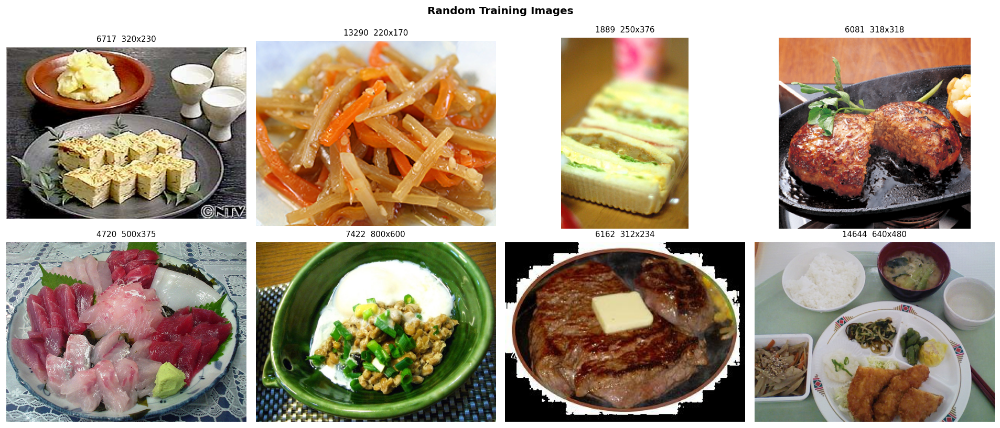

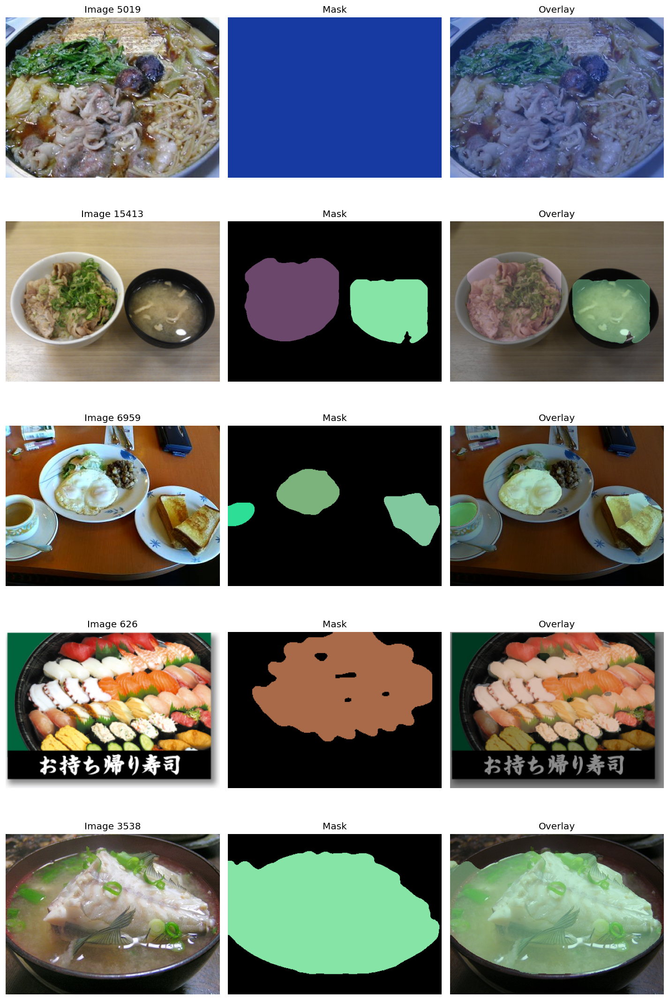

In [14]:
def build_colour_map(num_classes=NUM_CLASSES):
    rng = np.random.default_rng(SEED)
    colours = rng.integers(20, 235, size=(num_classes, 3), dtype=np.uint8)
    colours[BACKGROUND_LABEL] = np.array([0, 0, 0], dtype=np.uint8)
    return colours


COLOUR_MAP = build_colour_map()


def colourise_mask(mask_array):
    safe_mask = np.where((0 <= mask_array) & (mask_array < NUM_CLASSES), mask_array, BACKGROUND_LABEL)
    return COLOUR_MAP[safe_mask]


def show_random_images(n=8):
    sample_ids = random.sample(train_ids, min(n, len(train_ids)))
    cols = 4
    rows = math.ceil(len(sample_ids) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 3.5))
    axes = np.array(axes).reshape(-1)
    for ax, image_id in zip(axes, sample_ids):
        image_path = FOODPIX_ROOT / "train" / "img" / f"{image_id}.jpg"
        image = Image.open(image_path).convert("RGB")
        ax.imshow(image)
        ax.set_title(f"{image_id}  {image.size[0]}x{image.size[1]}", fontsize=9)
        ax.axis("off")
    for ax in axes[len(sample_ids):]:
        ax.axis("off")
    plt.suptitle("Random Training Images", fontweight="bold")
    plt.tight_layout()
    plt.show()


def show_mask_examples(n=5):
    sample_ids = random.sample(train_ids, min(n, len(train_ids)))
    fig, axes = plt.subplots(len(sample_ids), 3, figsize=(12, 3.7 * len(sample_ids)))
    if len(sample_ids) == 1:
        axes = np.expand_dims(axes, axis=0)
    for row, image_id in enumerate(sample_ids):
        image_path = FOODPIX_ROOT / "train" / "img" / f"{image_id}.jpg"
        image = Image.open(image_path).convert("RGB")
        mask = load_mask_array("train", image_id)
        mask_rgb = colourise_mask(mask)
        image_resized = image.resize((mask.shape[1], mask.shape[0]))
        overlay = (0.55 * np.asarray(image_resized) + 0.45 * mask_rgb).astype(np.uint8)
        present_names = [CLASS_NAMES[int(label)] for label in sorted(np.unique(mask)) if label != BACKGROUND_LABEL]
        class_text = ", ".join(present_names[:3])
        if len(present_names) > 3:
            class_text += f" (+{len(present_names) - 3})"
        axes[row, 0].imshow(image)
        axes[row, 0].set_title(f"Image {image_id}")
        axes[row, 1].imshow(mask_rgb)
        axes[row, 1].set_title("Mask")
        axes[row, 2].imshow(overlay)
        axes[row, 2].set_title("Overlay")
        axes[row, 1].set_ylabel(class_text, rotation=0, ha="right", va="center", labelpad=20, fontsize=8)
        for ax in axes[row]:
            ax.axis("off")
    plt.tight_layout()
    plt.show()


show_random_images(n=8)
show_mask_examples(n=5)


## 12. EDA Summary and Modelling Implications

This cell summarises the main EDA findings and links them to the modelling choices used later in the notebook.


In [15]:
print("=" * 70)
print("UECFoodPIX EDA SUMMARY")
print("=" * 70)
print(f"Official data: {len(official_train_ids):,} training images and {len(test_ids):,} test images")
print(f"Project split: {len(train_ids):,} train / {len(val_ids):,} validation / {len(test_ids):,} test")
print(f"Labels: 1 background + {FOOD_CLASSES} food classes = {NUM_CLASSES} output channels")
print(f"Foreground image count: min={food_img_counts.min()}, max={food_img_counts.max()}, median={np.median(food_img_counts):.1f}")
print(f"Class imbalance: {imbalance_ratio:.1f}:1 max/min among non-empty classes")
print(f"Per-image labels: {single_pct:.1f}% contain one food class, {multi_pct:.1f}% contain two or more")
print(f"Average foreground coverage: {food_ratios.mean():.1f}% food and {100 - food_ratios.mean():.1f}% background")
print(f"Image size range: width {widths.min()}-{widths.max()} px, height {heights.min()}-{heights.max()} px")
print("-" * 70)
print("Modelling implications:")
print("1. Use the same split for every model to keep comparisons fair.")
print("2. Use mIoU together with pixel accuracy because background pixels are common.")
print("3. Use ImageNet normalisation because all backbones use ImageNet pretrained weights.")
print("4. Use data augmentation and class-aware experiments to address limited data and imbalance.")
print("=" * 70)


UECFoodPIX EDA SUMMARY
Official data: 9,000 training images and 1,000 test images
Project split: 3,000 train / 500 validation / 1,000 test
Labels: 1 background + 102 food classes = 103 output channels
Foreground image count: min=18, max=673, median=28.0
Class imbalance: 37.4:1 max/min among non-empty classes
Per-image labels: 71.7% contain one food class, 27.1% contain two or more
Average foreground coverage: 42.0% food and 58.0% background
Image size range: width 99-800 px, height 71-800 px
----------------------------------------------------------------------
Modelling implications:
1. Use the same split for every model to keep comparisons fair.
2. Use mIoU together with pixel accuracy because background pixels are common.
3. Use ImageNet normalisation because all backbones use ImageNet pretrained weights.
4. Use data augmentation and class-aware experiments to address limited data and imbalance.


## 13. Pre-processing and Dataset Class

All models use the same train/validation/test split, the same image size, the same label mapping, and ImageNet
normalisation for compatibility with pretrained CNN backbones.

This cell defines reusable augmentation functions and the segmentation dataset class.
Baseline models use minimal augmentation, while the data augmentation and rebalanced experiments use stronger options.

In [6]:
RESAMPLE_BILINEAR = Image.Resampling.BILINEAR if hasattr(Image, "Resampling") else Image.BILINEAR
RESAMPLE_NEAREST = Image.Resampling.NEAREST if hasattr(Image, "Resampling") else Image.NEAREST
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

SIMPLE_AUGMENTATION_CONFIG = {
    "horizontal_flip_prob": 0.5,
    "rotation_degrees": 10,
    "crop_scale_min": 0.85,
    "crop_scale_max": 1.0,
    "aspect_min": 0.9,
    "aspect_max": 1.1,
    "brightness": 0.15,
    "contrast": 0.15,
    "saturation": 0.12,
}

REBALANCED_AUGMENTATION_CONFIG = {
    "horizontal_flip_prob": 0.5,
    "foreground_crop_prob": 0.55,
    "crop_scale_min": 0.70,
    "crop_scale_max": 0.95,
    "random_crop_scale_min": 0.90,
    "random_crop_scale_max": 1.0,
    "aspect_min": 0.90,
    "aspect_max": 1.10,
    "rotation_degrees": 8,
    "brightness": 0.12,
    "contrast": 0.12,
    "saturation": 0.10,
}


def random_factor(strength):
    return 1.0 + random.uniform(-strength, strength)


def random_crop_box(img_w, img_h, scale_min, scale_max, aspect_min, aspect_max):
    area = img_w * img_h
    for _ in range(10):
        target_area = area * random.uniform(scale_min, scale_max)
        aspect = random.uniform(aspect_min, aspect_max)
        crop_w = int(round(math.sqrt(target_area * aspect)))
        crop_h = int(round(math.sqrt(target_area / aspect)))
        if 0 < crop_w <= img_w and 0 < crop_h <= img_h:
            left = random.randint(0, img_w - crop_w)
            top = random.randint(0, img_h - crop_h)
            return left, top, left + crop_w, top + crop_h
    return 0, 0, img_w, img_h


def apply_simple_augmentation(image, mask, config):
    if random.random() < config["horizontal_flip_prob"]:
        image = image.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
        mask = mask.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

    angle = random.uniform(-config["rotation_degrees"], config["rotation_degrees"])
    image = image.rotate(angle, resample=RESAMPLE_BILINEAR, fillcolor=(0, 0, 0))
    mask = mask.rotate(angle, resample=RESAMPLE_NEAREST, fillcolor=0)

    box = random_crop_box(
        image.size[0],
        image.size[1],
        config["crop_scale_min"],
        config["crop_scale_max"],
        config["aspect_min"],
        config["aspect_max"],
    )
    image = image.crop(box)
    mask = mask.crop(box)
    image = ImageEnhance.Brightness(image).enhance(random_factor(config["brightness"]))
    image = ImageEnhance.Contrast(image).enhance(random_factor(config["contrast"]))
    image = ImageEnhance.Color(image).enhance(random_factor(config["saturation"]))
    return image, mask


def foreground_crop_box(mask_array, config, class_sampling_weights):
    img_h, img_w = mask_array.shape
    foreground_labels = np.unique(mask_array[mask_array > 0])
    if len(foreground_labels) == 0:
        return random_crop_box(
            img_w,
            img_h,
            config["random_crop_scale_min"],
            config["random_crop_scale_max"],
            config["aspect_min"],
            config["aspect_max"],
        )
    label_weights = class_sampling_weights[foreground_labels]
    label_weights = label_weights / max(label_weights.sum(), 1e-8)
    selected_label = int(np.random.choice(foreground_labels, p=label_weights))
    ys, xs = np.where(mask_array == selected_label)
    point_index = random.randrange(len(xs))
    center_x = int(xs[point_index])
    center_y = int(ys[point_index])

    area = img_w * img_h
    target_area = area * random.uniform(config["crop_scale_min"], config["crop_scale_max"])
    aspect = random.uniform(config["aspect_min"], config["aspect_max"])
    crop_w = min(img_w, max(16, int(round(math.sqrt(target_area * aspect)))))
    crop_h = min(img_h, max(16, int(round(math.sqrt(target_area / aspect)))))
    left = max(0, min(center_x - crop_w // 2, img_w - crop_w))
    top = max(0, min(center_y - crop_h // 2, img_h - crop_h))
    return left, top, left + crop_w, top + crop_h


def apply_rebalanced_augmentation(image, mask, config, class_sampling_weights):
    mask_array = np.asarray(mask, dtype=np.int64)
    if random.random() < config["foreground_crop_prob"]:
        box = foreground_crop_box(mask_array, config, class_sampling_weights)
    else:
        box = random_crop_box(
            image.size[0],
            image.size[1],
            config["random_crop_scale_min"],
            config["random_crop_scale_max"],
            config["aspect_min"],
            config["aspect_max"],
        )
    image = image.crop(box)
    mask = mask.crop(box)

    if random.random() < config["horizontal_flip_prob"]:
        image = image.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
        mask = mask.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

    angle = random.uniform(-config["rotation_degrees"], config["rotation_degrees"])
    image = image.rotate(angle, resample=RESAMPLE_BILINEAR, fillcolor=(0, 0, 0))
    mask = mask.rotate(angle, resample=RESAMPLE_NEAREST, fillcolor=0)
    image = ImageEnhance.Brightness(image).enhance(random_factor(config["brightness"]))
    image = ImageEnhance.Contrast(image).enhance(random_factor(config["contrast"]))
    image = ImageEnhance.Color(image).enhance(random_factor(config["saturation"]))
    return image, mask


class FoodSegmentationDataset(Dataset):
    def __init__(self, image_ids, split, augment_mode="none", class_sampling_weights=None):
        self.image_ids = [str(item) for item in image_ids]
        self.split = split
        self.augment_mode = augment_mode
        self.class_sampling_weights = class_sampling_weights

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image_path = FOODPIX_ROOT / self.split / "img" / f"{image_id}.jpg"
        mask_path = FOODPIX_ROOT / self.split / "mask" / f"{image_id}.png"
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path)
        if mask.mode != "L":
            mask = mask.split()[0]

        if self.augment_mode == "baseline" and random.random() < 0.5:
            image = image.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
            mask = mask.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
        elif self.augment_mode == "simple":
            image, mask = apply_simple_augmentation(image, mask, SIMPLE_AUGMENTATION_CONFIG)
        elif self.augment_mode == "rebalanced":
            image, mask = apply_rebalanced_augmentation(
                image,
                mask,
                REBALANCED_AUGMENTATION_CONFIG,
                self.class_sampling_weights,
            )

        image = image.resize((WIDTH, HEIGHT), RESAMPLE_BILINEAR)
        mask = mask.resize((WIDTH, HEIGHT), RESAMPLE_NEAREST)

        image_array = np.asarray(image, dtype=np.float32) / 255.0
        image_tensor = torch.from_numpy(image_array.copy()).permute(2, 0, 1)
        image_tensor = (image_tensor - IMAGENET_MEAN) / IMAGENET_STD

        mask_array = np.asarray(mask)
        if mask_array.ndim == 3:
            mask_array = mask_array[..., 0]
        mask_array = np.where((0 <= mask_array) & (mask_array < NUM_CLASSES), mask_array, 0)
        mask_tensor = torch.from_numpy(mask_array.astype(np.int64, copy=True)).long()
        return image_tensor, mask_tensor

## 14. Metrics, Plots, and Training Helpers

This cell defines the shared evaluation functions, training loop, checkpoint saving, learning-rate scheduling, training curves, and confusion-matrix visualisations used by all experiments.

In [7]:
def get_device():
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")


def make_loader(dataset, shuffle=False, sampler=None):
    return DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=shuffle if sampler is None else False,
        sampler=sampler,
        num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available(),
    )


def update_confusion(confusion, prediction, target):
    prediction = prediction.detach().reshape(-1).cpu().to(torch.int64)
    target = target.detach().reshape(-1).cpu().to(torch.int64)
    valid = (target >= 0) & (target < NUM_CLASSES)
    encoded = target[valid] * NUM_CLASSES + prediction[valid].clamp(0, NUM_CLASSES - 1)
    confusion += torch.bincount(encoded, minlength=NUM_CLASSES ** 2).reshape(NUM_CLASSES, NUM_CLASSES)


def confusion_statistics(confusion):
    cm = confusion.double().cpu()
    tp = cm.diag()
    support = cm.sum(1)
    predicted = cm.sum(0)
    union = support + predicted - tp
    valid_iou = union > 0
    per_class_iou = torch.zeros(NUM_CLASSES, dtype=torch.float64)
    per_class_iou[valid_iou] = tp[valid_iou] / union[valid_iou]
    pixel_accuracy = float(tp.sum() / cm.sum().clamp_min(1))
    mean_iou = float(per_class_iou[valid_iou].mean()) if valid_iou.any() else 0.0
    return {
        "pixel_accuracy": pixel_accuracy,
        "mean_iou": mean_iou,
        "per_class_iou": per_class_iou,
        "support": support,
    }


def run_epoch(model, loader, loss_fn, device, optimizer=None, phase="train"):
    training = optimizer is not None
    model.train(training)
    total_loss = 0.0
    confusion = torch.zeros(NUM_CLASSES, NUM_CLASSES, dtype=torch.int64)
    context = torch.enable_grad() if training else torch.no_grad()

    progress = tqdm(
        loader,
        desc=phase,
        leave=False,
        dynamic_ncols=False,
        ascii=True,
        bar_format="{desc}: {percentage:3.0f}%|{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]",
    )
    with context:
        for images, masks in progress:
            images = images.to(device)
            masks = masks.to(device)
            logits = model(images)
            loss = loss_fn(logits, masks)

            if training:
                optimizer.zero_grad(set_to_none=True)
                loss.backward()
                optimizer.step()

            total_loss += loss.item() * images.shape[0]
            update_confusion(confusion, logits.argmax(1), masks)

    stats = confusion_statistics(confusion)
    return total_loss / len(loader.dataset), stats, confusion


def normalized_confusion(confusion):
    matrix = confusion.detach().cpu().numpy() if isinstance(confusion, torch.Tensor) else np.asarray(confusion)
    matrix = matrix.astype(np.float64)
    return matrix / np.maximum(matrix.sum(axis=1, keepdims=True), 1)


def plot_training_history(history, model_name):
    epochs = [row["epoch"] for row in history]
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    axes[0].plot(epochs, [row["train_loss"] for row in history], label="Train loss")
    axes[0].plot(epochs, [row["val_loss"] for row in history], label="Validation loss")
    axes[0].set(title=f"{model_name}: Training and Validation Loss", xlabel="Epoch", ylabel="Cross-entropy loss")
    axes[0].grid(alpha=0.3)
    axes[0].legend()

    axes[1].plot(epochs, [row["train_accuracy"] for row in history], label="Train pixel accuracy")
    axes[1].plot(epochs, [row["val_accuracy"] for row in history], label="Validation pixel accuracy")
    axes[1].plot(epochs, [row["train_miou"] for row in history], label="Train mIoU")
    axes[1].plot(epochs, [row["val_miou"] for row in history], label="Validation mIoU")
    axes[1].set(title=f"{model_name}: Accuracy and mIoU", xlabel="Epoch", ylabel="Score", ylim=(0, 1))
    axes[1].grid(alpha=0.3)
    axes[1].legend()
    plt.tight_layout()
    plt.show()


def plot_overall_confusion(confusion, title):
    normalized = normalized_confusion(confusion)
    fig, ax = plt.subplots(figsize=(9, 8))
    im = ax.imshow(normalized, cmap="Blues", vmin=0, vmax=1, interpolation="nearest")
    ax.set_title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    tick_positions = list(range(0, NUM_CLASSES, 10))
    ax.set_xticks(tick_positions)
    ax.set_yticks(tick_positions)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()


def plot_class_subset_heatmap(confusion, class_indices, title):
    normalized = normalized_confusion(confusion)
    subset = normalized[np.ix_(class_indices, class_indices)]
    labels = [CLASS_NAMES[index] for index in class_indices]
    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(subset, cmap="Blues", vmin=0, vmax=1, interpolation="nearest")
    ax.set_title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=70, ha="right", fontsize=8)
    ax.set_yticklabels(labels, fontsize=8)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()


def plot_best_worst_heatmaps(confusion, model_name, top_k=10):
    stats = confusion_statistics(confusion)
    iou = stats["per_class_iou"].cpu().numpy()
    support = stats["support"].cpu().numpy()
    valid = np.where((support > 0) & (np.arange(NUM_CLASSES) != BACKGROUND_LABEL))[0]
    order = valid[np.argsort(iou[valid])]
    worst = order[:top_k]
    best = order[-top_k:][::-1]
    print(f"{model_name} best {top_k} classes:")
    for index in best:
        print(f"{index:3d} {CLASS_NAMES[index]:30s} IoU={iou[index]:.4f} support={int(support[index])}")
    print(f"\n{model_name} worst {top_k} classes:")
    for index in worst:
        print(f"{index:3d} {CLASS_NAMES[index]:30s} IoU={iou[index]:.4f} support={int(support[index])}")
    plot_class_subset_heatmap(confusion, best, f"{model_name}: Best {top_k} classes test heatmap")
    plot_class_subset_heatmap(confusion, worst, f"{model_name}: Worst {top_k} classes test heatmap")


all_results = {}


def set_encoder_trainable(model, trainable):
    if hasattr(model, "encoder"):
        for parameter in model.encoder.parameters():
            parameter.requires_grad = trainable


def train_model(model_name, model, train_loader, val_loader, test_loader, criterion, optimizer, scheduler, config, checkpoint_filename):
    device = get_device()
    model = model.to(device)
    checkpoint_path = BEST_MODEL_DIR / checkpoint_filename
    best_miou = -1.0
    best_epoch = 0
    best_val_confusion = None
    stale_epochs = 0
    history = []

    print(f"Training {model_name}")
    print("Config:", config)
    print("Best checkpoint target:", checkpoint_path)
    start_time = time.time()

    for epoch in range(1, config.get("max_epochs", MAX_EPOCHS) + 1):
        freeze_encoder = epoch <= config.get("freeze_encoder_epochs", 0)
        set_encoder_trainable(model, not freeze_encoder)

        train_loss, train_stats, _ = run_epoch(
            model, train_loader, criterion, device, optimizer=optimizer, phase=f"{model_name} train"
        )
        set_encoder_trainable(model, True)
        val_loss, val_stats, val_confusion = run_epoch(
            model, val_loader, criterion, device, phase=f"{model_name} validation"
        )
        scheduler.step(val_stats["mean_iou"])

        row = {
            "epoch": epoch,
            "train_loss": train_loss,
            "val_loss": val_loss,
            "train_accuracy": train_stats["pixel_accuracy"],
            "val_accuracy": val_stats["pixel_accuracy"],
            "train_miou": train_stats["mean_iou"],
            "val_miou": val_stats["mean_iou"],
        }
        history.append(row)
        print(row)

        if val_stats["mean_iou"] > best_miou:
            best_miou = val_stats["mean_iou"]
            best_epoch = epoch
            best_val_confusion = val_confusion.clone()
            stale_epochs = 0
            torch.save(
                {
                    "model_name": model_name,
                    "epoch": epoch,
                    "state_dict": model.state_dict(),
                    "val_miou": best_miou,
                    "config": config,
                },
                checkpoint_path,
            )
            print(f"Saved new best model: val_mIoU={best_miou:.4f}")
        else:
            stale_epochs += 1
            if stale_epochs >= config.get("early_stopping_patience", 6):
                print(f"Early stopping after {stale_epochs} epochs without validation mIoU improvement")
                break

    elapsed_minutes = (time.time() - start_time) / 60
    print(f"Training finished in {elapsed_minutes:.1f} minutes")
    plot_training_history(history, model_name)
    if best_val_confusion is not None:
        plot_overall_confusion(best_val_confusion, f"{model_name}: validation confusion matrix")

    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint["state_dict"])
    test_loss, test_stats, test_confusion = run_epoch(model, test_loader, criterion, device, phase=f"{model_name} test")
    plot_overall_confusion(test_confusion, f"{model_name}: full test confusion matrix")
    plot_best_worst_heatmaps(test_confusion, model_name)

    result = {
        "history": history,
        "best_epoch": best_epoch,
        "best_validation_miou": best_miou,
        "test_loss": test_loss,
        "test_accuracy": test_stats["pixel_accuracy"],
        "test_miou": test_stats["mean_iou"],
        "checkpoint_path": checkpoint_path,
        "test_confusion": test_confusion,
    }
    all_results[model_name] = result
    print("Best epoch:", best_epoch)
    print("Best validation mIoU:", best_miou)
    print("Test result:", {k: result[k] for k in ["test_loss", "test_accuracy", "test_miou"]})
    return result

## 15. Baseline Model Framework

This cell defines four baseline segmentation models:
EfficientNet-B0, DenseNet-121, ResNet50-FCN, and VGG16-FCN.
VGG16 uses more conservative parameters in this combined notebook because the earlier result showed clear overfitting.

In [11]:
class EfficientNetBaseline(nn.Module):
    def __init__(self, pretrained=True, dropout=0.2):
        super().__init__()
        weights = EfficientNet_B0_Weights.DEFAULT if pretrained else None
        self.encoder = efficientnet_b0(weights=weights).features
        self.classifier = nn.Sequential(nn.Dropout2d(dropout), nn.Conv2d(1280, NUM_CLASSES, kernel_size=1))

    def forward(self, x):
        output_size = x.shape[-2:]
        logits = self.classifier(self.encoder(x))
        return F.interpolate(logits, size=output_size, mode="bilinear", align_corners=False)


class DenseNetBaseline(nn.Module):
    def __init__(self, pretrained=True, dropout=0.2):
        super().__init__()
        weights = DenseNet121_Weights.DEFAULT if pretrained else None
        self.encoder = densenet121(weights=weights).features
        self.classifier = nn.Sequential(nn.Dropout2d(dropout), nn.Conv2d(1024, NUM_CLASSES, kernel_size=1))

    def forward(self, x):
        output_size = x.shape[-2:]
        features = F.relu(self.encoder(x))
        logits = self.classifier(features)
        return F.interpolate(logits, size=output_size, mode="bilinear", align_corners=False)


class ResNet50FCN(nn.Module):
    def __init__(self, pretrained=True, dropout=0.4):
        super().__init__()
        weights = ResNet50_Weights.DEFAULT if pretrained else None
        backbone = resnet50(weights=weights)
        self.encoder = nn.Sequential(
            backbone.conv1,
            backbone.bn1,
            backbone.relu,
            backbone.maxpool,
            backbone.layer1,
            backbone.layer2,
            backbone.layer3,
            backbone.layer4,
        )
        self.classifier = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(512, NUM_CLASSES, kernel_size=1),
        )

    def forward(self, x):
        output_size = x.shape[-2:]
        logits = self.classifier(self.encoder(x))
        return F.interpolate(logits, size=output_size, mode="bilinear", align_corners=False)


class VGG16FCN(nn.Module):
    def __init__(self, pretrained=True, dropout=0.65):
        super().__init__()
        weights = VGG16_Weights.DEFAULT if pretrained else None
        self.encoder = vgg16(weights=weights).features
        self.classifier = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(256, NUM_CLASSES, kernel_size=1),
        )

    def forward(self, x):
        output_size = x.shape[-2:]
        logits = self.classifier(self.encoder(x))
        return F.interpolate(logits, size=output_size, mode="bilinear", align_corners=False)


baseline_train_dataset = FoodSegmentationDataset(train_ids, "train", augment_mode="baseline")
val_dataset = FoodSegmentationDataset(val_ids, "train", augment_mode="none")
test_dataset = FoodSegmentationDataset(test_ids, "test", augment_mode="none")

baseline_train_loader = make_loader(baseline_train_dataset, shuffle=True)
val_loader = make_loader(val_dataset, shuffle=False)
test_loader = make_loader(test_dataset, shuffle=False)

## 16. Baseline: EfficientNet-B0

EfficientNet-B0 is used as the main lightweight baseline because it has good parameter efficiency and works well with ImageNet pretrained weights.

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 161MB/s]


Training EfficientNet-B0
Config: {'learning_rate': 0.0003, 'weight_decay': 0.0001, 'dropout': 0.2, 'early_stopping_patience': 6, 'scheduler_patience': 2, 'lr_factor': 0.5, 'pretrained': True, 'max_epochs': 25}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/EfficientNetB0_best_model.pt


{'epoch': 1, 'train_loss': 2.2126065254211427, 'val_loss': 1.3759107766151428, 'train_accuracy': 0.5593649793836806, 'val_accuracy': 0.6803260579427083, 'train_miou': 0.04852885905722288, 'val_miou': 0.17502261384232715}
Saved new best model: val_mIoU=0.1750


{'epoch': 2, 'train_loss': 1.2390563017527263, 'val_loss': 0.9645246677398681, 'train_accuracy': 0.6966923583984375, 'val_accuracy': 0.7436478678385416, 'train_miou': 0.21896012649600918, 'val_miou': 0.3219761416948774}
Saved new best model: val_mIoU=0.3220


{'epoch': 3, 'train_loss': 0.9106132343610128, 'val_loss': 0.8975718891620637, 'train_accuracy': 0.7561152994791667, 'val_accuracy': 0.7556636555989583, 'train_miou': 0.3512845945948467, 'val_miou': 0.35950962700475675}
Saved new best model: val_mIoU=0.3595


{'epoch': 4, 'train_loss': 0.6975823566118876, 'val_loss': 0.8146289875507354, 'train_accuracy': 0.8031143825954861, 'val_accuracy': 0.7736778645833333, 'train_miou': 0.46964327043335163, 'val_miou': 0.4062103442969658}
Saved new best model: val_mIoU=0.4062


{'epoch': 5, 'train_loss': 0.5679289863904318, 'val_loss': 0.8142979857921601, 'train_accuracy': 0.8326539740668403, 'val_accuracy': 0.7726086263020834, 'train_miou': 0.5469863061922252, 'val_miou': 0.41357860503121596}
Saved new best model: val_mIoU=0.4136


{'epoch': 6, 'train_loss': 0.48525897280375163, 'val_loss': 0.7874991173744201, 'train_accuracy': 0.8538908420138889, 'val_accuracy': 0.7786672037760417, 'train_miou': 0.6053225246069185, 'val_miou': 0.43405823731608306}
Saved new best model: val_mIoU=0.4341


{'epoch': 7, 'train_loss': 0.3947263644536336, 'val_loss': 0.7711422753334045, 'train_accuracy': 0.878916636827257, 'val_accuracy': 0.789962060546875, 'train_miou': 0.6805335111682016, 'val_miou': 0.4499711209321759}
Saved new best model: val_mIoU=0.4500


{'epoch': 8, 'train_loss': 0.34210080607732135, 'val_loss': 0.8004004228115081, 'train_accuracy': 0.8926556776258681, 'val_accuracy': 0.7891620442708334, 'train_miou': 0.71940077557485, 'val_miou': 0.45689711642585906}
Saved new best model: val_mIoU=0.4569


{'epoch': 9, 'train_loss': 0.2970595174630483, 'val_loss': 0.8072282071113587, 'train_accuracy': 0.9046953721788195, 'val_accuracy': 0.7868637044270833, 'train_miou': 0.7567380154211403, 'val_miou': 0.4547301401128821}


{'epoch': 10, 'train_loss': 0.27541204476356507, 'val_loss': 0.7737549617290497, 'train_accuracy': 0.9111794894748264, 'val_accuracy': 0.7944847819010417, 'train_miou': 0.7788307455895328, 'val_miou': 0.47696134104125426}
Saved new best model: val_mIoU=0.4770


{'epoch': 11, 'train_loss': 0.24600047715504963, 'val_loss': 0.7989208409786225, 'train_accuracy': 0.9190483208550347, 'val_accuracy': 0.7919504069010417, 'train_miou': 0.7984202050446778, 'val_miou': 0.46906400327223674}


{'epoch': 12, 'train_loss': 0.23213307666778565, 'val_loss': 0.8005760385990143, 'train_accuracy': 0.9228317681206597, 'val_accuracy': 0.7909316080729166, 'train_miou': 0.8110535135704898, 'val_miou': 0.47042083486911856}


{'epoch': 13, 'train_loss': 0.2114913756052653, 'val_loss': 0.8193014101982117, 'train_accuracy': 0.9282642415364584, 'val_accuracy': 0.7875422526041667, 'train_miou': 0.8248016976840548, 'val_miou': 0.45847280706827465}


{'epoch': 14, 'train_loss': 0.18340189027786255, 'val_loss': 0.7815155720710755, 'train_accuracy': 0.9365677815755208, 'val_accuracy': 0.8047216145833334, 'train_miou': 0.848178246271572, 'val_miou': 0.48867511848382095}
Saved new best model: val_mIoU=0.4887


{'epoch': 15, 'train_loss': 0.16524760671456654, 'val_loss': 0.7338329501152039, 'train_accuracy': 0.9415692708333333, 'val_accuracy': 0.8088569498697916, 'train_miou': 0.8634607704453345, 'val_miou': 0.4981265667417035}
Saved new best model: val_mIoU=0.4981


{'epoch': 16, 'train_loss': 0.15829959881305694, 'val_loss': 0.7626855609416962, 'train_accuracy': 0.9440203504774306, 'val_accuracy': 0.8048567708333333, 'train_miou': 0.8699473656896692, 'val_miou': 0.4950826443479258}


{'epoch': 17, 'train_loss': 0.15182832781473796, 'val_loss': 0.7565482766628265, 'train_accuracy': 0.9461587348090278, 'val_accuracy': 0.8059827799479167, 'train_miou': 0.8756265811646136, 'val_miou': 0.49432290959573255}


{'epoch': 18, 'train_loss': 0.1517574687798818, 'val_loss': 0.7707475273609161, 'train_accuracy': 0.9458240288628472, 'val_accuracy': 0.805583349609375, 'train_miou': 0.8733754850627365, 'val_miou': 0.4948235218667087}


{'epoch': 19, 'train_loss': 0.1414214327732722, 'val_loss': 0.744253658771515, 'train_accuracy': 0.9490892333984375, 'val_accuracy': 0.8103510579427083, 'train_miou': 0.8820823372746849, 'val_miou': 0.5045081399397325}
Saved new best model: val_mIoU=0.5045


{'epoch': 20, 'train_loss': 0.1357093482017517, 'val_loss': 0.7566598308086395, 'train_accuracy': 0.9506120768229167, 'val_accuracy': 0.811184130859375, 'train_miou': 0.8854904679703908, 'val_miou': 0.5035414848348337}


{'epoch': 21, 'train_loss': 0.12864402973651887, 'val_loss': 0.7638147251605988, 'train_accuracy': 0.9525266899956597, 'val_accuracy': 0.8088058268229167, 'train_miou': 0.8923676802648567, 'val_miou': 0.4971441875172212}


{'epoch': 22, 'train_loss': 0.12873702307542165, 'val_loss': 0.7583448195457458, 'train_accuracy': 0.9526478597005208, 'val_accuracy': 0.8098093587239583, 'train_miou': 0.8919280382771181, 'val_miou': 0.506492153644674}
Saved new best model: val_mIoU=0.5065


{'epoch': 23, 'train_loss': 0.13223129343986512, 'val_loss': 0.7682154726982117, 'train_accuracy': 0.9516216606987847, 'val_accuracy': 0.8097591471354166, 'train_miou': 0.8887081757609793, 'val_miou': 0.5065261327928784}
Saved new best model: val_mIoU=0.5065


{'epoch': 24, 'train_loss': 0.12940876785914104, 'val_loss': 0.7713492093086243, 'train_accuracy': 0.9525573513454861, 'val_accuracy': 0.8108952311197917, 'train_miou': 0.8908361641708463, 'val_miou': 0.5059600407767364}


{'epoch': 25, 'train_loss': 0.12222900442282358, 'val_loss': 0.7632372479438781, 'train_accuracy': 0.954760413953993, 'val_accuracy': 0.8107525065104166, 'train_miou': 0.8972708913986882, 'val_miou': 0.5080272864680323}
Saved new best model: val_mIoU=0.5080
Training finished in 40.3 minutes


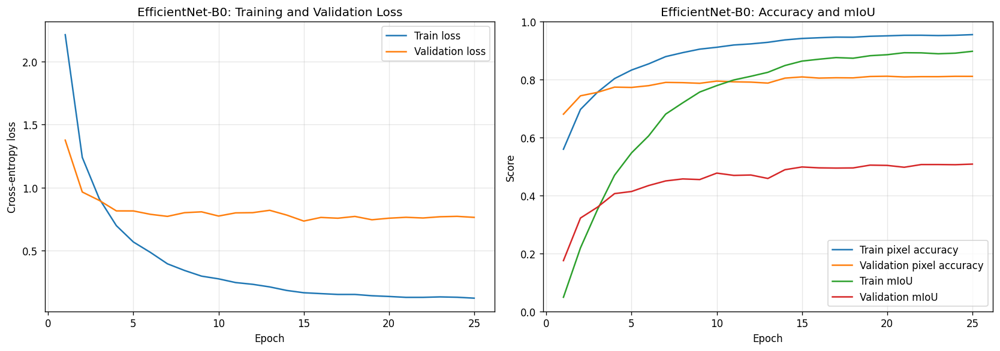

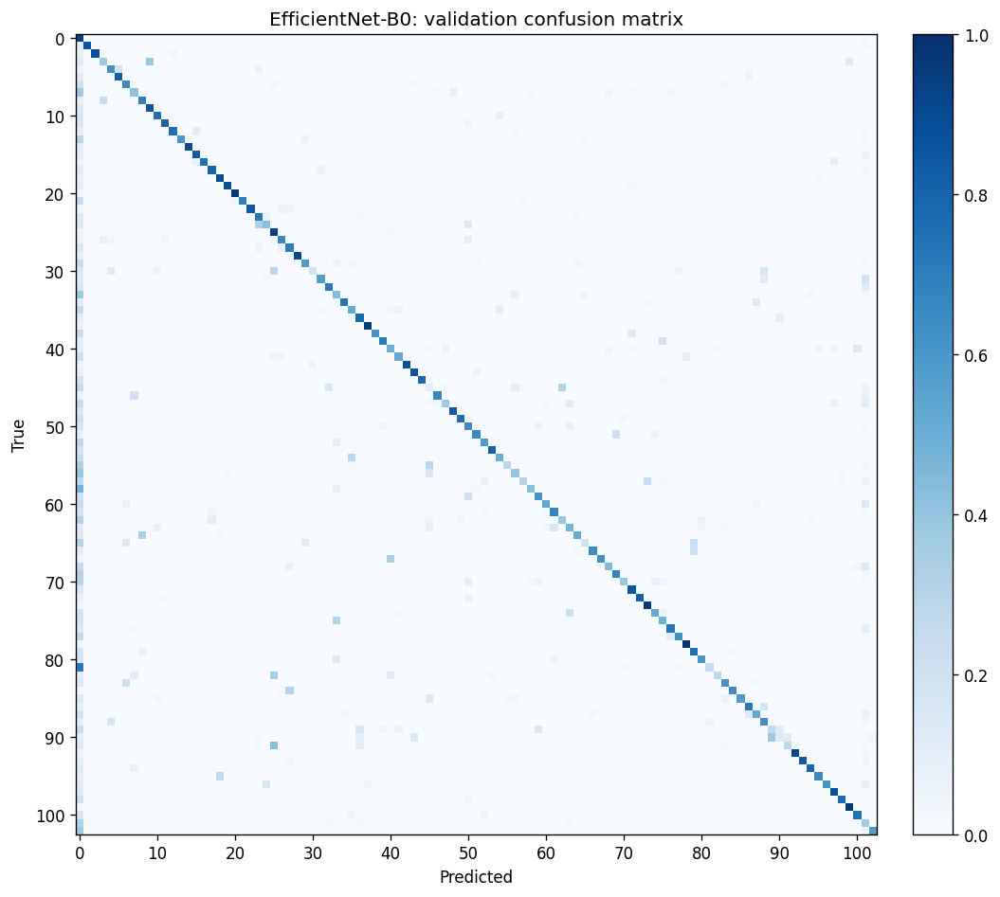

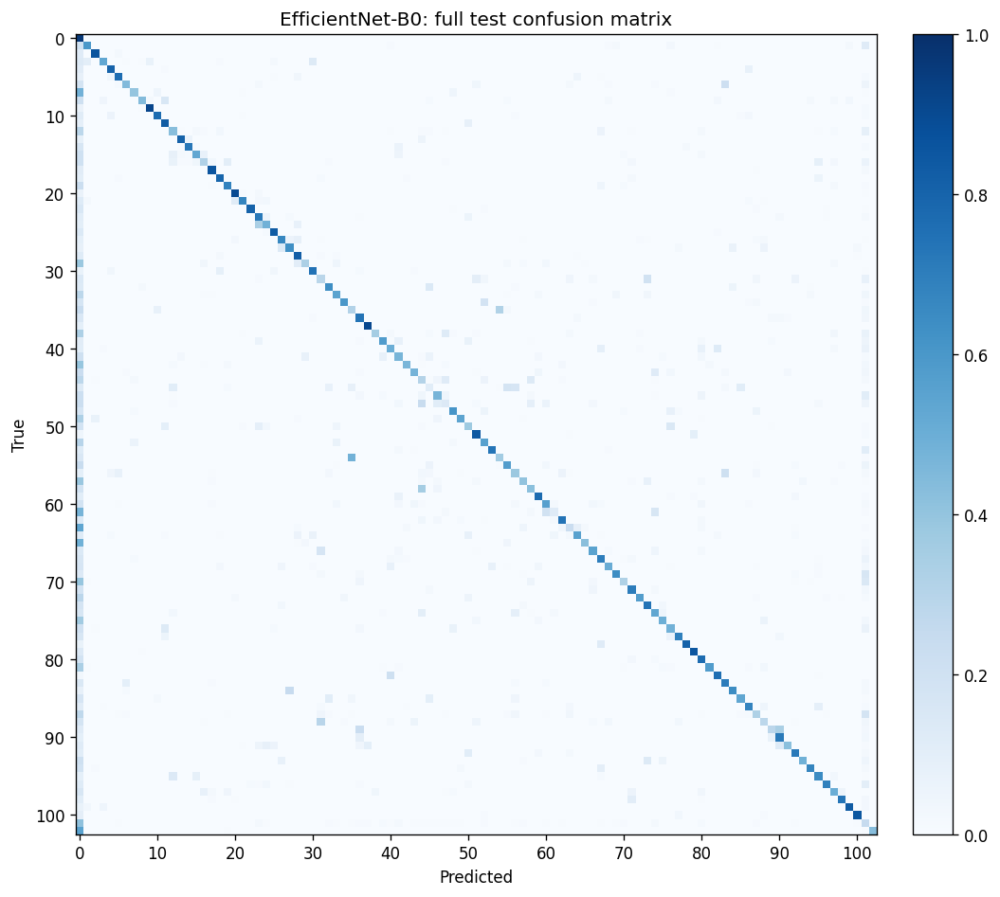

EfficientNet-B0 best 10 classes:
  9 fried rice                     IoU=0.8014 support=549073
 79 shrimp with chill source       IoU=0.7813 support=707674
  2 eels on rice                   IoU=0.7729 support=458314
 20 udon noodle                    IoU=0.7646 support=713089
 17 hamburger                      IoU=0.7544 support=1081756
 22 soba noodle                    IoU=0.7498 support=648752
100 goya chanpuru                  IoU=0.7447 support=332234
 99 mixed rice                     IoU=0.7428 support=423948
 78 fish-shaped pancake with bean jam IoU=0.7296 support=366508
 13 croissant                      IoU=0.7266 support=635498

EfficientNet-B0 worst 10 classes:
 45 fried fish                     IoU=0.0561 support=255284
 47 salmon meuniere                IoU=0.0800 support=143770
 61 beef steak                     IoU=0.1004 support=266150
 44 teriyaki grilled fish          IoU=0.1081 support=171224
 63 ginger pork saute              IoU=0.1592 support=367129
101 others   

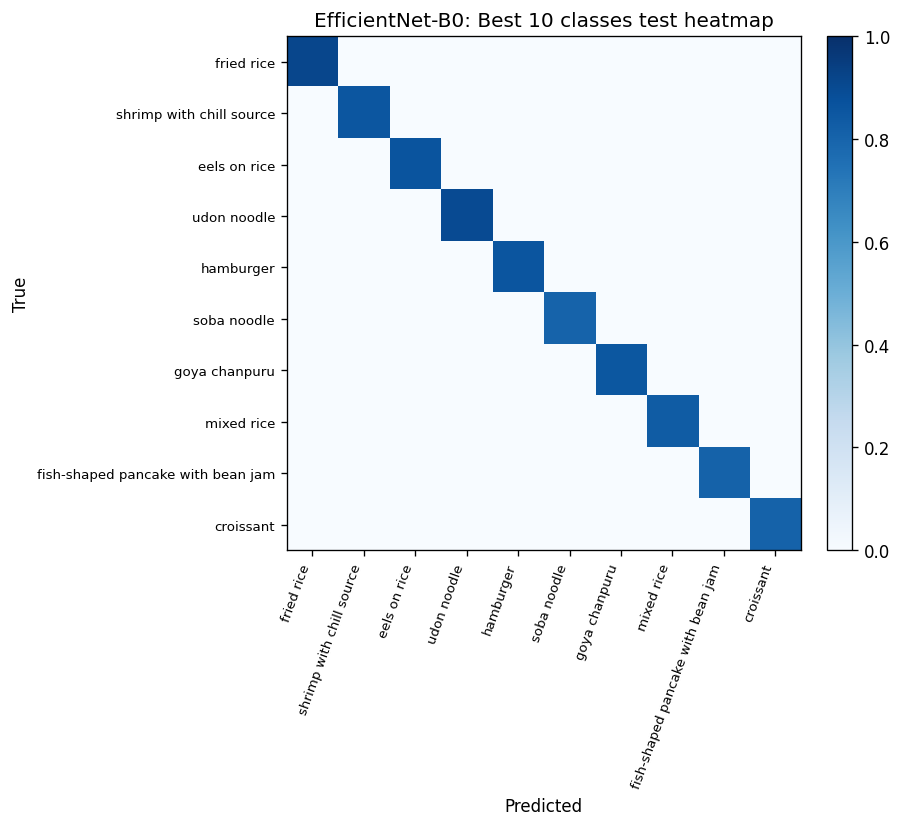

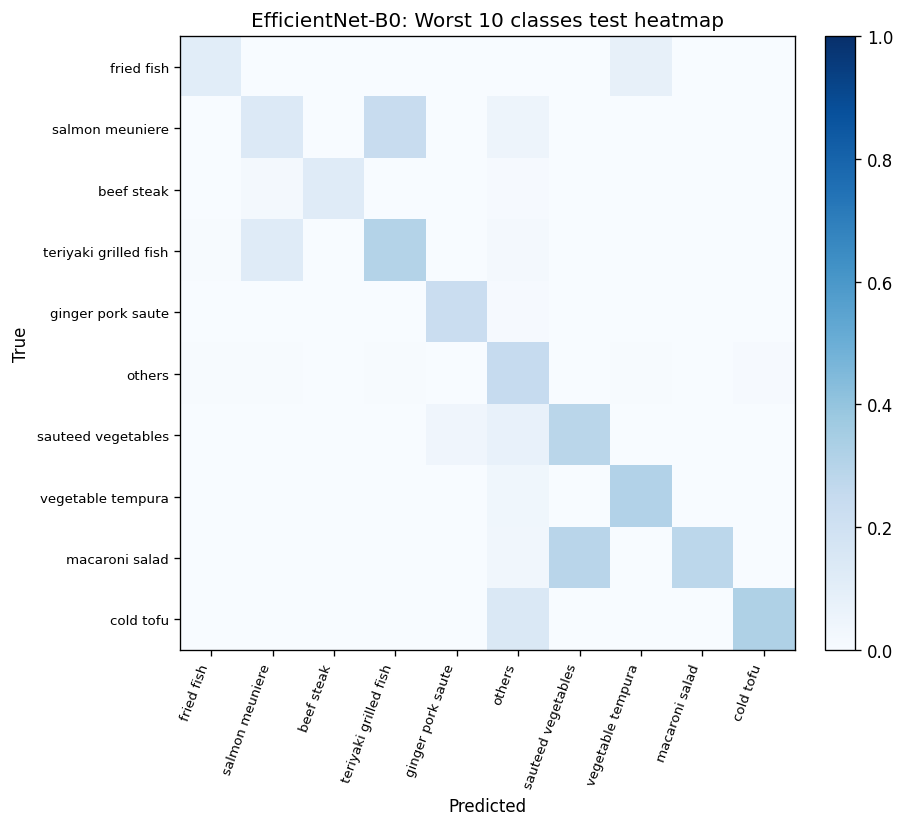

Best epoch: 25
Best validation mIoU: 0.5080272864680323
Test result: {'test_loss': 0.9365322246551514, 'test_accuracy': 0.7938284261067708, 'test_miou': 0.46434228152183377}


In [19]:
EFFICIENTNET_CONFIG = {
    "learning_rate": 3e-4,
    "weight_decay": 1e-4,
    "dropout": 0.2,
    "early_stopping_patience": 6,
    "scheduler_patience": 2,
    "lr_factor": 0.5,
    "pretrained": True,
    "max_epochs": MAX_EPOCHS,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = EfficientNetBaseline(
        pretrained=EFFICIENTNET_CONFIG["pretrained"],
        dropout=EFFICIENTNET_CONFIG["dropout"],
    )
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=EFFICIENTNET_CONFIG["learning_rate"],
        weight_decay=EFFICIENTNET_CONFIG["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=EFFICIENTNET_CONFIG["lr_factor"],
        patience=EFFICIENTNET_CONFIG["scheduler_patience"],
    )
    efficientnet_result = train_model(
        "EfficientNet-B0",
        model,
        baseline_train_loader,
        val_loader,
        test_loader,
        nn.CrossEntropyLoss(),
        optimizer,
        scheduler,
        EFFICIENTNET_CONFIG,
        "EfficientNetB0_best_model.pt",
    )

## 17. Baseline: DenseNet-121

DenseNet-121 is used as a strong comparison model because dense connections encourage feature reuse.

Training DenseNet-121
Config: {'learning_rate': 0.0003, 'weight_decay': 0.0001, 'dropout': 0.2, 'early_stopping_patience': 6, 'scheduler_patience': 2, 'lr_factor': 0.5, 'pretrained': True, 'max_epochs': 25}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/DenseNet121_best_model.pt


{'epoch': 1, 'train_loss': 1.946123070716858, 'val_loss': 1.3669941349029542, 'train_accuracy': 0.597566370985243, 'val_accuracy': 0.6694025390625, 'train_miou': 0.06868614017289294, 'val_miou': 0.15576118937697828}
Saved new best model: val_mIoU=0.1558


{'epoch': 2, 'train_loss': 1.2567965126037597, 'val_loss': 1.1325769896507263, 'train_accuracy': 0.6866933973524305, 'val_accuracy': 0.7055347330729167, 'train_miou': 0.20580340050054413, 'val_miou': 0.23761008086133342}
Saved new best model: val_mIoU=0.2376


{'epoch': 3, 'train_loss': 1.0283341989517212, 'val_loss': 1.025222315311432, 'train_accuracy': 0.7295869520399305, 'val_accuracy': 0.7299105143229166, 'train_miou': 0.29570495345500836, 'val_miou': 0.3008991053771962}
Saved new best model: val_mIoU=0.3009


{'epoch': 4, 'train_loss': 0.8506286066373189, 'val_loss': 1.0069994368553161, 'train_accuracy': 0.766969873046875, 'val_accuracy': 0.7324905110677083, 'train_miou': 0.3805462378173701, 'val_miou': 0.31151364066172815}
Saved new best model: val_mIoU=0.3115


{'epoch': 5, 'train_loss': 0.6928112066586812, 'val_loss': 0.9585307159423828, 'train_accuracy': 0.8036217854817709, 'val_accuracy': 0.7469882486979167, 'train_miou': 0.4686987110011463, 'val_miou': 0.3456075077601158}
Saved new best model: val_mIoU=0.3456


{'epoch': 6, 'train_loss': 0.5685959885915121, 'val_loss': 0.9660287942886353, 'train_accuracy': 0.8346550048828125, 'val_accuracy': 0.7473713704427083, 'train_miou': 0.5523929908345111, 'val_miou': 0.3630854082302547}
Saved new best model: val_mIoU=0.3631


{'epoch': 7, 'train_loss': 0.4886393257776896, 'val_loss': 0.9308088517189026, 'train_accuracy': 0.854496497938368, 'val_accuracy': 0.75652060546875, 'train_miou': 0.6083856707192812, 'val_miou': 0.36945127054776716}
Saved new best model: val_mIoU=0.3695


{'epoch': 8, 'train_loss': 0.4024700604279836, 'val_loss': 0.954473042011261, 'train_accuracy': 0.8783164659288194, 'val_accuracy': 0.7543874186197916, 'train_miou': 0.6737294377572756, 'val_miou': 0.37119644262774415}
Saved new best model: val_mIoU=0.3712


{'epoch': 9, 'train_loss': 0.3407141931056976, 'val_loss': 0.9357634482383728, 'train_accuracy': 0.894405824110243, 'val_accuracy': 0.7593619466145833, 'train_miou': 0.7235456866843327, 'val_miou': 0.38118780284055087}
Saved new best model: val_mIoU=0.3812


{'epoch': 10, 'train_loss': 0.29916188486417133, 'val_loss': 0.9564265193939209, 'train_accuracy': 0.9060109293619791, 'val_accuracy': 0.7614042805989584, 'train_miou': 0.7568425415962681, 'val_miou': 0.3875855938443442}
Saved new best model: val_mIoU=0.3876


{'epoch': 11, 'train_loss': 0.2526352484226227, 'val_loss': 0.9407408533096313, 'train_accuracy': 0.9186857991536458, 'val_accuracy': 0.7610649576822917, 'train_miou': 0.7949861372355053, 'val_miou': 0.38184617343198196}


{'epoch': 12, 'train_loss': 0.22913227113087972, 'val_loss': 1.0121386728286743, 'train_accuracy': 0.9250681857638889, 'val_accuracy': 0.7580533528645833, 'train_miou': 0.8106901784507358, 'val_miou': 0.3683499153109085}


{'epoch': 13, 'train_loss': 0.22215436720848084, 'val_loss': 0.9299078454971313, 'train_accuracy': 0.9266101372612847, 'val_accuracy': 0.7720089192708334, 'train_miou': 0.814130073006594, 'val_miou': 0.4077960780085699}
Saved new best model: val_mIoU=0.4078


{'epoch': 14, 'train_loss': 0.21431798307100933, 'val_loss': 0.9850912165641784, 'train_accuracy': 0.9289030598958333, 'val_accuracy': 0.7653440104166667, 'train_miou': 0.8227071112727742, 'val_miou': 0.3920943933773925}


{'epoch': 15, 'train_loss': 0.17920544175306957, 'val_loss': 0.948950035572052, 'train_accuracy': 0.9388298556857639, 'val_accuracy': 0.7737780598958334, 'train_miou': 0.8512700986274917, 'val_miou': 0.41235163359482635}
Saved new best model: val_mIoU=0.4124


{'epoch': 16, 'train_loss': 0.16262356738249462, 'val_loss': 0.9735844902992249, 'train_accuracy': 0.9437666802300347, 'val_accuracy': 0.7673014973958333, 'train_miou': 0.8666938395881657, 'val_miou': 0.39438327717820976}


{'epoch': 17, 'train_loss': 0.14856137279669443, 'val_loss': 0.9679530491828918, 'train_accuracy': 0.9479241292317708, 'val_accuracy': 0.7727437337239583, 'train_miou': 0.8798874125264116, 'val_miou': 0.4058660984839387}


{'epoch': 18, 'train_loss': 0.1473469805320104, 'val_loss': 0.9708459448814392, 'train_accuracy': 0.9483107259114584, 'val_accuracy': 0.7711579915364584, 'train_miou': 0.8789746866057607, 'val_miou': 0.4111505652476416}


{'epoch': 19, 'train_loss': 0.12146817680199941, 'val_loss': 0.9090186638832092, 'train_accuracy': 0.9560525037977431, 'val_accuracy': 0.7849697428385417, 'train_miou': 0.8989782651104686, 'val_miou': 0.43902350933879636}
Saved new best model: val_mIoU=0.4390


{'epoch': 20, 'train_loss': 0.10505026592810948, 'val_loss': 0.8884612169265748, 'train_accuracy': 0.9609230984157986, 'val_accuracy': 0.7906909016927083, 'train_miou': 0.9118091708224773, 'val_miou': 0.44920458745819963}
Saved new best model: val_mIoU=0.4492


{'epoch': 21, 'train_loss': 0.09696170167128244, 'val_loss': 0.9055872039794922, 'train_accuracy': 0.9632642388237848, 'val_accuracy': 0.7902557942708334, 'train_miou': 0.9179488975813302, 'val_miou': 0.4455499103902813}


{'epoch': 22, 'train_loss': 0.09442022697130839, 'val_loss': 0.9153201251029969, 'train_accuracy': 0.9643484266493055, 'val_accuracy': 0.790277783203125, 'train_miou': 0.9200826684228781, 'val_miou': 0.4462650967414739}


{'epoch': 23, 'train_loss': 0.09257724734147389, 'val_loss': 0.9215102109909058, 'train_accuracy': 0.9647491916232639, 'val_accuracy': 0.78859560546875, 'train_miou': 0.9203917109741276, 'val_miou': 0.4433344941628084}


{'epoch': 24, 'train_loss': 0.08633617420991262, 'val_loss': 0.9031698288917541, 'train_accuracy': 0.9667441162109375, 'val_accuracy': 0.7936832194010417, 'train_miou': 0.9254042553686976, 'val_miou': 0.45548217654811146}
Saved new best model: val_mIoU=0.4555


{'epoch': 25, 'train_loss': 0.08194861276944479, 'val_loss': 0.9182823257446289, 'train_accuracy': 0.9681906412760417, 'val_accuracy': 0.792628857421875, 'train_miou': 0.9288186475399421, 'val_miou': 0.44788213425995144}
Training finished in 104.4 minutes


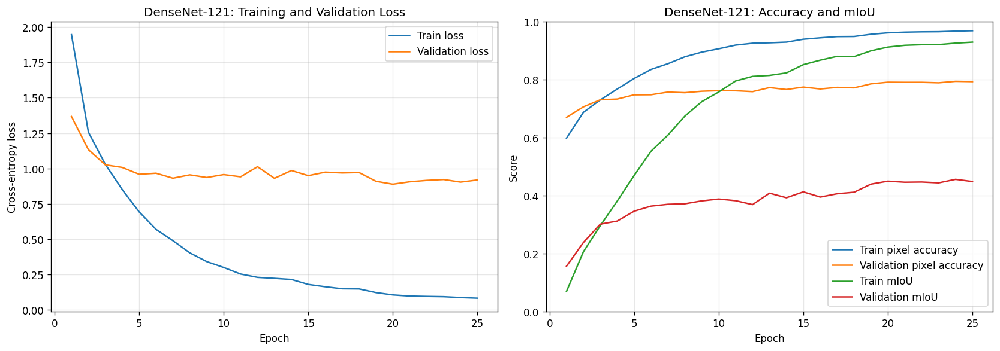

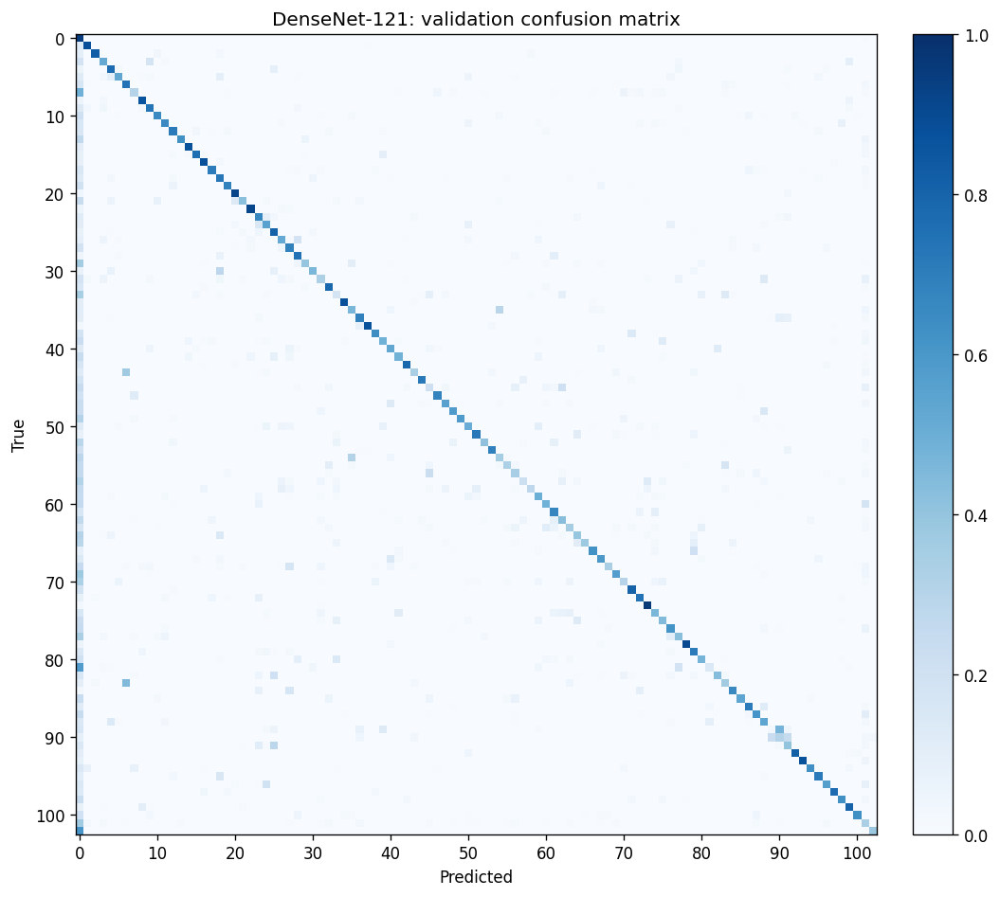

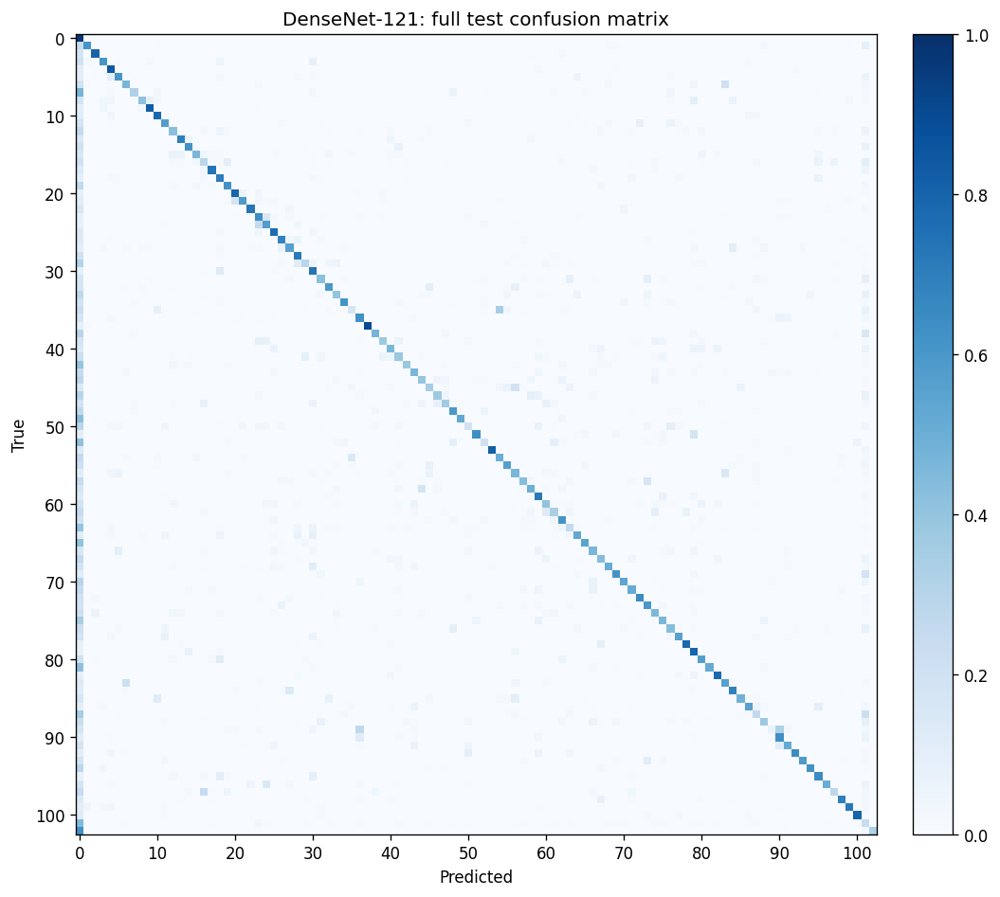

DenseNet-121 best 10 classes:
 37 potage                         IoU=0.8141 support=470193
  9 fried rice                     IoU=0.7344 support=549073
  2 eels on rice                   IoU=0.7073 support=458314
100 goya chanpuru                  IoU=0.6819 support=332234
 78 fish-shaped pancake with bean jam IoU=0.6787 support=366508
 22 soba noodle                    IoU=0.6685 support=648752
 17 hamburger                      IoU=0.6645 support=1081756
 20 udon noodle                    IoU=0.6639 support=713089
 99 mixed rice                     IoU=0.6619 support=423948
 53 steamed egg hotchpotch         IoU=0.6599 support=127838

DenseNet-121 worst 10 classes:
 89 Japanese tofu and vegetable chowder IoU=0.0596 support=343075
 50 sukiyaki                       IoU=0.1284 support=458709
 35 vegetable tempura              IoU=0.1398 support=509143
 52 lightly roasted fish           IoU=0.1530 support=329119
101 others                         IoU=0.1662 support=3425089
 63 ginger po

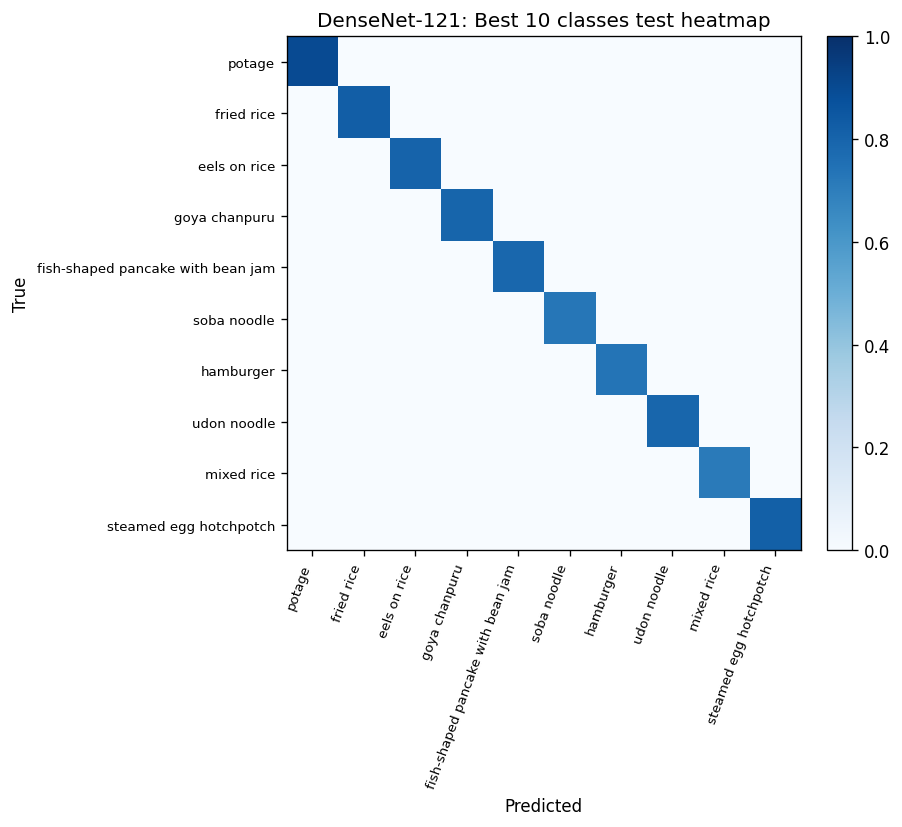

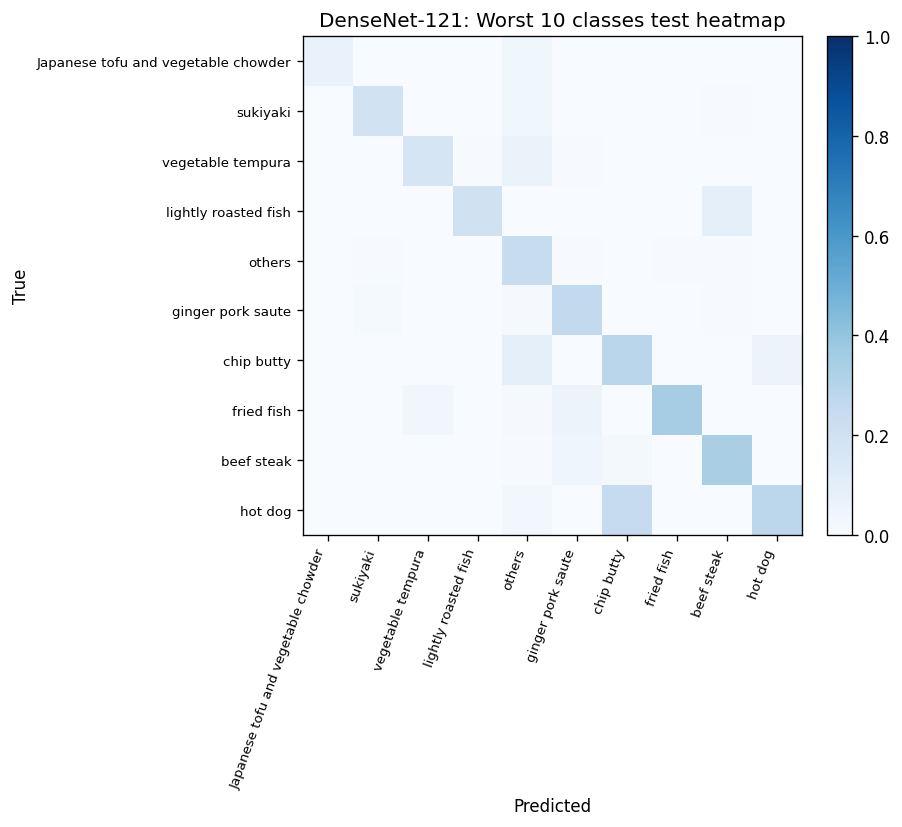

Best epoch: 24
Best validation mIoU: 0.45548217654811146
Test result: {'test_loss': 1.0342416486740111, 'test_accuracy': 0.7791037760416667, 'test_miou': 0.4240046238860449}


In [16]:
DENSENET_CONFIG = {
    "learning_rate": 3e-4,
    "weight_decay": 1e-4,
    "dropout": 0.2,
    "early_stopping_patience": 6,
    "scheduler_patience": 2,
    "lr_factor": 0.5,
    "pretrained": True,
    "max_epochs": MAX_EPOCHS,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = DenseNetBaseline(pretrained=DENSENET_CONFIG["pretrained"], dropout=DENSENET_CONFIG["dropout"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=DENSENET_CONFIG["learning_rate"], weight_decay=DENSENET_CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=DENSENET_CONFIG["lr_factor"], patience=DENSENET_CONFIG["scheduler_patience"]
    )
    densenet_result = train_model(
        "DenseNet-121",
        model,
        baseline_train_loader,
        val_loader,
        test_loader,
        nn.CrossEntropyLoss(),
        optimizer,
        scheduler,
        DENSENET_CONFIG,
        "DenseNet121_best_model.pt",
    )

## 18. Baseline: ResNet50-FCN

ResNet50-FCN adapts a common residual backbone for pixel-level prediction using a small convolutional head.

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 233MB/s]


Training ResNet50-FCN
Config: {'learning_rate': 0.00015, 'weight_decay': 0.00075, 'dropout': 0.4, 'early_stopping_patience': 3, 'scheduler_patience': 2, 'lr_factor': 0.5, 'pretrained': True, 'max_epochs': 25}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/ResNet50FCN_best_model.pt


{'epoch': 1, 'train_loss': 2.1013916368484495, 'val_loss': 1.364762742996216, 'train_accuracy': 0.6039437717013889, 'val_accuracy': 0.6949330240885416, 'train_miou': 0.07852793767333507, 'val_miou': 0.1982120249689155}
Saved new best model: val_mIoU=0.1982


{'epoch': 2, 'train_loss': 1.2396671733856202, 'val_loss': 1.0649940557479858, 'train_accuracy': 0.7156980712890625, 'val_accuracy': 0.7313076334635417, 'train_miou': 0.25324605412451384, 'val_miou': 0.3052113236992463}
Saved new best model: val_mIoU=0.3052


{'epoch': 3, 'train_loss': 0.900205601533254, 'val_loss': 0.9400509157180786, 'train_accuracy': 0.7790769124348959, 'val_accuracy': 0.7591107584635417, 'train_miou': 0.40282937422765125, 'val_miou': 0.37572863159106096}
Saved new best model: val_mIoU=0.3757


{'epoch': 4, 'train_loss': 0.6584153682390849, 'val_loss': 0.9006809735298157, 'train_accuracy': 0.832224476453993, 'val_accuracy': 0.7644548828125, 'train_miou': 0.541782410301569, 'val_miou': 0.39712703709646496}
Saved new best model: val_mIoU=0.3971


{'epoch': 5, 'train_loss': 0.49404356988271075, 'val_loss': 0.8634494667053223, 'train_accuracy': 0.8687334309895833, 'val_accuracy': 0.7760842122395833, 'train_miou': 0.6454736226596977, 'val_miou': 0.42063144857020546}
Saved new best model: val_mIoU=0.4206


{'epoch': 6, 'train_loss': 0.3842880614598592, 'val_loss': 0.8840613203048706, 'train_accuracy': 0.8941250813802083, 'val_accuracy': 0.775950830078125, 'train_miou': 0.7213469340473897, 'val_miou': 0.42781982017012504}
Saved new best model: val_mIoU=0.4278


{'epoch': 7, 'train_loss': 0.29488423069318137, 'val_loss': 0.854743264913559, 'train_accuracy': 0.9152820882161459, 'val_accuracy': 0.7815623209635416, 'train_miou': 0.7832841027271551, 'val_miou': 0.4422365743547001}
Saved new best model: val_mIoU=0.4422


{'epoch': 8, 'train_loss': 0.2445279517173767, 'val_loss': 0.9126085128784179, 'train_accuracy': 0.9268863498263888, 'val_accuracy': 0.7762453938802083, 'train_miou': 0.8193455562205194, 'val_miou': 0.4208766334833765}


{'epoch': 9, 'train_loss': 0.21001633787155152, 'val_loss': 0.8993039631843567, 'train_accuracy': 0.9343539225260417, 'val_accuracy': 0.778920703125, 'train_miou': 0.8412075869651067, 'val_miou': 0.43137436088377523}


{'epoch': 10, 'train_loss': 0.17924530418713888, 'val_loss': 0.8745904631614685, 'train_accuracy': 0.942053076171875, 'val_accuracy': 0.7831553385416666, 'train_miou': 0.8639852951538138, 'val_miou': 0.4432172341485282}
Saved new best model: val_mIoU=0.4432


{'epoch': 11, 'train_loss': 0.17145580557982126, 'val_loss': 0.880044973373413, 'train_accuracy': 0.9438796929253472, 'val_accuracy': 0.7837722005208333, 'train_miou': 0.868104488384741, 'val_miou': 0.44458243472402964}
Saved new best model: val_mIoU=0.4446


{'epoch': 12, 'train_loss': 0.15363175280888874, 'val_loss': 0.8792952103614807, 'train_accuracy': 0.9482955050998264, 'val_accuracy': 0.7843084635416666, 'train_miou': 0.8797299843986259, 'val_miou': 0.44927201862918603}
Saved new best model: val_mIoU=0.4493


{'epoch': 13, 'train_loss': 0.13997707923253377, 'val_loss': 0.8774773125648498, 'train_accuracy': 0.951890443250868, 'val_accuracy': 0.790084375, 'train_miou': 0.8889674770183855, 'val_miou': 0.4545851555271438}
Saved new best model: val_mIoU=0.4546


{'epoch': 14, 'train_loss': 0.13050144418080648, 'val_loss': 0.9330073456764221, 'train_accuracy': 0.9545047146267361, 'val_accuracy': 0.780789794921875, 'train_miou': 0.8951560883369855, 'val_miou': 0.43891688068379486}


{'epoch': 15, 'train_loss': 0.1326435745159785, 'val_loss': 0.9599093880653381, 'train_accuracy': 0.9539767686631945, 'val_accuracy': 0.7783808430989584, 'train_miou': 0.8924027706201229, 'val_miou': 0.436087645921131}


{'epoch': 16, 'train_loss': 0.1319511795838674, 'val_loss': 0.9331787605285644, 'train_accuracy': 0.9540439425998264, 'val_accuracy': 0.786120849609375, 'train_miou': 0.8927143087770287, 'val_miou': 0.447615146305534}
Early stopping after 3 epochs without validation mIoU improvement
Training finished in 26.7 minutes


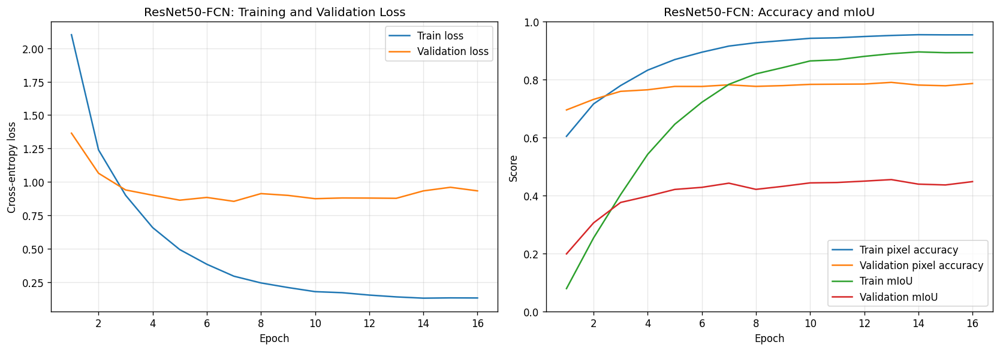

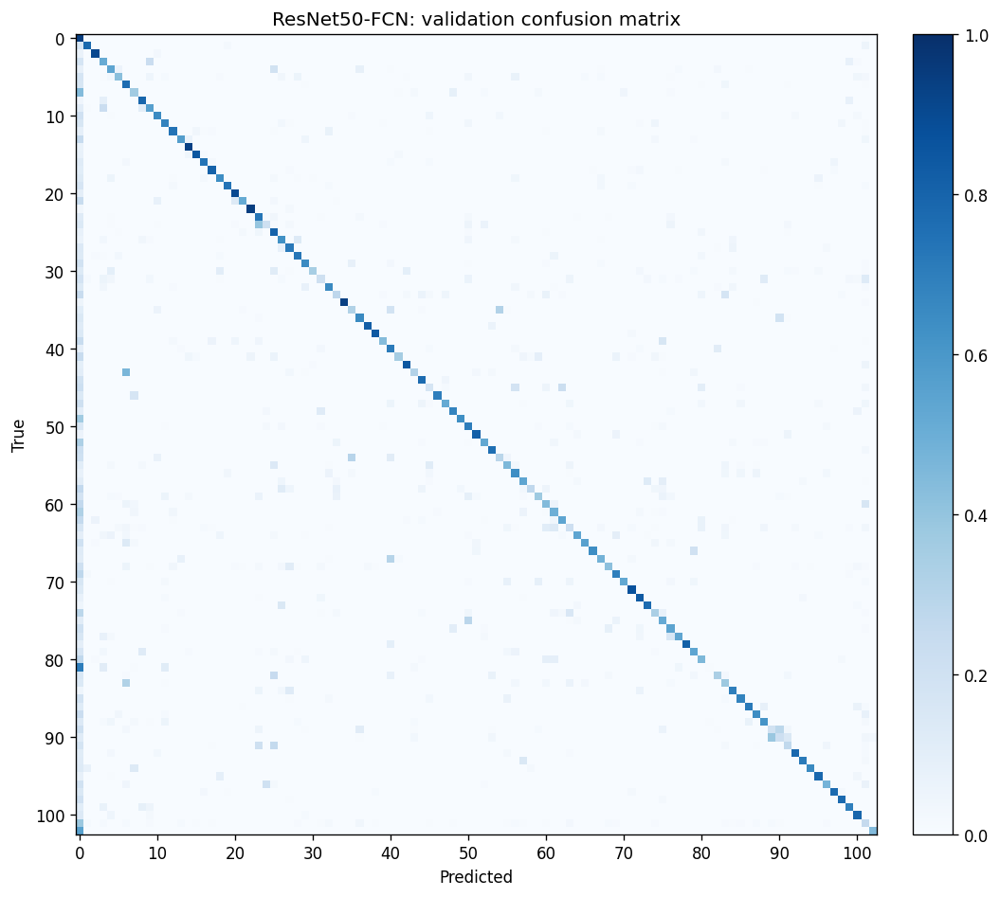

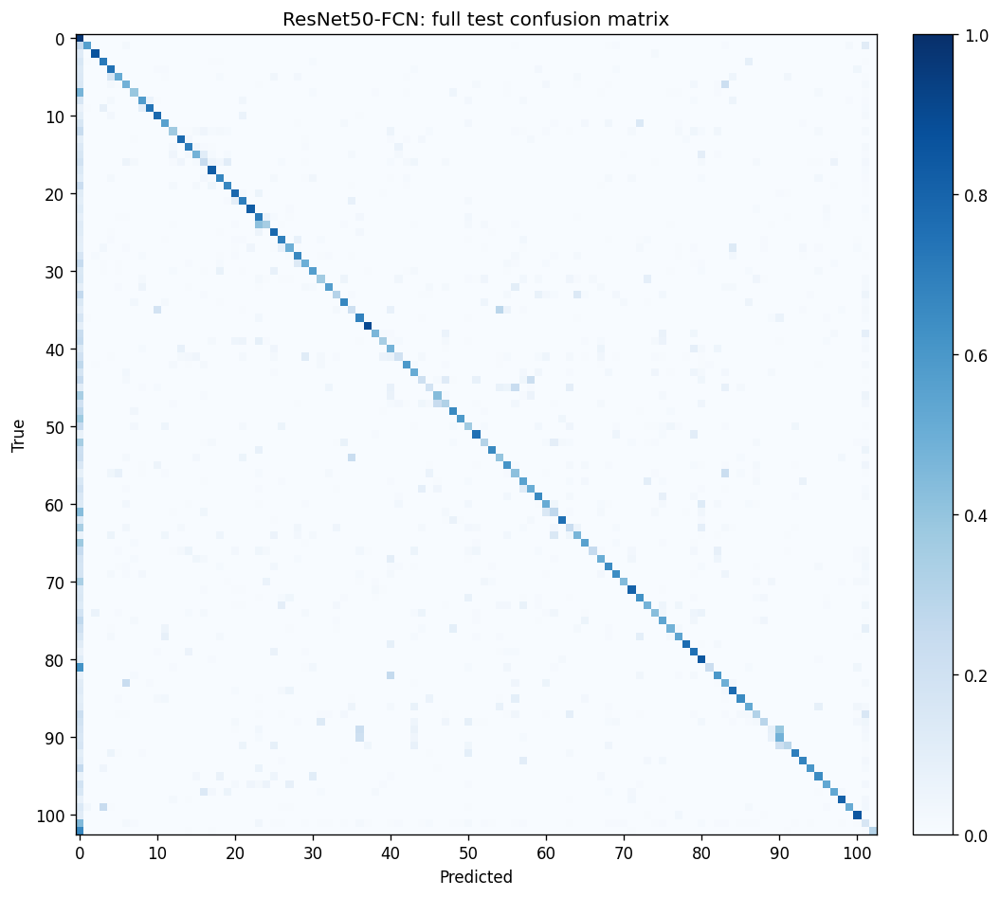

ResNet50-FCN best 10 classes:
 37 potage                         IoU=0.7578 support=470193
  2 eels on rice                   IoU=0.7236 support=458314
 22 soba noodle                    IoU=0.7214 support=648752
 78 fish-shaped pancake with bean jam IoU=0.7170 support=366508
 17 hamburger                      IoU=0.7003 support=1081756
  9 fried rice                     IoU=0.6735 support=549073
 13 croissant                      IoU=0.6578 support=635498
 20 udon noodle                    IoU=0.6450 support=713089
 98 french fries                   IoU=0.6428 support=410673
 62 dried fish                     IoU=0.6379 support=358412

ResNet50-FCN worst 10 classes:
 89 Japanese tofu and vegetable chowder IoU=0.0686 support=343075
 44 teriyaki grilled fish          IoU=0.1154 support=171224
 45 fried fish                     IoU=0.1205 support=255284
 63 ginger pork saute              IoU=0.1262 support=367129
101 others                         IoU=0.1264 support=3425089
 35 vegetable

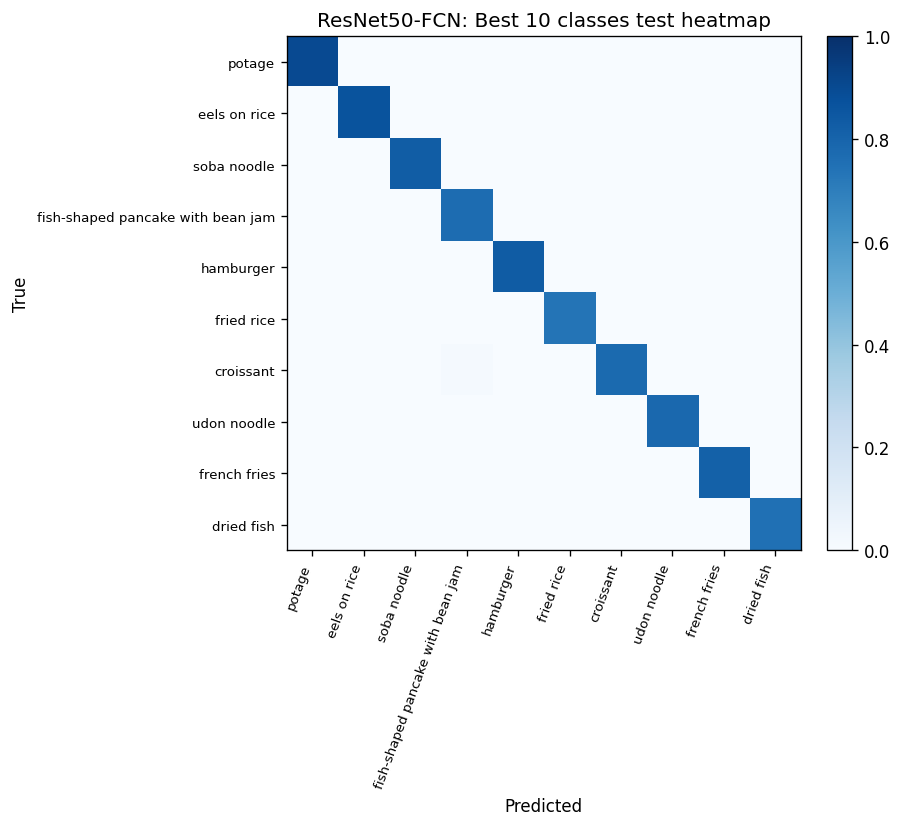

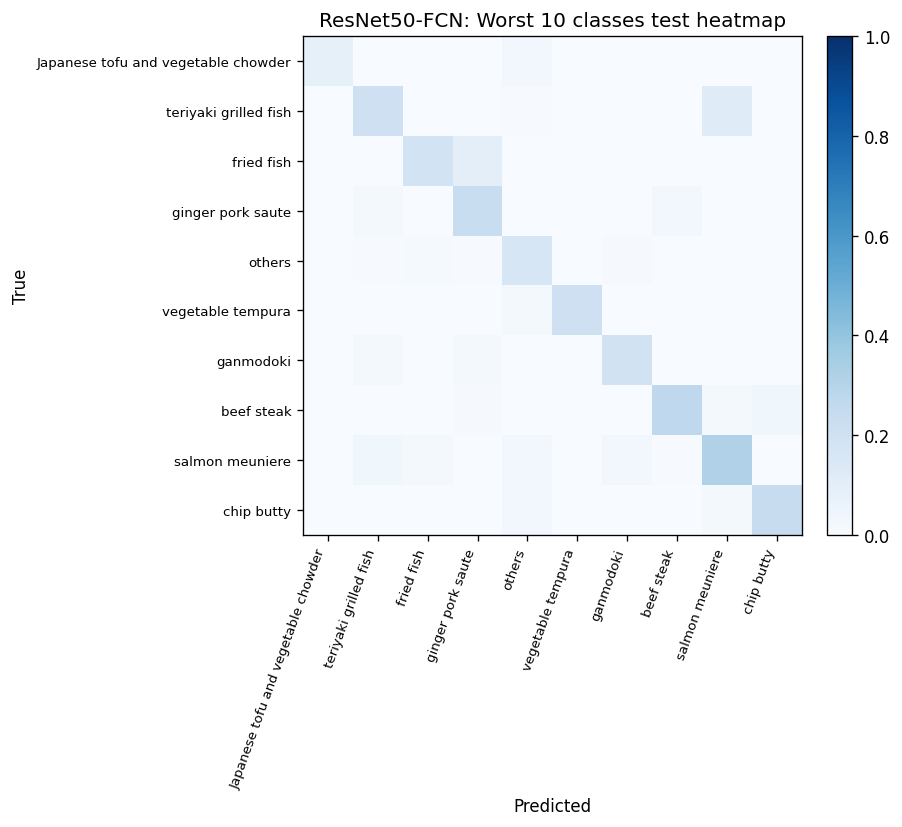

Best epoch: 13
Best validation mIoU: 0.4545851555271438
Test result: {'test_loss': 0.9891071338653564, 'test_accuracy': 0.7780416178385416, 'test_miou': 0.4161677565724829}


In [17]:
RESNET50_CONFIG = {
    "learning_rate": 1.5e-4,
    "weight_decay": 7.5e-4,
    "dropout": 0.4,
    "early_stopping_patience": 3,
    "scheduler_patience": 2,
    "lr_factor": 0.5,
    "pretrained": True,
    "max_epochs": MAX_EPOCHS,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = ResNet50FCN(pretrained=RESNET50_CONFIG["pretrained"], dropout=RESNET50_CONFIG["dropout"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=RESNET50_CONFIG["learning_rate"], weight_decay=RESNET50_CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=RESNET50_CONFIG["lr_factor"], patience=RESNET50_CONFIG["scheduler_patience"]
    )
    resnet50_result = train_model(
        "ResNet50-FCN",
        model,
        baseline_train_loader,
        val_loader,
        test_loader,
        nn.CrossEntropyLoss(),
        optimizer,
        scheduler,
        RESNET50_CONFIG,
        "ResNet50FCN_best_model.pt",
    )

## 19. Baseline: VGG16-FCN With Stronger Regularisation

VGG16 showed clear overfitting in earlier experiments: training loss kept decreasing while validation loss stopped
improving and then increased. In this combined notebook, VGG16 uses a lower learning rate, stronger weight decay,
larger dropout, shorter early-stopping patience, and encoder freezing at the beginning.

This cell trains VGG16-FCN with adjusted parameters to reduce overfitting.

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 235MB/s] 


Training VGG16-FCN
Config: {'learning_rate': 5e-05, 'weight_decay': 0.002, 'dropout': 0.65, 'early_stopping_patience': 2, 'scheduler_patience': 1, 'lr_factor': 0.5, 'pretrained': True, 'freeze_encoder_epochs': 8, 'max_epochs': 25}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/VGG16FCN_best_model.pt


{'epoch': 1, 'train_loss': 2.841475746790568, 'val_loss': 2.2945859880447386, 'train_accuracy': 0.5555142605251736, 'val_accuracy': 0.5791552083333333, 'train_miou': 0.006756269255952253, 'val_miou': 0.007449528817777083}
Saved new best model: val_mIoU=0.0074


{'epoch': 2, 'train_loss': 2.311196798960368, 'val_loss': 2.111126727104187, 'train_accuracy': 0.5807808159722222, 'val_accuracy': 0.5883111002604167, 'train_miou': 0.014259948028412888, 'val_miou': 0.01967044082578567}
Saved new best model: val_mIoU=0.0197


{'epoch': 3, 'train_loss': 2.1613199208577476, 'val_loss': 1.974204291343689, 'train_accuracy': 0.5887949652777777, 'val_accuracy': 0.6063357259114583, 'train_miou': 0.028555100828573807, 'val_miou': 0.044802399864573635}
Saved new best model: val_mIoU=0.0448


{'epoch': 4, 'train_loss': 2.048217987060547, 'val_loss': 1.8694744606018066, 'train_accuracy': 0.5965067165798611, 'val_accuracy': 0.6151563313802083, 'train_miou': 0.04280556314316334, 'val_miou': 0.05729929436386584}
Saved new best model: val_mIoU=0.0573


{'epoch': 5, 'train_loss': 1.946473085721334, 'val_loss': 1.7845842790603639, 'train_accuracy': 0.6047422471788194, 'val_accuracy': 0.6247785807291667, 'train_miou': 0.055370522343115625, 'val_miou': 0.0773365125134041}
Saved new best model: val_mIoU=0.0773


{'epoch': 6, 'train_loss': 1.873251187324524, 'val_loss': 1.710577317237854, 'train_accuracy': 0.6114507052951389, 'val_accuracy': 0.6345304524739583, 'train_miou': 0.06798787996576477, 'val_miou': 0.09690495869761702}
Saved new best model: val_mIoU=0.0969


{'epoch': 7, 'train_loss': 1.8106183849970499, 'val_loss': 1.6557983074188232, 'train_accuracy': 0.6178414577907986, 'val_accuracy': 0.6387071940104166, 'train_miou': 0.08218646798791147, 'val_miou': 0.10456003416985177}
Saved new best model: val_mIoU=0.1046


{'epoch': 8, 'train_loss': 1.76818021996816, 'val_loss': 1.6092296495437621, 'train_accuracy': 0.6220981282552084, 'val_accuracy': 0.6455474772135417, 'train_miou': 0.08833333855560961, 'val_miou': 0.12003196074483237}
Saved new best model: val_mIoU=0.1200


{'epoch': 9, 'train_loss': 1.6835119050343832, 'val_loss': 1.4257602624893189, 'train_accuracy': 0.6299761800130208, 'val_accuracy': 0.6683167317708333, 'train_miou': 0.10730040963337954, 'val_miou': 0.16012895966174115}
Saved new best model: val_mIoU=0.1601


{'epoch': 10, 'train_loss': 1.5084771010080973, 'val_loss': 1.3778303508758545, 'train_accuracy': 0.6533468451605903, 'val_accuracy': 0.6766206705729166, 'train_miou': 0.14918676106286327, 'val_miou': 0.18309939472330555}
Saved new best model: val_mIoU=0.1831


{'epoch': 11, 'train_loss': 1.3773069564501446, 'val_loss': 1.2698619775772095, 'train_accuracy': 0.674925181749132, 'val_accuracy': 0.6915353841145834, 'train_miou': 0.18765822201029925, 'val_miou': 0.20936901141066616}
Saved new best model: val_mIoU=0.2094


{'epoch': 12, 'train_loss': 1.278721271197001, 'val_loss': 1.205394139289856, 'train_accuracy': 0.6926846625434028, 'val_accuracy': 0.70925244140625, 'train_miou': 0.2227846799266635, 'val_miou': 0.24575080674775895}
Saved new best model: val_mIoU=0.2458


{'epoch': 13, 'train_loss': 1.1750504687627157, 'val_loss': 1.2299154200553895, 'train_accuracy': 0.7102609781901041, 'val_accuracy': 0.7006760579427084, 'train_miou': 0.26081850848373384, 'val_miou': 0.2332159454330043}


{'epoch': 14, 'train_loss': 1.1036551462809245, 'val_loss': 1.1314840669631958, 'train_accuracy': 0.7232117404513889, 'val_accuracy': 0.718066357421875, 'train_miou': 0.2894584531568933, 'val_miou': 0.27591788057302913}
Saved new best model: val_mIoU=0.2759


{'epoch': 15, 'train_loss': 1.034357655843099, 'val_loss': 1.131276750087738, 'train_accuracy': 0.738560826280382, 'val_accuracy': 0.7174616373697916, 'train_miou': 0.31621432722846854, 'val_miou': 0.2790454327089238}
Saved new best model: val_mIoU=0.2790


{'epoch': 16, 'train_loss': 0.9622964836756388, 'val_loss': 1.1078829979896545, 'train_accuracy': 0.7526432020399305, 'val_accuracy': 0.7267165690104167, 'train_miou': 0.35180817903787803, 'val_miou': 0.3019696715737379}
Saved new best model: val_mIoU=0.3020


{'epoch': 17, 'train_loss': 0.875181250890096, 'val_loss': 1.1481661052703858, 'train_accuracy': 0.7693963921440973, 'val_accuracy': 0.7230857096354166, 'train_miou': 0.3893405257510718, 'val_miou': 0.29130106853019394}


{'epoch': 18, 'train_loss': 0.816648572921753, 'val_loss': 1.115054437637329, 'train_accuracy': 0.7829308322482639, 'val_accuracy': 0.7261443359375, 'train_miou': 0.4232008381567585, 'val_miou': 0.30166252501246865}
Early stopping after 2 epochs without validation mIoU improvement
Training finished in 29.1 minutes


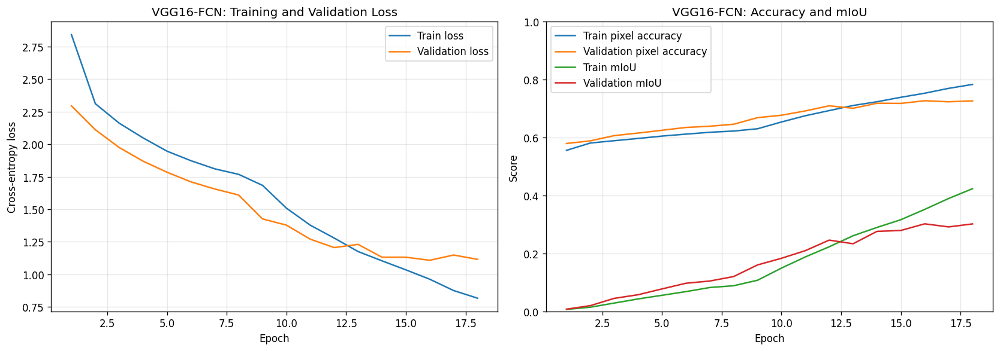

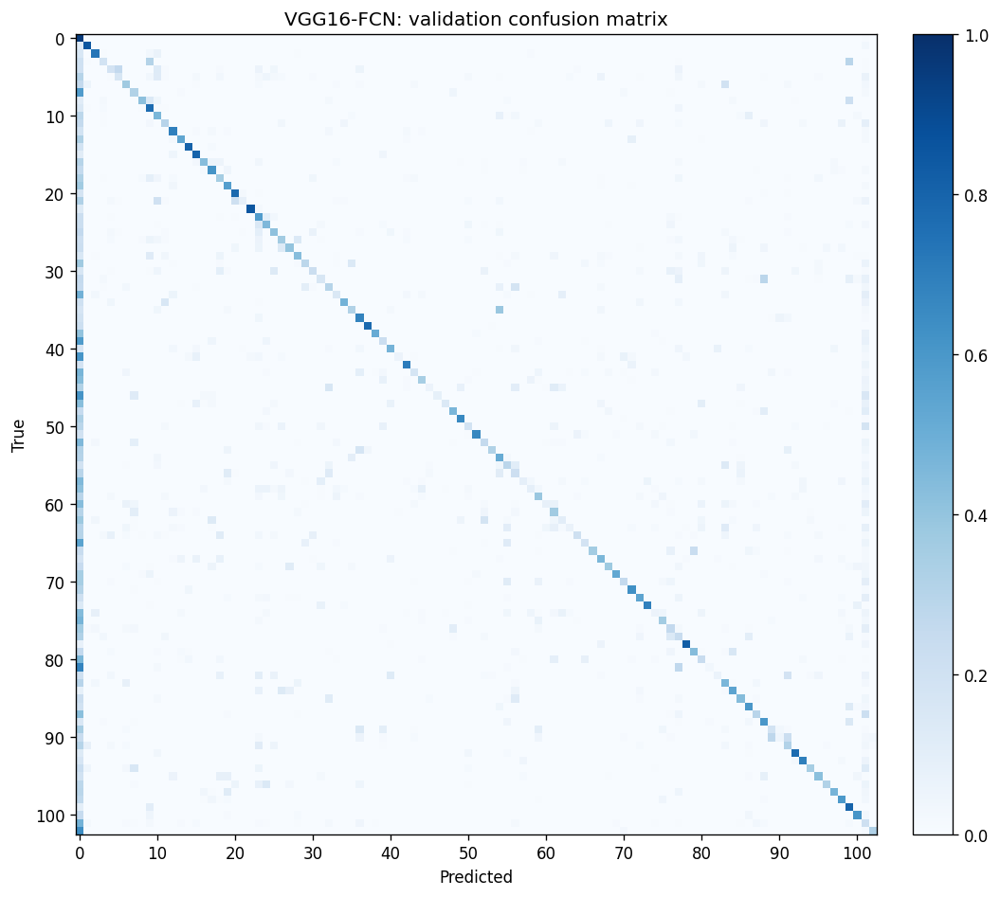

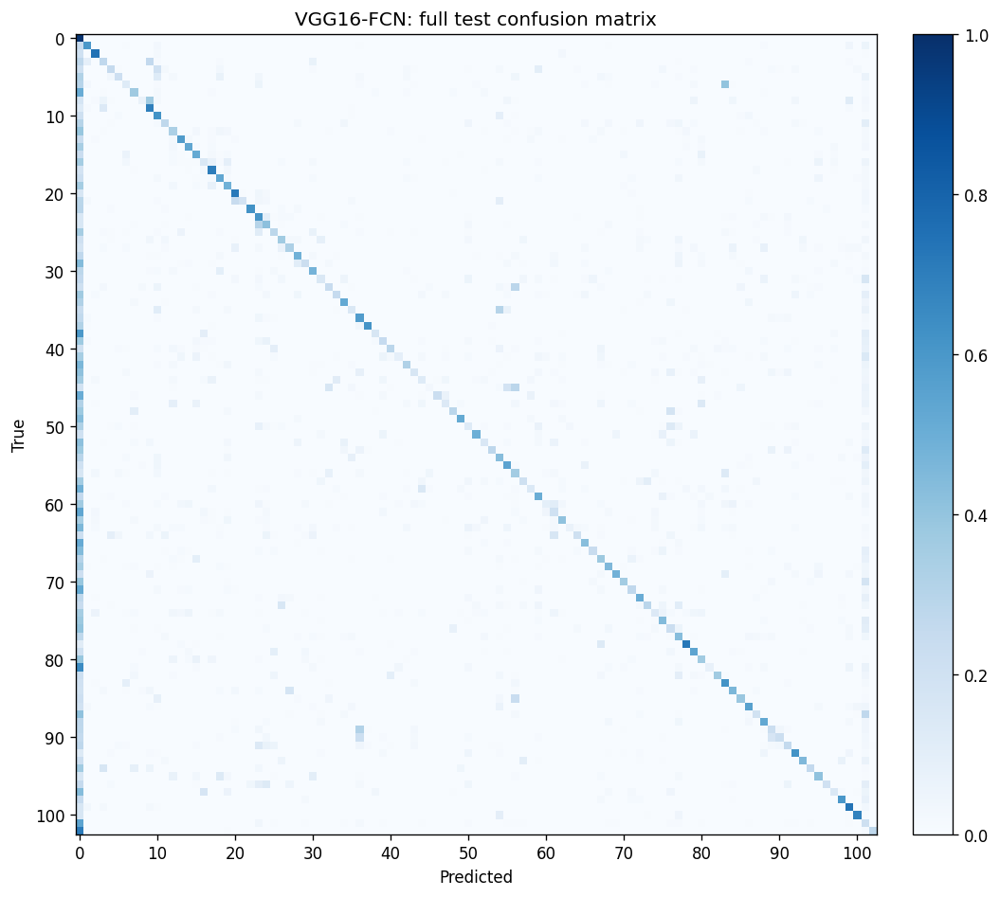

VGG16-FCN best 10 classes:
  2 eels on rice                   IoU=0.6010 support=458314
 78 fish-shaped pancake with bean jam IoU=0.5929 support=366508
 22 soba noodle                    IoU=0.5872 support=648752
 37 potage                         IoU=0.5720 support=470193
 17 hamburger                      IoU=0.5457 support=1081756
100 goya chanpuru                  IoU=0.5396 support=332234
 20 udon noodle                    IoU=0.5343 support=713089
 92 beef bowl                      IoU=0.4899 support=547731
  1 rice                           IoU=0.4861 support=927350
 13 croissant                      IoU=0.4857 support=635498

VGG16-FCN worst 10 classes:
 45 fried fish                     IoU=0.0205 support=255284
  8 chicken rice                   IoU=0.0607 support=334386
 63 ginger pork saute              IoU=0.0631 support=367129
 81 steamed meat dumpling          IoU=0.0677 support=403905
 44 teriyaki grilled fish          IoU=0.0712 support=171224
 50 sukiyaki             

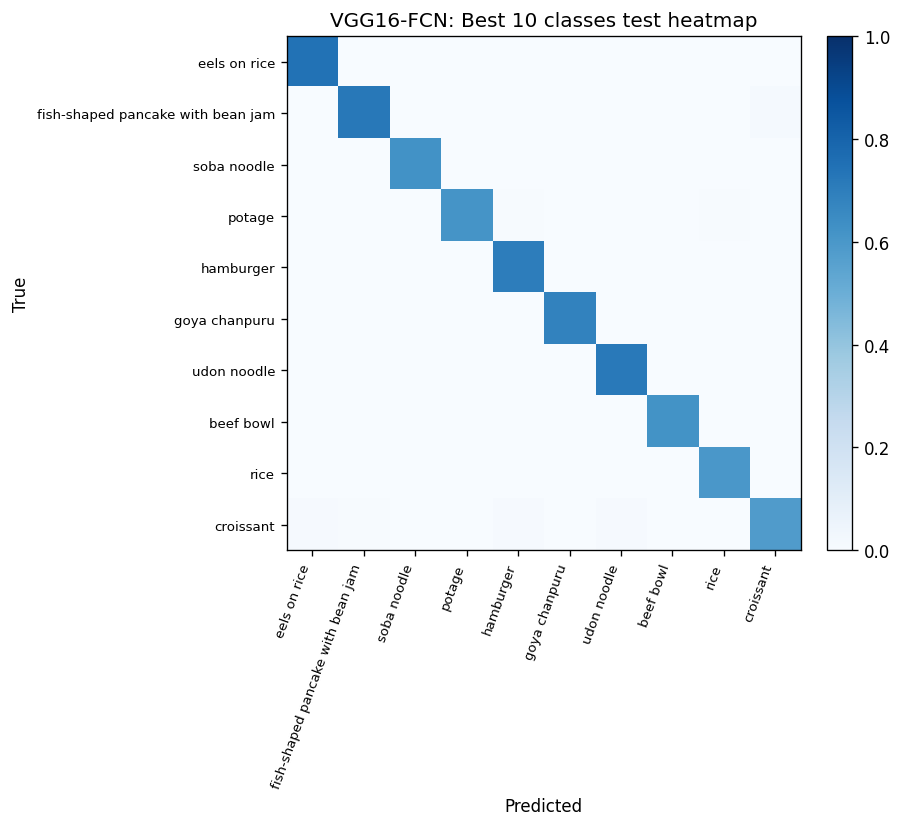

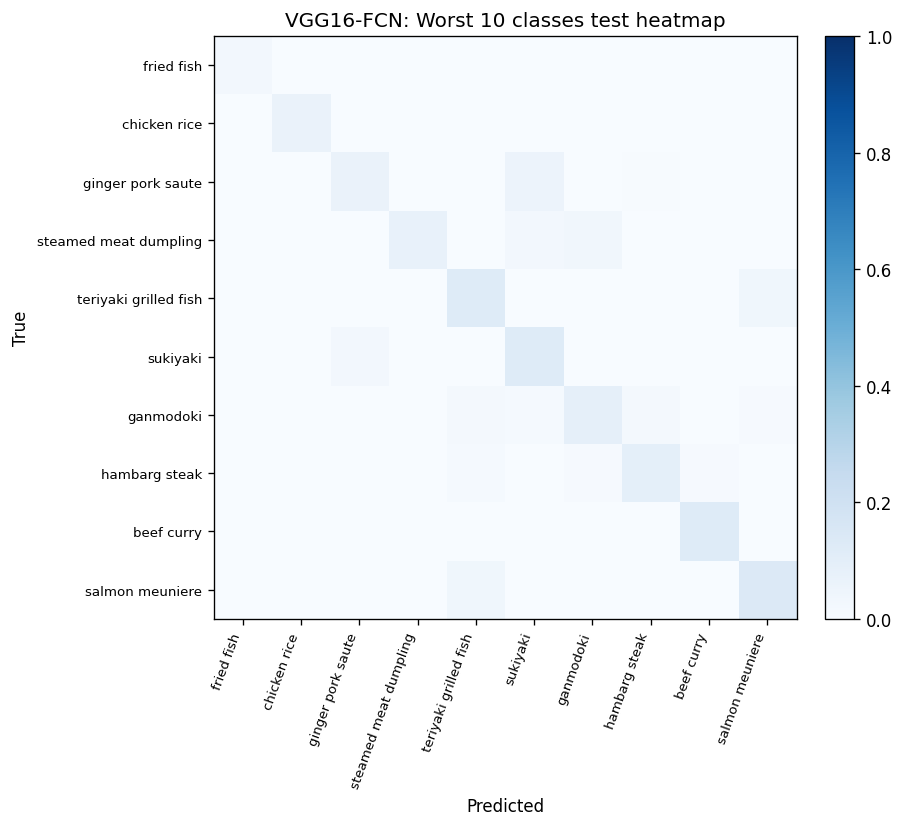

Best epoch: 16
Best validation mIoU: 0.3019696715737379
Test result: {'test_loss': 1.1432699069976806, 'test_accuracy': 0.71407705078125, 'test_miou': 0.27627127312048516}


In [18]:
VGG16_CONFIG = {
    "learning_rate": 5e-5,
    "weight_decay": 2e-3,
    "dropout": 0.65,
    "early_stopping_patience": 2,
    "scheduler_patience": 1,
    "lr_factor": 0.5,
    "pretrained": True,
    "freeze_encoder_epochs": 8,
    "max_epochs": MAX_EPOCHS,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = VGG16FCN(pretrained=VGG16_CONFIG["pretrained"], dropout=VGG16_CONFIG["dropout"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=VGG16_CONFIG["learning_rate"], weight_decay=VGG16_CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=VGG16_CONFIG["lr_factor"], patience=VGG16_CONFIG["scheduler_patience"]
    )
    vgg16_result = train_model(
        "VGG16-FCN",
        model,
        baseline_train_loader,
        val_loader,
        test_loader,
        nn.CrossEntropyLoss(),
        optimizer,
        scheduler,
        VGG16_CONFIG,
        "VGG16FCN_best_model.pt",
    )

## 20. EfficientNet-B0 With Simple Data Augmentation

Data augmentation is used as a simple optimisation step between the baseline and more complex architectures.
It applies random crops, small rotations, horizontal flips, and mild colour changes.

This cell trains EfficientNet-B0 using stronger image augmentation while keeping the same split and model family.

Training EfficientNet-B0 + Simple Augmentation
Config: {'learning_rate': 0.0003, 'weight_decay': 0.0001, 'dropout': 0.2, 'early_stopping_patience': 5, 'scheduler_patience': 2, 'lr_factor': 0.5, 'pretrained': True, 'max_epochs': 25}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/EfficientNetB0_Augmented_best_model.pt


{'epoch': 1, 'train_loss': 2.218323319753011, 'val_loss': 1.3988771796226502, 'train_accuracy': 0.5592415093315972, 'val_accuracy': 0.6753544108072916, 'train_miou': 0.04702463571825343, 'val_miou': 0.1642001780472747}
Saved new best model: val_mIoU=0.1642


{'epoch': 2, 'train_loss': 1.2759406366348267, 'val_loss': 1.0078144941329956, 'train_accuracy': 0.6901764729817709, 'val_accuracy': 0.7347180989583333, 'train_miou': 0.20546884243697425, 'val_miou': 0.30913253437509186}
Saved new best model: val_mIoU=0.3091


{'epoch': 3, 'train_loss': 0.9646041390101114, 'val_loss': 0.9322865920066834, 'train_accuracy': 0.7437290690104167, 'val_accuracy': 0.7447150716145833, 'train_miou': 0.32484604661817224, 'val_miou': 0.3425849436383076}
Saved new best model: val_mIoU=0.3426


{'epoch': 4, 'train_loss': 0.7598432731628418, 'val_loss': 0.8223223242759704, 'train_accuracy': 0.7882465304904513, 'val_accuracy': 0.7692657877604167, 'train_miou': 0.4342397813901696, 'val_miou': 0.39594378904943006}
Saved new best model: val_mIoU=0.3959


{'epoch': 5, 'train_loss': 0.6304988595644633, 'val_loss': 0.8177933492660523, 'train_accuracy': 0.8168484483506945, 'val_accuracy': 0.7706983235677083, 'train_miou': 0.506613543747997, 'val_miou': 0.4111439443129627}
Saved new best model: val_mIoU=0.4111


{'epoch': 6, 'train_loss': 0.5417515624364218, 'val_loss': 0.7967147879600525, 'train_accuracy': 0.838402113172743, 'val_accuracy': 0.77576728515625, 'train_miou': 0.563650007589766, 'val_miou': 0.42587465172305305}
Saved new best model: val_mIoU=0.4259


{'epoch': 7, 'train_loss': 0.4489651202360789, 'val_loss': 0.7906923661231995, 'train_accuracy': 0.8626981635199653, 'val_accuracy': 0.7790440266927083, 'train_miou': 0.6352464562306805, 'val_miou': 0.4341663501569615}
Saved new best model: val_mIoU=0.4342


{'epoch': 8, 'train_loss': 0.3996471940676371, 'val_loss': 0.7771122677326202, 'train_accuracy': 0.8757140082465278, 'val_accuracy': 0.7872920084635416, 'train_miou': 0.6727823586238653, 'val_miou': 0.4524777834719095}
Saved new best model: val_mIoU=0.4525


{'epoch': 9, 'train_loss': 0.3504912150700887, 'val_loss': 0.789336242198944, 'train_accuracy': 0.8886094184027777, 'val_accuracy': 0.78332197265625, 'train_miou': 0.7135303726008123, 'val_miou': 0.44552843100030487}


{'epoch': 10, 'train_loss': 0.32122827545801796, 'val_loss': 0.7908623611927033, 'train_accuracy': 0.8960649359809028, 'val_accuracy': 0.7876990071614584, 'train_miou': 0.7352209791477198, 'val_miou': 0.4644393610575069}
Saved new best model: val_mIoU=0.4644


{'epoch': 11, 'train_loss': 0.294352765083313, 'val_loss': 0.7743507285118103, 'train_accuracy': 0.9042340386284722, 'val_accuracy': 0.7903991536458334, 'train_miou': 0.7586033698797298, 'val_miou': 0.4658675571197736}
Saved new best model: val_mIoU=0.4659


{'epoch': 12, 'train_loss': 0.2877585537433624, 'val_loss': 0.7821506018638611, 'train_accuracy': 0.905475816514757, 'val_accuracy': 0.7886404622395833, 'train_miou': 0.757574260351298, 'val_miou': 0.46086492833437387}


{'epoch': 13, 'train_loss': 0.2456158709526062, 'val_loss': 0.7958897805213928, 'train_accuracy': 0.9180231228298611, 'val_accuracy': 0.7875945475260416, 'train_miou': 0.7998295668663503, 'val_miou': 0.4584344710839173}


{'epoch': 14, 'train_loss': 0.23567002153396607, 'val_loss': 0.7893447282314301, 'train_accuracy': 0.9208307291666666, 'val_accuracy': 0.793078662109375, 'train_miou': 0.8076070887419079, 'val_miou': 0.46497039153055364}


{'epoch': 15, 'train_loss': 0.2006197456518809, 'val_loss': 0.7312687885761261, 'train_accuracy': 0.9304466905381944, 'val_accuracy': 0.8026288411458333, 'train_miou': 0.8350994223101225, 'val_miou': 0.4874002017617272}
Saved new best model: val_mIoU=0.4874


{'epoch': 16, 'train_loss': 0.1828679304122925, 'val_loss': 0.7432799491882324, 'train_accuracy': 0.9360702473958333, 'val_accuracy': 0.802227783203125, 'train_miou': 0.8512243874115182, 'val_miou': 0.49201299903625806}
Saved new best model: val_mIoU=0.4920


{'epoch': 17, 'train_loss': 0.17397277450561524, 'val_loss': 0.7507017569541932, 'train_accuracy': 0.9387378716362847, 'val_accuracy': 0.80413828125, 'train_miou': 0.860039063456377, 'val_miou': 0.49146395839238655}


{'epoch': 18, 'train_loss': 0.17294221643606822, 'val_loss': 0.7671607551574707, 'train_accuracy': 0.938759095594618, 'val_accuracy': 0.8013124837239584, 'train_miou': 0.8582797657676325, 'val_miou': 0.4849178265906686}


{'epoch': 19, 'train_loss': 0.1657355975707372, 'val_loss': 0.7612414426803589, 'train_accuracy': 0.9408409396701389, 'val_accuracy': 0.8051490234375, 'train_miou': 0.8631370763040331, 'val_miou': 0.4922639449208714}
Saved new best model: val_mIoU=0.4923


{'epoch': 20, 'train_loss': 0.16135594189167024, 'val_loss': 0.7735997152328491, 'train_accuracy': 0.9422586534288194, 'val_accuracy': 0.8049274576822917, 'train_miou': 0.8669310036298274, 'val_miou': 0.4911263317583436}


{'epoch': 21, 'train_loss': 0.15702308424313863, 'val_loss': 0.773592600107193, 'train_accuracy': 0.9432668863932292, 'val_accuracy': 0.80260458984375, 'train_miou': 0.871049467846457, 'val_miou': 0.4851931922743294}


{'epoch': 22, 'train_loss': 0.15486409012476604, 'val_loss': 0.7508981540203095, 'train_accuracy': 0.9436501736111111, 'val_accuracy': 0.8069120279947917, 'train_miou': 0.8713459008632428, 'val_miou': 0.5014556043086835}
Saved new best model: val_mIoU=0.5015


{'epoch': 23, 'train_loss': 0.15760516532262167, 'val_loss': 0.7878613936901092, 'train_accuracy': 0.94283984375, 'val_accuracy': 0.8024212239583334, 'train_miou': 0.8680595490381076, 'val_miou': 0.4805134663737646}


{'epoch': 24, 'train_loss': 0.15645785907904308, 'val_loss': 0.7999036817550659, 'train_accuracy': 0.9435705620659722, 'val_accuracy': 0.801052197265625, 'train_miou': 0.8688684337000427, 'val_miou': 0.48481179339621583}


{'epoch': 25, 'train_loss': 0.14887568918863933, 'val_loss': 0.7521067962646485, 'train_accuracy': 0.9455629909939236, 'val_accuracy': 0.8072557291666667, 'train_miou': 0.874431057269108, 'val_miou': 0.4963651997610227}
Training finished in 53.2 minutes


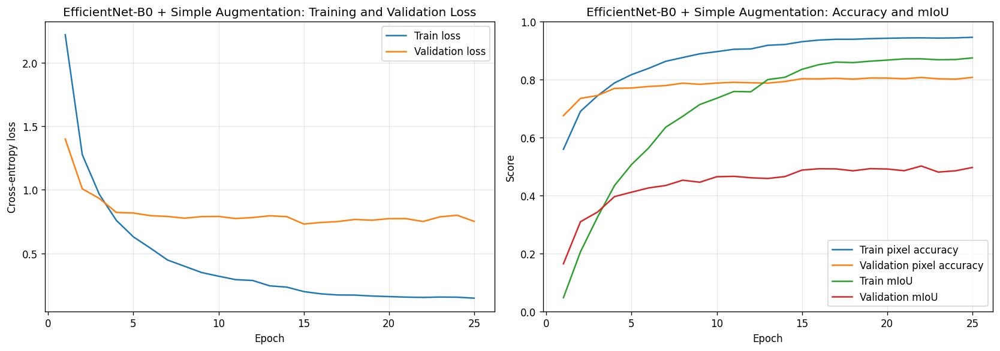

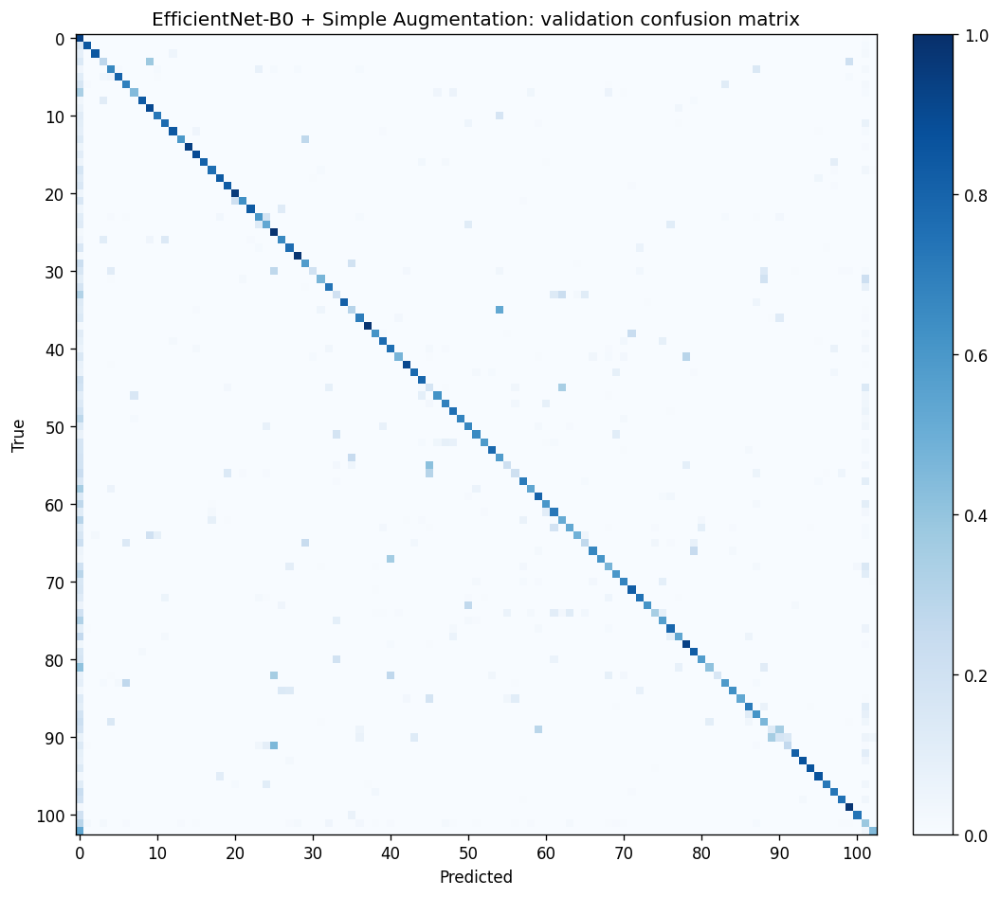

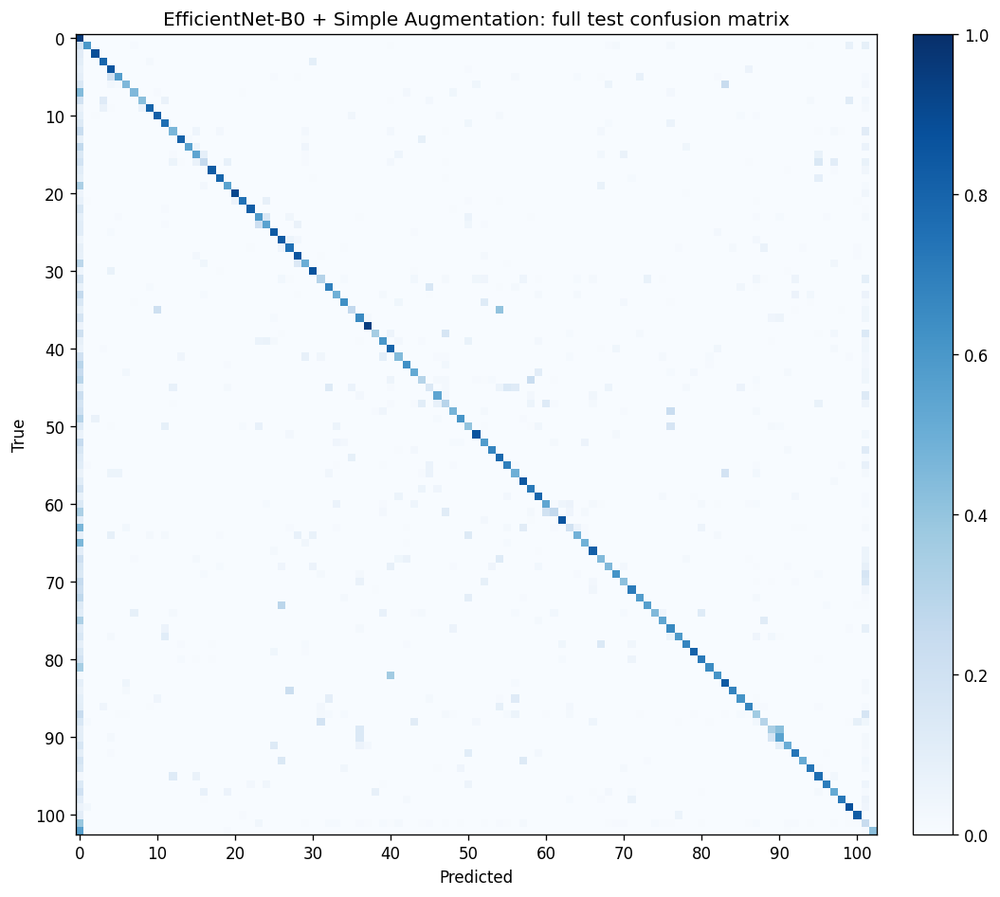

EfficientNet-B0 + Simple Augmentation best 10 classes:
 20 udon noodle                    IoU=0.8362 support=713089
 17 hamburger                      IoU=0.7872 support=1081756
  2 eels on rice                   IoU=0.7847 support=458314
 79 shrimp with chill source       IoU=0.7615 support=707674
 22 soba noodle                    IoU=0.7483 support=648752
 37 potage                         IoU=0.7431 support=470193
 18 pizza                          IoU=0.7392 support=957751
 51 sweet and sour pork            IoU=0.7381 support=459207
 30 gratin                         IoU=0.7341 support=829901
 13 croissant                      IoU=0.7230 support=635498

EfficientNet-B0 + Simple Augmentation worst 10 classes:
 45 fried fish                     IoU=0.0805 support=255284
 47 salmon meuniere                IoU=0.1397 support=143770
 63 ginger pork saute              IoU=0.1459 support=367129
101 others                         IoU=0.1591 support=3425089
 44 teriyaki grilled fish       

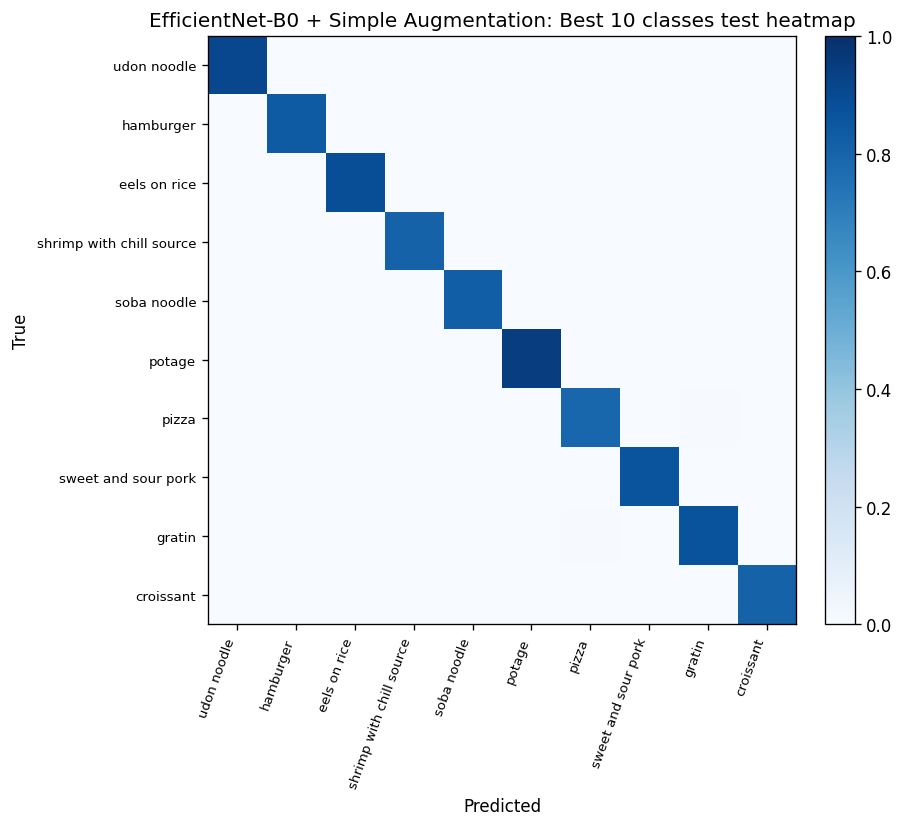

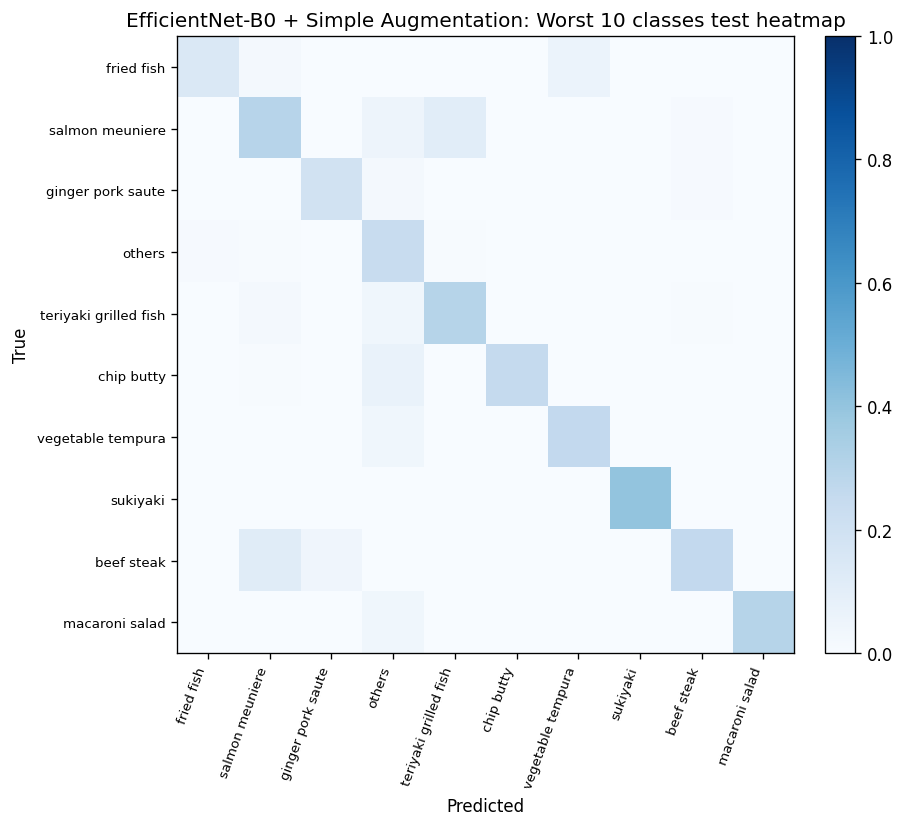

Best epoch: 22
Best validation mIoU: 0.5014556043086835
Test result: {'test_loss': 0.8992123055458069, 'test_accuracy': 0.7974139322916667, 'test_miou': 0.4771982117487322}


In [16]:
class EfficientNetAugmentedBaseline(EfficientNetBaseline):
    pass


EFFICIENTNET_AUG_CONFIG = {
    "learning_rate": 3e-4,
    "weight_decay": 1e-4,
    "dropout": 0.2,
    "early_stopping_patience": 5,
    "scheduler_patience": 2,
    "lr_factor": 0.5,
    "pretrained": True,
    "max_epochs": MAX_EPOCHS,
}

aug_train_dataset = FoodSegmentationDataset(train_ids, "train", augment_mode="simple")
aug_train_loader = make_loader(aug_train_dataset, shuffle=True)

if RUN_TRAINING:
    seed_everything(SEED)
    model = EfficientNetAugmentedBaseline(
        pretrained=EFFICIENTNET_AUG_CONFIG["pretrained"],
        dropout=EFFICIENTNET_AUG_CONFIG["dropout"],
    )
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=EFFICIENTNET_AUG_CONFIG["learning_rate"],
        weight_decay=EFFICIENTNET_AUG_CONFIG["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=EFFICIENTNET_AUG_CONFIG["lr_factor"],
        patience=EFFICIENTNET_AUG_CONFIG["scheduler_patience"],
    )
    efficientnet_augmented_result = train_model(
        "EfficientNet-B0 + Simple Augmentation",
        model,
        aug_train_loader,
        val_loader,
        test_loader,
        nn.CrossEntropyLoss(),
        optimizer,
        scheduler,
        EFFICIENTNET_AUG_CONFIG,
        "EfficientNetB0_Augmented_best_model.pt",
    )

## 21. ASPP-CBAM Model Components

ASPP extracts multi-scale context using parallel dilated convolutions. CBAM adds channel and spatial attention,
helping the model emphasise more useful features and image regions.

This cell defines the ASPP module, CBAM module, EfficientNet-ASPP-CBAM segmentation model, and a Dice + Cross-Entropy loss used for the optimisation experiments.

In [8]:
class ConvBNReLU(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1, dilation=1, dropout=0.0):
        super().__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=padding, dilation=dilation, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        ]
        if dropout > 0:
            layers.append(nn.Dropout2d(dropout))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)


class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels=256, rates=(1, 2, 4, 6), dropout=0.1):
        super().__init__()
        self.branches = nn.ModuleList([ConvBNReLU(in_channels, out_channels, kernel_size=1, padding=0)])
        for rate in rates:
            self.branches.append(ConvBNReLU(in_channels, out_channels, kernel_size=3, padding=rate, dilation=rate))
        self.global_pool = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            ConvBNReLU(in_channels, out_channels, kernel_size=1, padding=0),
        )
        self.project = ConvBNReLU(
            out_channels * (len(self.branches) + 1),
            out_channels,
            kernel_size=1,
            padding=0,
            dropout=dropout,
        )

    def forward(self, x):
        size = x.shape[-2:]
        features = [branch(x) for branch in self.branches]
        pooled = F.interpolate(self.global_pool(x), size=size, mode="bilinear", align_corners=False)
        features.append(pooled)
        return self.project(torch.cat(features, dim=1))


class ChannelAttention(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        hidden = max(channels // reduction, 8)
        self.mlp = nn.Sequential(
            nn.Conv2d(channels, hidden, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden, channels, kernel_size=1, bias=False),
        )

    def forward(self, x):
        avg = self.mlp(F.adaptive_avg_pool2d(x, 1))
        max_pool = self.mlp(F.adaptive_max_pool2d(x, 1))
        return x * torch.sigmoid(avg + max_pool)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=kernel_size // 2, bias=False)

    def forward(self, x):
        avg = torch.mean(x, dim=1, keepdim=True)
        max_pool, _ = torch.max(x, dim=1, keepdim=True)
        attention = torch.sigmoid(self.conv(torch.cat([avg, max_pool], dim=1)))
        return x * attention


class CBAM(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.channel_attention = ChannelAttention(channels, reduction=reduction)
        self.spatial_attention = SpatialAttention()

    def forward(self, x):
        return self.spatial_attention(self.channel_attention(x))


class EfficientNetASPPCBAM(nn.Module):
    def __init__(self, pretrained=True, dropout=0.18):
        super().__init__()
        weights = EfficientNet_B0_Weights.DEFAULT if pretrained else None
        self.encoder = efficientnet_b0(weights=weights).features
        self.low_index = 2
        self.aspp = ASPP(1280, 256, rates=(1, 2, 4, 6), dropout=dropout)
        self.cbam = CBAM(256)
        self.low_project = ConvBNReLU(24, 48, kernel_size=1, padding=0)
        self.head = nn.Sequential(
            ConvBNReLU(304, 192, dropout=dropout),
            ConvBNReLU(192, 128, dropout=dropout),
            nn.Conv2d(128, NUM_CLASSES, kernel_size=1),
        )

    def forward(self, x):
        output_size = x.shape[-2:]
        low_feature = None
        feature = x
        for index, block in enumerate(self.encoder):
            feature = block(feature)
            if index == self.low_index:
                low_feature = feature
        high_feature = self.cbam(self.aspp(feature))
        high_feature = F.interpolate(high_feature, size=low_feature.shape[-2:], mode="bilinear", align_corners=False)
        low_feature = self.low_project(low_feature)
        logits = self.head(torch.cat([high_feature, low_feature], dim=1))
        return F.interpolate(logits, size=output_size, mode="bilinear", align_corners=False)


class BalancedDiceCrossEntropyLoss(nn.Module):
    def __init__(self, class_weights=None, dice_weight=0.7, ignore_background_in_dice=True, label_smoothing=0.05):
        super().__init__()
        self.class_weights = class_weights
        self.dice_weight = dice_weight
        self.ignore_background_in_dice = ignore_background_in_dice
        self.label_smoothing = label_smoothing

    def forward(self, logits, targets):
        ce_loss = F.cross_entropy(
            logits,
            targets,
            weight=self.class_weights,
            label_smoothing=self.label_smoothing,
        )
        probs = torch.softmax(logits, dim=1)
        targets_one_hot = F.one_hot(targets, NUM_CLASSES).permute(0, 3, 1, 2).float()
        dims = (0, 2, 3)
        intersection = (probs * targets_one_hot).sum(dims)
        cardinality = probs.sum(dims) + targets_one_hot.sum(dims)
        dice = (2 * intersection + 1.0) / (cardinality + 1.0)
        if self.ignore_background_in_dice:
            dice = dice[1:]
        dice_loss = 1 - dice.mean()
        return ce_loss + self.dice_weight * dice_loss

## 22. EfficientNet-ASPP-CBAM

This cell trains the ASPP-CBAM model inspired by food segmentation literature.
It uses a smaller encoder learning rate and a larger head learning rate because the pretrained encoder should be updated more carefully.

Training EfficientNet-ASPP-CBAM
Config: {'encoder_learning_rate': 1e-05, 'head_learning_rate': 0.0003, 'weight_decay': 0.0003, 'dropout': 0.18, 'dice_weight': 0.8, 'label_smoothing': 0.05, 'early_stopping_patience': 8, 'scheduler_patience': 3, 'lr_factor': 0.5, 'freeze_encoder_epochs': 5, 'pretrained': True, 'max_epochs': 45}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/EfficientNet_ASPP_CBAM_best_model.pt


{'epoch': 1, 'train_loss': 4.757023316701253, 'val_loss': 4.186492778778076, 'train_accuracy': 0.5173081380208333, 'val_accuracy': 0.6070635091145833, 'train_miou': 0.026838521629965938, 'val_miou': 0.06800085959993186}
Saved new best model: val_mIoU=0.0680


{'epoch': 2, 'train_loss': 4.128582464853922, 'val_loss': 3.7740513439178467, 'train_accuracy': 0.6146977213541667, 'val_accuracy': 0.6440590494791667, 'train_miou': 0.06989875708256807, 'val_miou': 0.11200625243246987}
Saved new best model: val_mIoU=0.1120


{'epoch': 3, 'train_loss': 3.7526957372029623, 'val_loss': 3.4814285411834716, 'train_accuracy': 0.6461148600260417, 'val_accuracy': 0.6675734212239584, 'train_miou': 0.12475172439205068, 'val_miou': 0.16528888403173445}
Saved new best model: val_mIoU=0.1653


{'epoch': 4, 'train_loss': 3.4368502985636393, 'val_loss': 3.2420387058258058, 'train_accuracy': 0.6716069634331597, 'val_accuracy': 0.68411435546875, 'train_miou': 0.17518294653115218, 'val_miou': 0.22376318775590137}
Saved new best model: val_mIoU=0.2238


{'epoch': 5, 'train_loss': 3.220327595392863, 'val_loss': 3.1386041984558104, 'train_accuracy': 0.6932421847873264, 'val_accuracy': 0.7017912760416667, 'train_miou': 0.22756899979272116, 'val_miou': 0.25007953362706725}
Saved new best model: val_mIoU=0.2501


{'epoch': 6, 'train_loss': 3.0031395937601726, 'val_loss': 3.007256717681885, 'train_accuracy': 0.7224904541015625, 'val_accuracy': 0.7038408528645833, 'train_miou': 0.2907159928625025, 'val_miou': 0.28302296250577547}
Saved new best model: val_mIoU=0.2830


{'epoch': 7, 'train_loss': 2.82864821434021, 'val_loss': 2.937133771896362, 'train_accuracy': 0.7376011691623264, 'val_accuracy': 0.71235869140625, 'train_miou': 0.3362500732110181, 'val_miou': 0.2977055520629286}
Saved new best model: val_mIoU=0.2977


{'epoch': 8, 'train_loss': 2.679716012954712, 'val_loss': 2.854510160446167, 'train_accuracy': 0.7580638563368055, 'val_accuracy': 0.7244243489583333, 'train_miou': 0.38322395902576295, 'val_miou': 0.3271994793077869}
Saved new best model: val_mIoU=0.3272


{'epoch': 9, 'train_loss': 2.520521291097005, 'val_loss': 2.799983751296997, 'train_accuracy': 0.7773266059027778, 'val_accuracy': 0.7270876302083333, 'train_miou': 0.43906409378883354, 'val_miou': 0.34477129936087747}
Saved new best model: val_mIoU=0.3448


{'epoch': 10, 'train_loss': 2.399844994862874, 'val_loss': 2.812116376876831, 'train_accuracy': 0.7995508192274305, 'val_accuracy': 0.7283957682291666, 'train_miou': 0.4958011630984019, 'val_miou': 0.3560602674013538}
Saved new best model: val_mIoU=0.3561


{'epoch': 11, 'train_loss': 2.3227628752390546, 'val_loss': 2.7773390827178956, 'train_accuracy': 0.8127585503472222, 'val_accuracy': 0.7242900390625, 'train_miou': 0.5250685599039945, 'val_miou': 0.34708863714919563}


{'epoch': 12, 'train_loss': 2.25104191271464, 'val_loss': 2.7438052577972414, 'train_accuracy': 0.8217494032118056, 'val_accuracy': 0.7362864583333333, 'train_miou': 0.5557800112132779, 'val_miou': 0.37009739127947516}
Saved new best model: val_mIoU=0.3701


{'epoch': 13, 'train_loss': 2.1840188376108807, 'val_loss': 2.743729278564453, 'train_accuracy': 0.8318705186631944, 'val_accuracy': 0.74120234375, 'train_miou': 0.5850705532976727, 'val_miou': 0.380017446333194}
Saved new best model: val_mIoU=0.3800


{'epoch': 14, 'train_loss': 2.140233060836792, 'val_loss': 2.751745969772339, 'train_accuracy': 0.8393375678168403, 'val_accuracy': 0.7408665690104167, 'train_miou': 0.6050681211282728, 'val_miou': 0.3798566236678921}


{'epoch': 15, 'train_loss': 2.074801527659098, 'val_loss': 2.7670397243499756, 'train_accuracy': 0.8545368272569445, 'val_accuracy': 0.7369770182291666, 'train_miou': 0.6436991398635534, 'val_miou': 0.37343957833539243}


{'epoch': 16, 'train_loss': 2.0233799438476563, 'val_loss': 2.7622029342651366, 'train_accuracy': 0.8606561225043403, 'val_accuracy': 0.7381288899739583, 'train_miou': 0.6618836939499588, 'val_miou': 0.3831631245572115}
Saved new best model: val_mIoU=0.3832


{'epoch': 17, 'train_loss': 1.9869697964986166, 'val_loss': 2.7228521041870115, 'train_accuracy': 0.8688841118706597, 'val_accuracy': 0.7456676595052083, 'train_miou': 0.6843339901069636, 'val_miou': 0.3915933226024995}
Saved new best model: val_mIoU=0.3916


{'epoch': 18, 'train_loss': 1.956034678141276, 'val_loss': 2.717171115875244, 'train_accuracy': 0.8730290283203125, 'val_accuracy': 0.7498707682291667, 'train_miou': 0.6995293702730105, 'val_miou': 0.39475203505369033}
Saved new best model: val_mIoU=0.3948


{'epoch': 19, 'train_loss': 1.9447410068511963, 'val_loss': 2.7540450534820557, 'train_accuracy': 0.8779757568359375, 'val_accuracy': 0.7422695475260417, 'train_miou': 0.7083765721369683, 'val_miou': 0.3884971080890369}


{'epoch': 20, 'train_loss': 1.9128838132222494, 'val_loss': 2.7436767921447753, 'train_accuracy': 0.8840214572482639, 'val_accuracy': 0.747030712890625, 'train_miou': 0.7255459070279722, 'val_miou': 0.3925440912060288}


{'epoch': 21, 'train_loss': 1.8977076110839843, 'val_loss': 2.7503640270233154, 'train_accuracy': 0.8868218370225694, 'val_accuracy': 0.7504694010416667, 'train_miou': 0.7317097327105184, 'val_miou': 0.3970830296006068}
Saved new best model: val_mIoU=0.3971


{'epoch': 22, 'train_loss': 1.8780612862904866, 'val_loss': 2.719815507888794, 'train_accuracy': 0.891879638671875, 'val_accuracy': 0.7478453450520833, 'train_miou': 0.7461675730943359, 'val_miou': 0.3967690923355185}


{'epoch': 23, 'train_loss': 1.8432418842315674, 'val_loss': 2.7126356372833254, 'train_accuracy': 0.8967134195963542, 'val_accuracy': 0.7574090983072916, 'train_miou': 0.7609547331089589, 'val_miou': 0.4092381738025825}
Saved new best model: val_mIoU=0.4092


{'epoch': 24, 'train_loss': 1.838024258931478, 'val_loss': 2.7080821800231933, 'train_accuracy': 0.900921044921875, 'val_accuracy': 0.7578349446614583, 'train_miou': 0.7704796147369298, 'val_miou': 0.4048096709322544}


{'epoch': 25, 'train_loss': 1.8329235560099284, 'val_loss': 2.7036605529785156, 'train_accuracy': 0.8995292887369791, 'val_accuracy': 0.7603732096354167, 'train_miou': 0.7664502242610519, 'val_miou': 0.41124581910958813}
Saved new best model: val_mIoU=0.4112


{'epoch': 26, 'train_loss': 1.824323337872823, 'val_loss': 2.7145101528167723, 'train_accuracy': 0.9016571044921875, 'val_accuracy': 0.7596400065104166, 'train_miou': 0.7728285220706169, 'val_miou': 0.40969764427841676}


{'epoch': 27, 'train_loss': 1.789672524134318, 'val_loss': 2.6813993415832518, 'train_accuracy': 0.9091512722439236, 'val_accuracy': 0.7598792643229166, 'train_miou': 0.7949059720592185, 'val_miou': 0.41396035449537305}
Saved new best model: val_mIoU=0.4140


{'epoch': 28, 'train_loss': 1.7893693634668986, 'val_loss': 2.7029872970581055, 'train_accuracy': 0.909994873046875, 'val_accuracy': 0.761006884765625, 'train_miou': 0.7922852208713408, 'val_miou': 0.40639169228513433}


{'epoch': 29, 'train_loss': 1.784819278717041, 'val_loss': 2.6905963706970213, 'train_accuracy': 0.9109127495659722, 'val_accuracy': 0.7626119303385417, 'train_miou': 0.7953634610331527, 'val_miou': 0.4156269768156406}
Saved new best model: val_mIoU=0.4156


{'epoch': 30, 'train_loss': 1.7653395500183104, 'val_loss': 2.659357713699341, 'train_accuracy': 0.9143292778862847, 'val_accuracy': 0.76356162109375, 'train_miou': 0.807136635957778, 'val_miou': 0.4146521942718797}


{'epoch': 31, 'train_loss': 1.759413565635681, 'val_loss': 2.6495837268829345, 'train_accuracy': 0.9163101128472222, 'val_accuracy': 0.7673082194010417, 'train_miou': 0.8108858377435528, 'val_miou': 0.4308374602125405}
Saved new best model: val_mIoU=0.4308


{'epoch': 32, 'train_loss': 1.7612253977457681, 'val_loss': 2.663864803314209, 'train_accuracy': 0.9166158962673611, 'val_accuracy': 0.7645365071614584, 'train_miou': 0.8063853643742719, 'val_miou': 0.4124467338369908}


{'epoch': 33, 'train_loss': 1.7371793518066405, 'val_loss': 2.6470447120666503, 'train_accuracy': 0.919988671875, 'val_accuracy': 0.7664263346354167, 'train_miou': 0.819848192742782, 'val_miou': 0.4237194463308594}


{'epoch': 34, 'train_loss': 1.7392983487447102, 'val_loss': 2.668502395629883, 'train_accuracy': 0.9208163194444444, 'val_accuracy': 0.76488154296875, 'train_miou': 0.8200912400036203, 'val_miou': 0.4160730019690701}


{'epoch': 35, 'train_loss': 1.7279835796356202, 'val_loss': 2.6904490127563476, 'train_accuracy': 0.9230634901258681, 'val_accuracy': 0.7597876302083333, 'train_miou': 0.826483099352082, 'val_miou': 0.4168905242523896}


{'epoch': 36, 'train_loss': 1.7048986949920655, 'val_loss': 2.6166034622192385, 'train_accuracy': 0.9274909261067709, 'val_accuracy': 0.77551630859375, 'train_miou': 0.8379018469167157, 'val_miou': 0.43771621649436687}
Saved new best model: val_mIoU=0.4377


{'epoch': 37, 'train_loss': 1.688674836476644, 'val_loss': 2.625182075500488, 'train_accuracy': 0.9313940999348959, 'val_accuracy': 0.770636767578125, 'train_miou': 0.8492449294075682, 'val_miou': 0.43437848171716553}


{'epoch': 38, 'train_loss': 1.6928383700052898, 'val_loss': 2.6197833595275877, 'train_accuracy': 0.9307704671223959, 'val_accuracy': 0.7715927897135416, 'train_miou': 0.8457518453399423, 'val_miou': 0.43198332561199987}


{'epoch': 39, 'train_loss': 1.6740187403361002, 'val_loss': 2.639647548675537, 'train_accuracy': 0.9353144694010417, 'val_accuracy': 0.7706486165364583, 'train_miou': 0.8572352584067592, 'val_miou': 0.4313307105961535}


{'epoch': 40, 'train_loss': 1.6741397959391275, 'val_loss': 2.6216574878692627, 'train_accuracy': 0.9343928249782986, 'val_accuracy': 0.771090283203125, 'train_miou': 0.856479295752365, 'val_miou': 0.4316163205173711}


{'epoch': 41, 'train_loss': 1.6649151134490967, 'val_loss': 2.6240252418518066, 'train_accuracy': 0.9370024793836805, 'val_accuracy': 0.7754046875, 'train_miou': 0.86131978631581, 'val_miou': 0.43661119978973173}


{'epoch': 42, 'train_loss': 1.6581423880259196, 'val_loss': 2.611937892913818, 'train_accuracy': 0.9391938639322917, 'val_accuracy': 0.774766552734375, 'train_miou': 0.8663342456574517, 'val_miou': 0.4360924025947392}


{'epoch': 43, 'train_loss': 1.6487028331756592, 'val_loss': 2.5977194747924806, 'train_accuracy': 0.9388873725043403, 'val_accuracy': 0.7776623697916667, 'train_miou': 0.865782380851687, 'val_miou': 0.4451688824244081}
Saved new best model: val_mIoU=0.4452


{'epoch': 44, 'train_loss': 1.6466504847208658, 'val_loss': 2.593867946624756, 'train_accuracy': 0.9407329291449653, 'val_accuracy': 0.7775273111979166, 'train_miou': 0.8707721396572736, 'val_miou': 0.437770790879255}


{'epoch': 45, 'train_loss': 1.6523597888946533, 'val_loss': 2.6115103549957275, 'train_accuracy': 0.9393967963324653, 'val_accuracy': 0.7769944986979167, 'train_miou': 0.8666167856692942, 'val_miou': 0.44012080271072856}
Training finished in 123.8 minutes


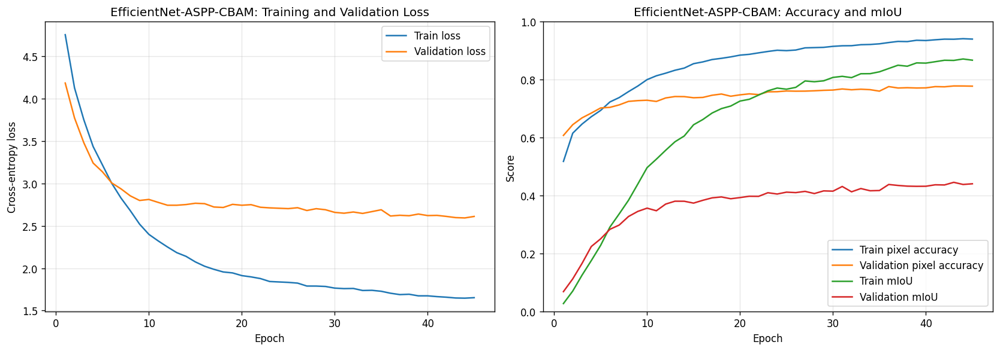

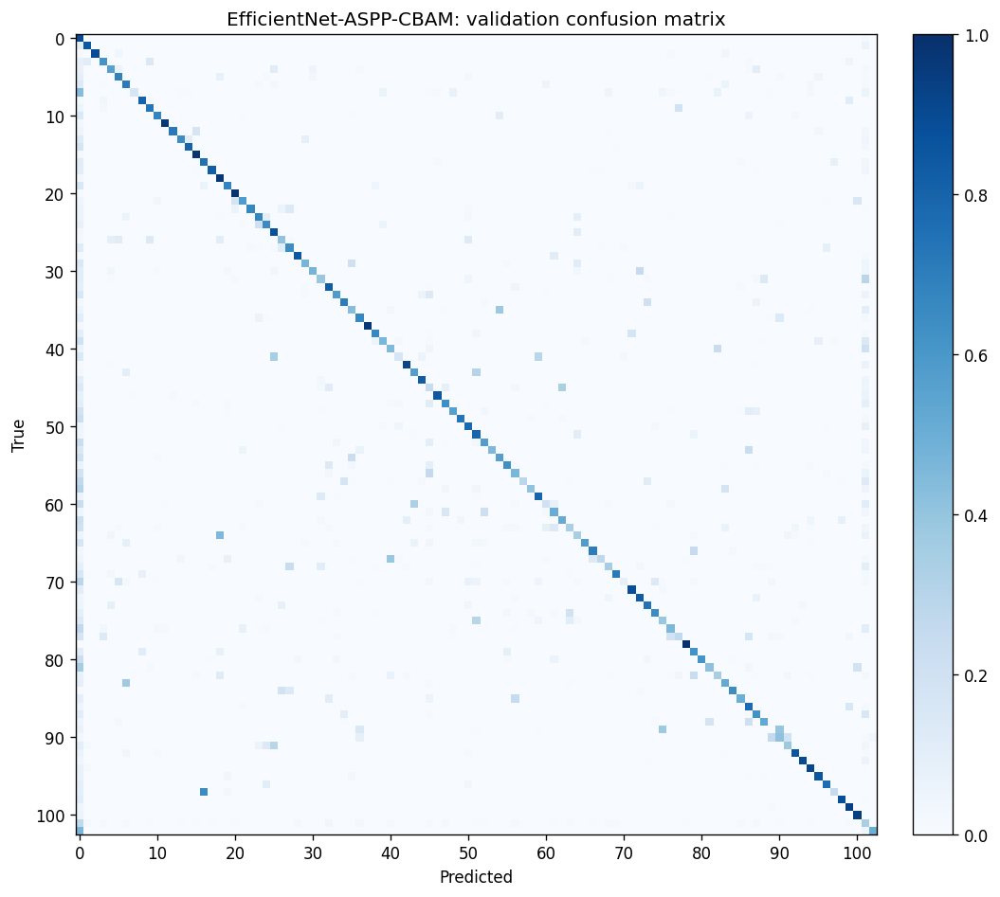

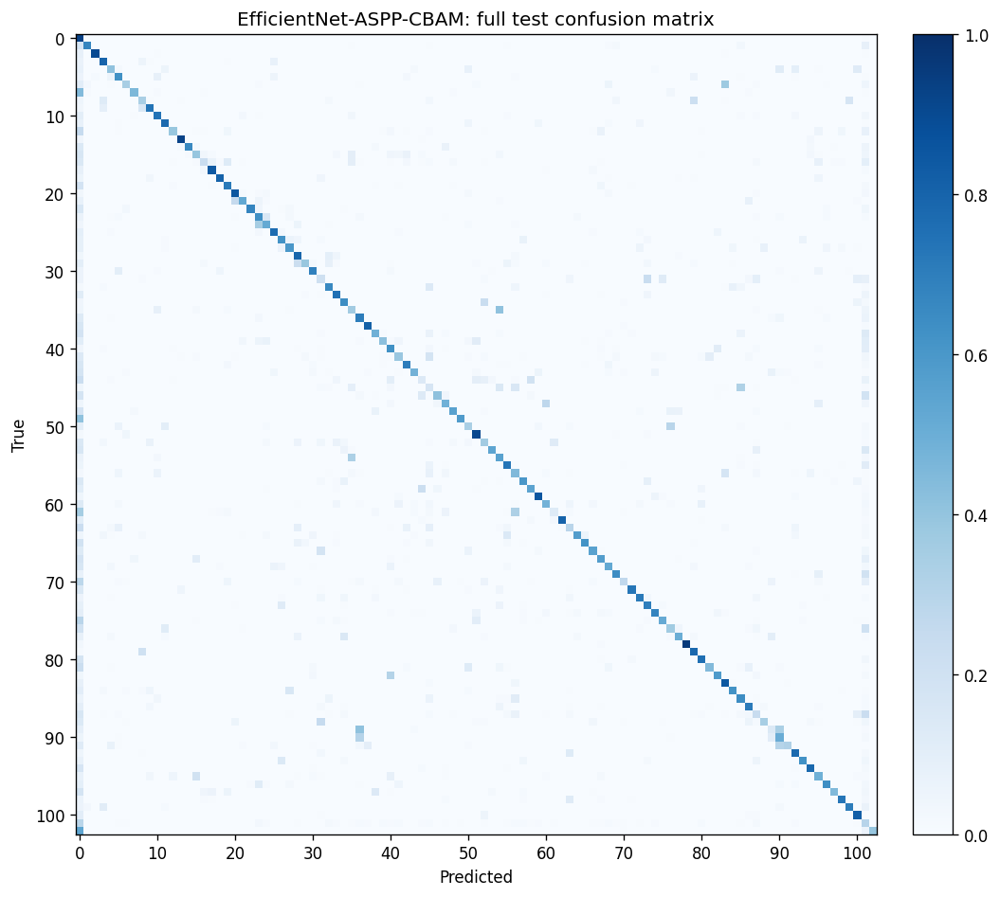

EfficientNet-ASPP-CBAM best 10 classes:
 78 fish-shaped pancake with bean jam IoU=0.8308 support=366508
  2 eels on rice                   IoU=0.8186 support=458314
 13 croissant                      IoU=0.7599 support=635498
 62 dried fish                     IoU=0.7190 support=358412
 18 pizza                          IoU=0.7126 support=957751
 17 hamburger                      IoU=0.6972 support=1081756
 59 seasoned beef with potatoes    IoU=0.6447 support=492772
 71 egg roll                       IoU=0.6389 support=327967
 20 udon noodle                    IoU=0.6376 support=713089
 79 shrimp with chill source       IoU=0.6297 support=707674

EfficientNet-ASPP-CBAM worst 10 classes:
 45 fried fish                     IoU=0.0574 support=255284
 44 teriyaki grilled fish          IoU=0.0670 support=171224
 89 Japanese tofu and vegetable chowder IoU=0.0908 support=343075
 61 beef steak                     IoU=0.0913 support=266150
 31 sauteed vegetables             IoU=0.1311 support=5

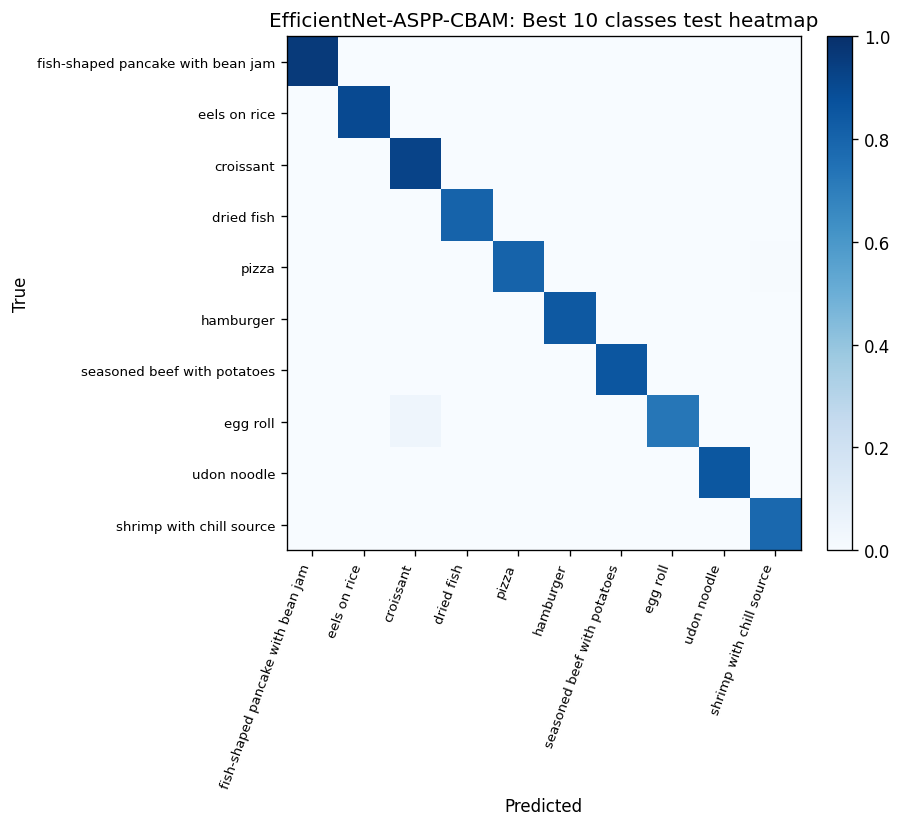

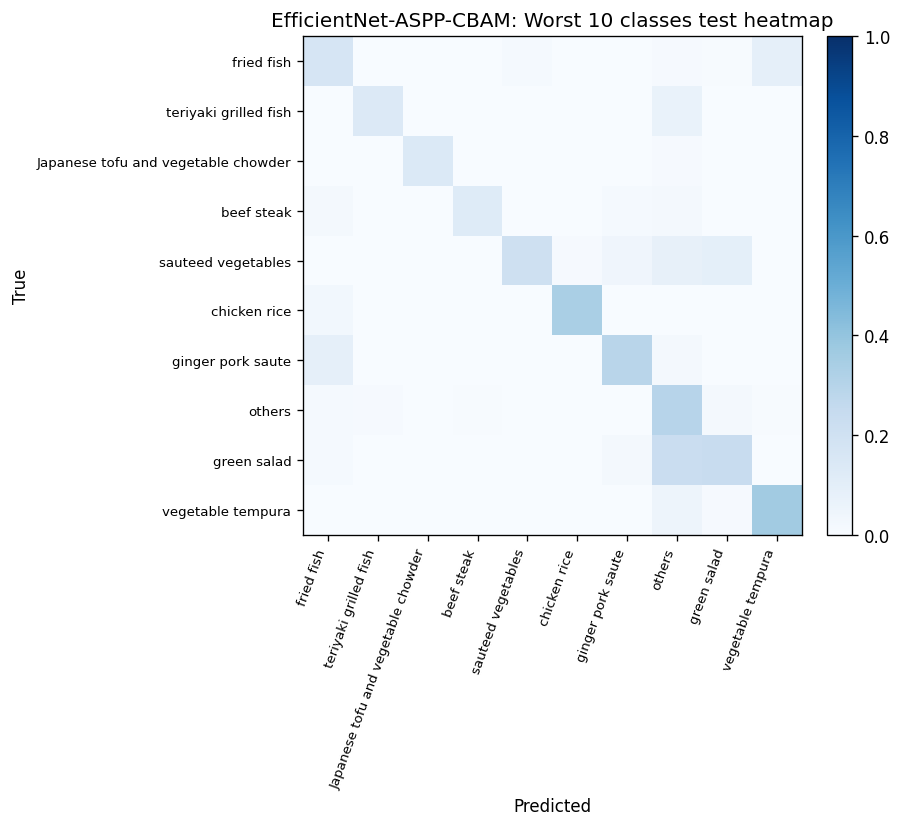

Best epoch: 43
Best validation mIoU: 0.4451688824244081
Test result: {'test_loss': 2.71434423828125, 'test_accuracy': 0.7721661376953125, 'test_miou': 0.4234168590850416}


In [12]:
aug_train_dataset = FoodSegmentationDataset(train_ids, "train", augment_mode="simple")
aug_train_loader = make_loader(aug_train_dataset, shuffle=True)

def build_pixel_class_weights(pixel_counts, min_weight=0.25, max_weight=2.50):
    counts = np.maximum(pixel_counts.astype(np.float64), 1.0)
    freq = counts / counts.sum()
    weights = 1.0 / np.sqrt(freq)
    weights = weights / weights[1:].mean()
    weights = np.clip(weights, min_weight, max_weight)
    weights[0] = min(weights[0], 0.25)
    return torch.tensor(weights, dtype=torch.float32)


ASPP_CBAM_CONFIG = {
    "encoder_learning_rate": 1e-5,
    "head_learning_rate": 3e-4,
    "weight_decay": 3e-4,
    "dropout": 0.18,
    "dice_weight": 0.8,
    "label_smoothing": 0.05,
    "early_stopping_patience": 8,
    "scheduler_patience": 3,
    "lr_factor": 0.5,
    "freeze_encoder_epochs": 5,
    "pretrained": True,
    "max_epochs": 45,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = EfficientNetASPPCBAM(pretrained=ASPP_CBAM_CONFIG["pretrained"], dropout=ASPP_CBAM_CONFIG["dropout"])
    head_parameters = [
        parameter
        for name, parameter in model.named_parameters()
        if not name.startswith("encoder.")
    ]
    optimizer = torch.optim.AdamW(
        [
            {"params": model.encoder.parameters(), "lr": ASPP_CBAM_CONFIG["encoder_learning_rate"]},
            {"params": head_parameters, "lr": ASPP_CBAM_CONFIG["head_learning_rate"]},
        ],
        weight_decay=ASPP_CBAM_CONFIG["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=ASPP_CBAM_CONFIG["lr_factor"],
        patience=ASPP_CBAM_CONFIG["scheduler_patience"],
    )
    criterion = BalancedDiceCrossEntropyLoss(
        class_weights=build_pixel_class_weights(train_pixel_counts).to(get_device()),
        dice_weight=ASPP_CBAM_CONFIG["dice_weight"],
        ignore_background_in_dice=True,
        label_smoothing=ASPP_CBAM_CONFIG["label_smoothing"],
    )
    aspp_cbam_result = train_model(
        "EfficientNet-ASPP-CBAM",
        model,
        aug_train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer,
        scheduler,
        ASPP_CBAM_CONFIG,
        "EfficientNet_ASPP_CBAM_best_model.pt",
    )

## 23. Rebalanced ASPP-CBAM

The rebalanced version keeps the ASPP-CBAM architecture but changes the training data sampling strategy.
Images containing rare classes are sampled more often, and foreground-aware crops make the model see more useful food pixels.

This cell builds capped class weights and a weighted sampler for the rebalanced training experiment.

In [13]:
def build_sample_weights(image_ids, image_labels, class_image_counts):
    class_counts = np.maximum(class_image_counts.astype(np.float64), 1.0)
    target_count = np.median(class_counts[1:])
    class_sampling_weights = np.sqrt(target_count / class_counts)
    class_sampling_weights = np.clip(class_sampling_weights, 0.35, 2.50)
    class_sampling_weights[0] = 0.0
    if len(class_sampling_weights) > 101:
        class_sampling_weights[101] = min(class_sampling_weights[101], 0.55)
    if len(class_sampling_weights) > 102:
        class_sampling_weights[102] = min(class_sampling_weights[102], 0.70)

    sample_weights = []
    for image_id in image_ids:
        labels = [label for label in image_labels[image_id] if label != 0]
        weight = max(class_sampling_weights[labels]) if labels else 0.35
        sample_weights.append(float(np.clip(weight, 0.35, 2.50)))
    return torch.tensor(sample_weights, dtype=torch.double), class_sampling_weights


TRAIN_SAMPLE_WEIGHTS, CLASS_SAMPLING_WEIGHTS = build_sample_weights(
    train_ids,
    train_image_labels,
    train_image_counts,
)
print("Sample weight min / median / mean / max:",
      float(TRAIN_SAMPLE_WEIGHTS.min()),
      float(TRAIN_SAMPLE_WEIGHTS.median()),
      float(TRAIN_SAMPLE_WEIGHTS.mean()),
      float(TRAIN_SAMPLE_WEIGHTS.max()))

rebalanced_train_dataset = FoodSegmentationDataset(
    train_ids,
    "train",
    augment_mode="rebalanced",
    class_sampling_weights=CLASS_SAMPLING_WEIGHTS,
)
rebalanced_sampler = WeightedRandomSampler(
    weights=TRAIN_SAMPLE_WEIGHTS,
    num_samples=len(rebalanced_train_dataset),
    replacement=True,
)
rebalanced_train_loader = make_loader(rebalanced_train_dataset, sampler=rebalanced_sampler)

Sample weight min / median / mean / max: 0.35 0.982607368881035 0.9269958116354563 1.247219128924647


## 24. Train Rebalanced ASPP-CBAM

This cell trains the rebalanced ASPP-CBAM model and saves its best checkpoint.
It is useful for analysing whether class balancing improves generalisation.

Training EfficientNet-ASPP-CBAM Rebalanced
Config: {'encoder_learning_rate': 1e-05, 'head_learning_rate': 0.00025, 'weight_decay': 0.0005, 'dropout': 0.2, 'dice_weight': 0.7, 'label_smoothing': 0.05, 'early_stopping_patience': 8, 'scheduler_patience': 3, 'lr_factor': 0.5, 'freeze_encoder_epochs': 5, 'pretrained': True, 'max_epochs': 45}
Best checkpoint target: /content/drive/MyDrive/COMP9444/9444/Best_Model/EfficientNet_ASPP_CBAM_Rebalanced_best_model.pt


{'epoch': 1, 'train_loss': 4.69771225865682, 'val_loss': 4.164926235198974, 'train_accuracy': 0.4810714084201389, 'val_accuracy': 0.588231640625, 'train_miou': 0.030771008471186415, 'val_miou': 0.06385258817357975}
Saved new best model: val_mIoU=0.0639


{'epoch': 2, 'train_loss': 4.048423155466716, 'val_loss': 3.7500094165802, 'train_accuracy': 0.5861413330078125, 'val_accuracy': 0.6347942545572917, 'train_miou': 0.08040785463088997, 'val_miou': 0.12432311752442884}
Saved new best model: val_mIoU=0.1243


{'epoch': 3, 'train_loss': 3.720060963948568, 'val_loss': 3.455347810745239, 'train_accuracy': 0.6117461154513889, 'val_accuracy': 0.658999267578125, 'train_miou': 0.12366762064542454, 'val_miou': 0.16845762849582177}
Saved new best model: val_mIoU=0.1685


{'epoch': 4, 'train_loss': 3.4044737968444823, 'val_loss': 3.249267593383789, 'train_accuracy': 0.6512473036024305, 'val_accuracy': 0.67363134765625, 'train_miou': 0.1967870592819845, 'val_miou': 0.20452747175290104}
Saved new best model: val_mIoU=0.2045


{'epoch': 5, 'train_loss': 3.197172821680705, 'val_loss': 3.0963066101074217, 'train_accuracy': 0.6709080512152777, 'val_accuracy': 0.690163916015625, 'train_miou': 0.23424650126962168, 'val_miou': 0.25484158776504134}
Saved new best model: val_mIoU=0.2548


{'epoch': 6, 'train_loss': 2.9836282145182293, 'val_loss': 2.9737267360687256, 'train_accuracy': 0.6978010823567709, 'val_accuracy': 0.7034313802083333, 'train_miou': 0.2825076729748285, 'val_miou': 0.2771082363704455}
Saved new best model: val_mIoU=0.2771


{'epoch': 7, 'train_loss': 2.7894716943105062, 'val_loss': 2.8992562885284423, 'train_accuracy': 0.7174585177951389, 'val_accuracy': 0.7111488118489583, 'train_miou': 0.3309192493528841, 'val_miou': 0.29311661725203203}
Saved new best model: val_mIoU=0.2931


{'epoch': 8, 'train_loss': 2.6499516633351643, 'val_loss': 2.796133949279785, 'train_accuracy': 0.7389610948350694, 'val_accuracy': 0.7154185872395833, 'train_miou': 0.39031507042477653, 'val_miou': 0.31623294745326486}
Saved new best model: val_mIoU=0.3162


{'epoch': 9, 'train_loss': 2.5202233912150067, 'val_loss': 2.7454188652038574, 'train_accuracy': 0.7550382351345486, 'val_accuracy': 0.7122135579427084, 'train_miou': 0.41953157100912797, 'val_miou': 0.32458185519396826}
Saved new best model: val_mIoU=0.3246


{'epoch': 10, 'train_loss': 2.4087287972768148, 'val_loss': 2.7096645812988283, 'train_accuracy': 0.7719426459418403, 'val_accuracy': 0.7270198567708334, 'train_miou': 0.46315037623383937, 'val_miou': 0.3505831422085156}
Saved new best model: val_mIoU=0.3506


{'epoch': 11, 'train_loss': 2.291027596155802, 'val_loss': 2.678035655975342, 'train_accuracy': 0.7886940646701389, 'val_accuracy': 0.7351468424479166, 'train_miou': 0.4987493348727054, 'val_miou': 0.3638646898508113}
Saved new best model: val_mIoU=0.3639


{'epoch': 12, 'train_loss': 2.2097354520161945, 'val_loss': 2.6483623085021972, 'train_accuracy': 0.7989340901692709, 'val_accuracy': 0.7355622395833333, 'train_miou': 0.525867528916156, 'val_miou': 0.3787590580231281}
Saved new best model: val_mIoU=0.3788


{'epoch': 13, 'train_loss': 2.150130516052246, 'val_loss': 2.6009563369750976, 'train_accuracy': 0.8103384711371527, 'val_accuracy': 0.744341064453125, 'train_miou': 0.5611933121863714, 'val_miou': 0.38839194391221527}
Saved new best model: val_mIoU=0.3884


{'epoch': 14, 'train_loss': 2.092083459218343, 'val_loss': 2.622962100982666, 'train_accuracy': 0.818169105360243, 'val_accuracy': 0.7413358235677083, 'train_miou': 0.5778548525013042, 'val_miou': 0.38136076239537436}


{'epoch': 15, 'train_loss': 2.027842020670573, 'val_loss': 2.599742645263672, 'train_accuracy': 0.8309094265407986, 'val_accuracy': 0.746302685546875, 'train_miou': 0.6092464713130756, 'val_miou': 0.38519263279437443}


{'epoch': 16, 'train_loss': 1.984126662572225, 'val_loss': 2.6222095317840575, 'train_accuracy': 0.8326735324435763, 'val_accuracy': 0.7348894856770833, 'train_miou': 0.6178940500049968, 'val_miou': 0.3716896825603559}


{'epoch': 17, 'train_loss': 1.9522127126057942, 'val_loss': 2.579675765991211, 'train_accuracy': 0.843171435546875, 'val_accuracy': 0.7496944010416666, 'train_miou': 0.6446157642207487, 'val_miou': 0.40159798214896597}
Saved new best model: val_mIoU=0.4016


{'epoch': 18, 'train_loss': 1.9596823584238687, 'val_loss': 2.5901967964172363, 'train_accuracy': 0.8384742892795138, 'val_accuracy': 0.7518039225260417, 'train_miou': 0.6353183298796098, 'val_miou': 0.3952442995597635}


{'epoch': 19, 'train_loss': 1.8998414452870687, 'val_loss': 2.56596787071228, 'train_accuracy': 0.8518741292317709, 'val_accuracy': 0.7489652180989583, 'train_miou': 0.6683103097855158, 'val_miou': 0.4044371248805345}
Saved new best model: val_mIoU=0.4044


{'epoch': 20, 'train_loss': 1.8767125762303671, 'val_loss': 2.5505660705566404, 'train_accuracy': 0.8578404052734375, 'val_accuracy': 0.753548974609375, 'train_miou': 0.6801093009523947, 'val_miou': 0.4108611258442229}
Saved new best model: val_mIoU=0.4109


{'epoch': 21, 'train_loss': 1.861001322746277, 'val_loss': 2.5550065231323242, 'train_accuracy': 0.8611283854166667, 'val_accuracy': 0.7551521809895834, 'train_miou': 0.6876009960101575, 'val_miou': 0.41852830427684956}
Saved new best model: val_mIoU=0.4185


{'epoch': 22, 'train_loss': 1.8160902976989746, 'val_loss': 2.5685772857666014, 'train_accuracy': 0.8687024631076389, 'val_accuracy': 0.7580215657552083, 'train_miou': 0.7054292416801426, 'val_miou': 0.42297025073625966}
Saved new best model: val_mIoU=0.4230


{'epoch': 23, 'train_loss': 1.7904635232289632, 'val_loss': 2.5461900310516357, 'train_accuracy': 0.873139124891493, 'val_accuracy': 0.7626012858072917, 'train_miou': 0.7183507503100991, 'val_miou': 0.4209917159357043}


{'epoch': 24, 'train_loss': 1.825399631500244, 'val_loss': 2.5551348152160647, 'train_accuracy': 0.8670731065538194, 'val_accuracy': 0.7506719401041667, 'train_miou': 0.7043317773259355, 'val_miou': 0.40655427102076763}


{'epoch': 25, 'train_loss': 1.766778813680013, 'val_loss': 2.563278709411621, 'train_accuracy': 0.8791194715711805, 'val_accuracy': 0.7582782877604166, 'train_miou': 0.7354324655126624, 'val_miou': 0.418621019901299}


{'epoch': 26, 'train_loss': 1.7643260275522867, 'val_loss': 2.57072526550293, 'train_accuracy': 0.8789147759331597, 'val_accuracy': 0.7589088216145833, 'train_miou': 0.7371032582691155, 'val_miou': 0.42405882137875217}
Saved new best model: val_mIoU=0.4241


{'epoch': 27, 'train_loss': 1.7323410568237305, 'val_loss': 2.575989284515381, 'train_accuracy': 0.8829273410373264, 'val_accuracy': 0.7607681315104167, 'train_miou': 0.7487565884130531, 'val_miou': 0.42926831471450105}
Saved new best model: val_mIoU=0.4293


{'epoch': 28, 'train_loss': 1.7299398142496745, 'val_loss': 2.559342071533203, 'train_accuracy': 0.8837285970052083, 'val_accuracy': 0.7546492024739583, 'train_miou': 0.7512713165717653, 'val_miou': 0.41728212456307234}


{'epoch': 29, 'train_loss': 1.723756347020467, 'val_loss': 2.522290374755859, 'train_accuracy': 0.889158216688368, 'val_accuracy': 0.7628019856770833, 'train_miou': 0.7601901159690555, 'val_miou': 0.4255700358012174}


{'epoch': 30, 'train_loss': 1.7026946640014649, 'val_loss': 2.5541703033447267, 'train_accuracy': 0.893186363389757, 'val_accuracy': 0.7568979166666666, 'train_miou': 0.7697908754311201, 'val_miou': 0.41611697149841936}


{'epoch': 31, 'train_loss': 1.7162387994130452, 'val_loss': 2.550837200164795, 'train_accuracy': 0.8914237847222222, 'val_accuracy': 0.7678123697916667, 'train_miou': 0.764695022674059, 'val_miou': 0.4347591112852198}
Saved new best model: val_mIoU=0.4348


{'epoch': 32, 'train_loss': 1.6977116610209146, 'val_loss': 2.5426904945373536, 'train_accuracy': 0.8950163465711806, 'val_accuracy': 0.761552783203125, 'train_miou': 0.7730314630496086, 'val_miou': 0.42549171345708037}


{'epoch': 33, 'train_loss': 1.7041305357615153, 'val_loss': 2.553443130493164, 'train_accuracy': 0.8931363986545139, 'val_accuracy': 0.7635443684895833, 'train_miou': 0.7690993856451082, 'val_miou': 0.4162215996240101}


{'epoch': 34, 'train_loss': 1.6792986056009929, 'val_loss': 2.5556349906921385, 'train_accuracy': 0.8977787326388889, 'val_accuracy': 0.7650028645833333, 'train_miou': 0.779704361643684, 'val_miou': 0.422939651375469}


{'epoch': 35, 'train_loss': 1.653394224802653, 'val_loss': 2.5516123695373536, 'train_accuracy': 0.9037011149088542, 'val_accuracy': 0.7640971354166667, 'train_miou': 0.7983750339704296, 'val_miou': 0.42416126946223015}


{'epoch': 36, 'train_loss': 1.6414256381988526, 'val_loss': 2.4822227897644042, 'train_accuracy': 0.906941343858507, 'val_accuracy': 0.77328671875, 'train_miou': 0.8062524763136985, 'val_miou': 0.44219731317343586}
Saved new best model: val_mIoU=0.4422


{'epoch': 37, 'train_loss': 1.6223064517974854, 'val_loss': 2.507640001296997, 'train_accuracy': 0.9121740885416667, 'val_accuracy': 0.7692744466145833, 'train_miou': 0.8148070029049326, 'val_miou': 0.43564339872157426}


{'epoch': 38, 'train_loss': 1.621251147588094, 'val_loss': 2.5143723640441893, 'train_accuracy': 0.9145242377387153, 'val_accuracy': 0.768112109375, 'train_miou': 0.8222626502771612, 'val_miou': 0.43156980879288376}


{'epoch': 39, 'train_loss': 1.6114894161224365, 'val_loss': 2.4841961212158203, 'train_accuracy': 0.9135995768229167, 'val_accuracy': 0.77122978515625, 'train_miou': 0.8196852177051503, 'val_miou': 0.43432058462755807}


{'epoch': 40, 'train_loss': 1.6145672353108724, 'val_loss': 2.4662174110412596, 'train_accuracy': 0.9151666124131944, 'val_accuracy': 0.7783638346354167, 'train_miou': 0.8227523642064286, 'val_miou': 0.4475571207272108}
Saved new best model: val_mIoU=0.4476


{'epoch': 41, 'train_loss': 1.5959758389790852, 'val_loss': 2.480093385696411, 'train_accuracy': 0.9165640462239584, 'val_accuracy': 0.7762498046875, 'train_miou': 0.8287994868861107, 'val_miou': 0.45067460316205565}
Saved new best model: val_mIoU=0.4507


{'epoch': 42, 'train_loss': 1.5903214098612468, 'val_loss': 2.465328001022339, 'train_accuracy': 0.9176329671223958, 'val_accuracy': 0.77817236328125, 'train_miou': 0.8310002576929899, 'val_miou': 0.453779810847747}
Saved new best model: val_mIoU=0.4538


{'epoch': 43, 'train_loss': 1.5923642501831055, 'val_loss': 2.492660484313965, 'train_accuracy': 0.918566615125868, 'val_accuracy': 0.77978828125, 'train_miou': 0.8333351011597732, 'val_miou': 0.44925955403762263}


{'epoch': 44, 'train_loss': 1.5888015486399332, 'val_loss': 2.464750072479248, 'train_accuracy': 0.9191330593532986, 'val_accuracy': 0.7813921061197917, 'train_miou': 0.834119995098762, 'val_miou': 0.4513163090587588}


{'epoch': 45, 'train_loss': 1.5711633669535319, 'val_loss': 2.4717391414642336, 'train_accuracy': 0.9233510308159723, 'val_accuracy': 0.7788323079427083, 'train_miou': 0.8423506290963924, 'val_miou': 0.4519372679789793}
Training finished in 77.4 minutes


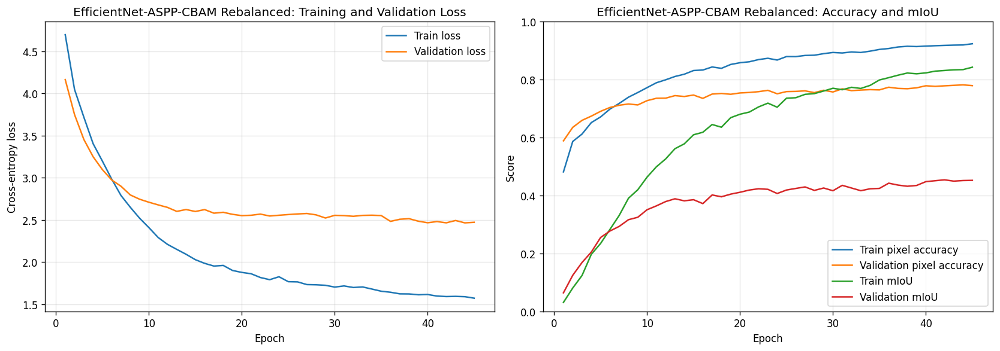

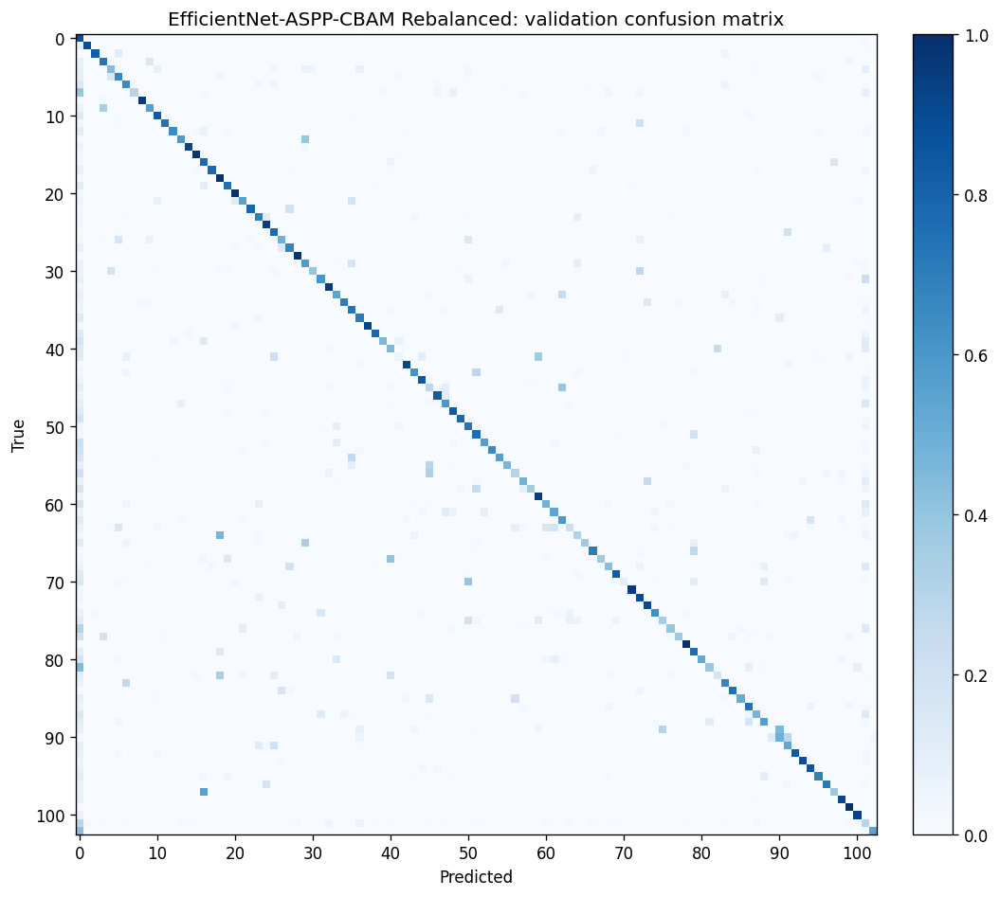

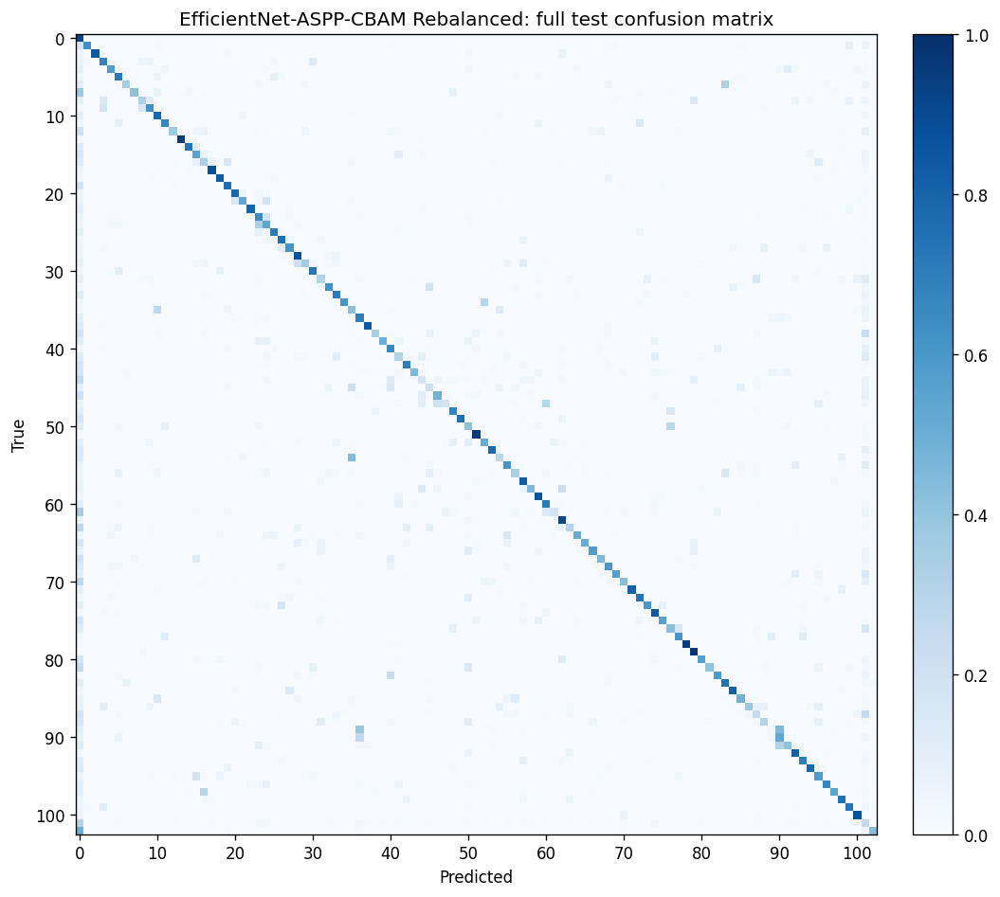

EfficientNet-ASPP-CBAM Rebalanced best 10 classes:
 13 croissant                      IoU=0.8595 support=635498
 79 shrimp with chill source       IoU=0.7730 support=707674
 78 fish-shaped pancake with bean jam IoU=0.7637 support=366508
 71 egg roll                       IoU=0.7628 support=327967
 51 sweet and sour pork            IoU=0.7460 support=459207
  2 eels on rice                   IoU=0.7240 support=458314
 18 pizza                          IoU=0.6769 support=957751
 22 soba noodle                    IoU=0.6758 support=648752
 17 hamburger                      IoU=0.6711 support=1081756
 84 spaghetti meat sauce           IoU=0.6525 support=426035

EfficientNet-ASPP-CBAM Rebalanced worst 10 classes:
 89 Japanese tofu and vegetable chowder IoU=0.0227 support=343075
 44 teriyaki grilled fish          IoU=0.0881 support=171224
 45 fried fish                     IoU=0.0973 support=255284
 47 salmon meuniere                IoU=0.1347 support=143770
 61 beef steak                   

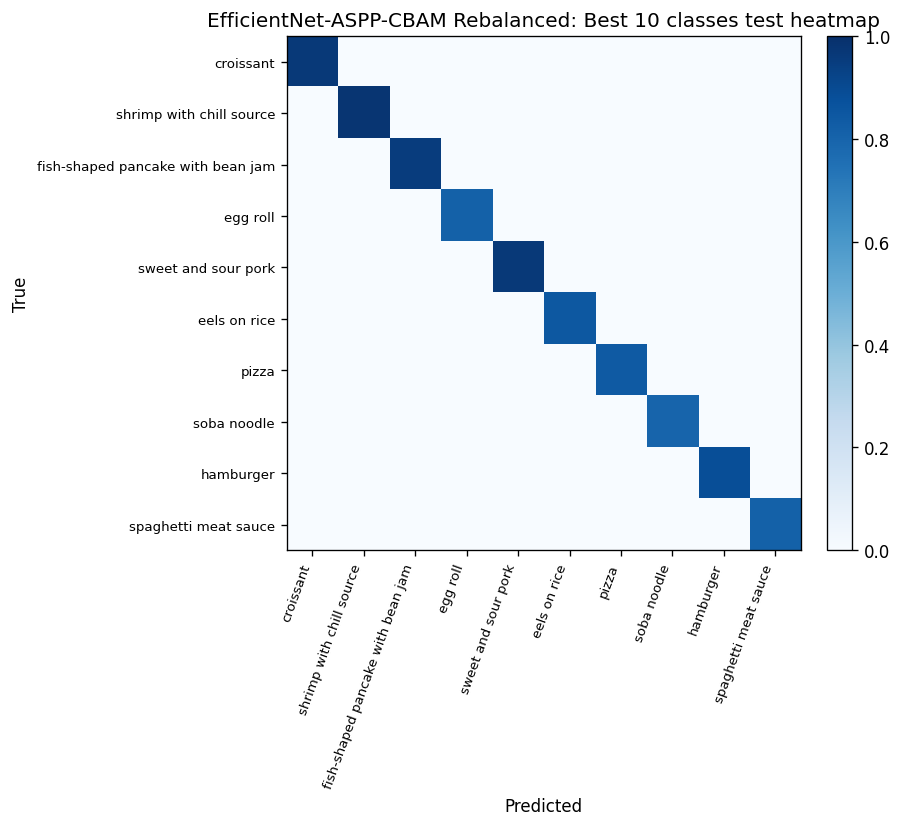

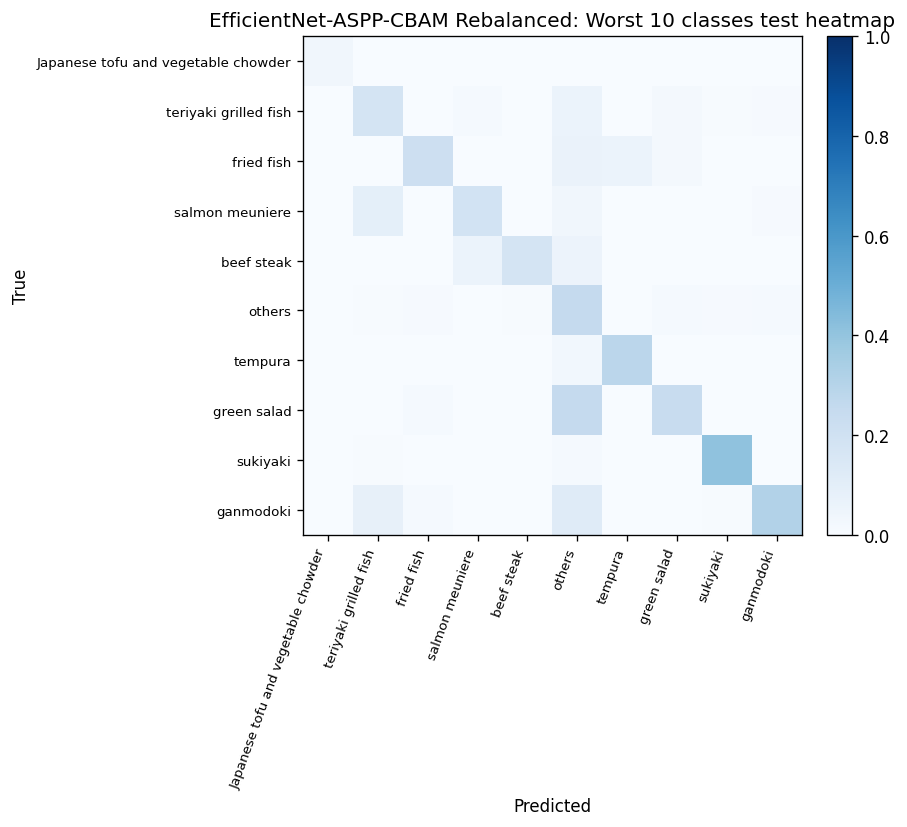

Best epoch: 42
Best validation mIoU: 0.453779810847747
Test result: {'test_loss': 2.5711763725280763, 'test_accuracy': 0.7717964518229167, 'test_miou': 0.4272286306569894}


In [14]:
REBALANCED_ASPP_CBAM_CONFIG = {
    "encoder_learning_rate": 1e-5,
    "head_learning_rate": 2.5e-4,
    "weight_decay": 5e-4,
    "dropout": 0.20,
    "dice_weight": 0.7,
    "label_smoothing": 0.05,
    "early_stopping_patience": 8,
    "scheduler_patience": 3,
    "lr_factor": 0.5,
    "freeze_encoder_epochs": 5,
    "pretrained": True,
    "max_epochs": 45,
}

if RUN_TRAINING:
    seed_everything(SEED)
    model = EfficientNetASPPCBAM(
        pretrained=REBALANCED_ASPP_CBAM_CONFIG["pretrained"],
        dropout=REBALANCED_ASPP_CBAM_CONFIG["dropout"],
    )
    head_parameters = [
        parameter
        for name, parameter in model.named_parameters()
        if not name.startswith("encoder.")
    ]
    optimizer = torch.optim.AdamW(
        [
            {"params": model.encoder.parameters(), "lr": REBALANCED_ASPP_CBAM_CONFIG["encoder_learning_rate"]},
            {"params": head_parameters, "lr": REBALANCED_ASPP_CBAM_CONFIG["head_learning_rate"]},
        ],
        weight_decay=REBALANCED_ASPP_CBAM_CONFIG["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=REBALANCED_ASPP_CBAM_CONFIG["lr_factor"],
        patience=REBALANCED_ASPP_CBAM_CONFIG["scheduler_patience"],
    )
    criterion = BalancedDiceCrossEntropyLoss(
        class_weights=build_pixel_class_weights(train_pixel_counts).to(get_device()),
        dice_weight=REBALANCED_ASPP_CBAM_CONFIG["dice_weight"],
        ignore_background_in_dice=True,
        label_smoothing=REBALANCED_ASPP_CBAM_CONFIG["label_smoothing"],
    )
    rebalanced_aspp_cbam_result = train_model(
        "EfficientNet-ASPP-CBAM Rebalanced",
        model,
        rebalanced_train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer,
        scheduler,
        REBALANCED_ASPP_CBAM_CONFIG,
        "EfficientNet_ASPP_CBAM_Rebalanced_best_model.pt",
    )

## 25. Results Summary

This cell summarises all model results in one table and visualises the key comparison.
If the notebook has not been rerun, the table uses previously recorded project results as a reference.

### Recorded Results From Previous Runs

The table below records the completed experiment results already obtained in the project notebooks. If this combined notebook is rerun, the following code cell will generate an updated table from the current run.

| Model | Test accuracy | Test mIoU |
|---|---:|---|
| EfficientNet-B0 | 0.7938 | 0.4643 |
| DenseNet-121 | 0.7791 | 0.4240 |
| ResNet50-FCN | 0.7780 | 0.4162 |
| VGG16-FCN | 0.7141 | 0.2763 |
| EfficientNet-B0 + Simple Augmentation | 0.7974 | 0.4772 |
| EfficientNet-ASPP-CBAM | 0.7722 | 0.4234 |
| EfficientNet-ASPP-CBAM Rebalanced | 0.7718 | 0.4272 |


## 26. Discussion

The best recorded result came from **EfficientNet-B0 with simple data augmentation**.
This suggests that controlled data augmentation improved generalisation without making the model much harder to optimise.

The ASPP-CBAM models were inspired by food segmentation literature, where multi-scale features and attention are useful.
However, in this project setting, the complex models did not consistently outperform the simpler EfficientNet model.
Possible reasons include limited training data, 102 fine-grained food classes, class imbalance, and the extra optimisation
difficulty introduced by a larger head.

The VGG16 baseline showed clear overfitting in earlier experiments. Therefore, this combined notebook uses a more conservative
VGG16 configuration: lower learning rate, stronger weight decay, higher dropout, early stopping, and initial encoder freezing.

Overall, the project shows that a stable pretrained backbone with carefully controlled augmentation can be more reliable than
simply adding architectural complexity.

## 27. Conclusion and Future Work

This project implemented and compared several food semantic segmentation approaches:

- Four baseline models: EfficientNet-B0, DenseNet-121, ResNet50-FCN, and VGG16-FCN.
- EfficientNet-B0 with stronger data augmentation.
- EfficientNet-ASPP-CBAM inspired by multi-scale attention-based food segmentation literature.
- Rebalanced ASPP-CBAM with weighted sampling and foreground-aware augmentation.

The final recommended model is **EfficientNet-B0 with simple data augmentation**, because it achieved the strongest recorded
test mIoU while keeping the architecture simple and stable.

Future work could use a stronger segmentation architecture, longer training, more careful hyperparameter search, and loss
functions designed for small or visually similar food categories.